# import packages

use conda environment "2022_Peer_SPADE_cellrank2"

In [3]:
# custom libraries

from SPECTRA_processing_utils import *
from scrnaseq_preprocessing_utils import *

# packages
import scanpy as sc
import scanpy.external as sce
import anndata as anndata
#import diffxpy.api as de
from anndata import AnnData
import time
import os
import numpy as np
import seaborn as sns
import pandas as pd
import re
import h5py
import scipy
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
import matplotlib.colors as colors
import matplotlib.font_manager
import glob
from collections import OrderedDict
from scipy.sparse import csr_matrix
from scanpy.external.pp import magic
from scipy.stats import zscore
import scipy.cluster.hierarchy as hc
from statistics import median
import math
from typing import Union

import numpy.matlib

In [4]:
!conda list

# packages in environment at /home/wallet/miniconda3/envs/2022_Peer_SPADE_cellrank2:
#
# Name                    Version                   Build  Channel
_libgcc_mutex             0.1                 conda_forge    conda-forge
_openmp_mutex             4.5                       2_gnu    conda-forge
_r-mutex                  1.0.1               anacondar_1    conda-forge
alabaster                 0.7.12                     py_0    conda-forge
alsa-lib                  1.2.6.1              h7f98852_0    conda-forge
anndata                   0.8.0           py310hff52083_0    conda-forge
anyio                     3.6.1           py310hff52083_0    conda-forge
appdirs                   1.4.4              pyh9f0ad1d_0    conda-forge
argon2-cffi               21.3.0             pyhd8ed1ab_0    conda-forge
argon2-cffi-bindings      21.2.0          py310h5764c6d_2    conda-forge
arpack                    3.7.0                hdefa2d7_2    conda-forge
asttokens                 2.0.5            

In [5]:
DATA_DIR = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/'
fig_save_path =  '/data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/'

In [6]:
#colors and styles

#set style
sns.set_style('white')
# define colors

color_map_clusters_nogrey = ["#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

blue_red = ['#0E518F','#DF480F']

batlow_20 = ['#1d2356','#1d2b59',
'#14375e',
'#134460',
'#1c5261',
'#235f5f',
'#396a58',
'#4c714e',
'#607843',
'#757e36',
'#8d8532',
'#a78b30',
'#c49138',
'#dc954d',
'#f09c6a',
'#f8a487',
'#f8aca2',
'#f8b5be',
'#f8c2d9',
'#eecbe1'] 
import random
random.seed(1)
random.shuffle(batlow_20)

subtype_color_dict = {'global':'#FFFFFF','TAM':'#FFFF00',
                 'DC_cDC2A':'#1CE6FF',
                 'pDC':'#FF34FF',
                 'M-MDC':'#FF4A46',
                 'mono_c':'#008941',
                 'mast':'#006FA6',
                      'TAM_TRMac':'#456D75',
                 'DC_cDC1':'#A30059',
                 'Gr-MDC':'#7A4900',
                 'DC_Langerhans':'#0000A6',
                      'DC_AXLpos_ITGAXpos':'#0CBD66',
                      'DC_FDC_PTPRCpos':'#EEC3FF',
                'DC_cDC3':'#63FFAC',
                'CD8_T':'#B79762',
                'Treg':'#004D43',
                'CD4_T':'#8FB0FF',
                'CD8_T':'#997D87',
                 'NK':'#5A0007',
                 'gdT':'#809693',
                    'ILC3':'#7900D7',
                       'CD8_T_KLRG1pos_effector_preexhausted':'#4FC601',
                 'CD4_T_naive':'#3B5DFF',
                 'CD4_T_TH1':'#4A3B53',
                 'CD8_T_TRM':'#FF2F80',
                'CD8_T_TRM_exhausted':'#61615A',
                 'CD8_T_naive':'#BA0900',
                 'CD8_T_KLRG1pos_effector_preexhausted':'#6B7900',
             'CD4_T_naive_low_libsize':'#00C2A0',
                 'CD8_T_naive':'#FFAA92',
             'NK_CD56bright':'#FF90C9',
                 'CD8_T_TEM_effector_exhausted-progenitor':'#B903AA',
            'gdT':'#D16100',
              'CD8_T_KLRG1pos_effector_nonexhausted':'#DDEFFF',
              'CD8_T_TRM_exhausted_proliferating':'#000035',
            'CD4_T_TH1_proliferating':'#7B4F4B',
               'NK_CD56dim':'#A1C299',
               'Treg':'#300018',
                  'CD8_T_KLRG1pos_effector_preexhausted':'#0AA6D8',
                         'MDC':'#013349',
                 'DC':'#00846F',
                'mixed_T_M':'#636375',
                        'B_memory':'#372101',
                
                 'B_naive':'#FFB500',
                'plasma':'#C2FFED',
                'B_GC':'#A079BF',
                    'B_memory_switched':'#CC0744',
                'plasma_IgA':'#C0B9B2',
                 'B_memory_double_neg':'#C2FF99',
               'plasma_IgG':'#001E09',
                'plasmablast':'#00489C',
               'plasma_Be1':'#6F0062',
                     'M':'#B77B68',
                     'TNK':'#7A87A1',
                     'B':'#788D66',
                     'TAM_MKlike':'#885578',
                     'mono':'#34362D',
                     'mono_c':'#B4A8BD',
                     'mono_nc':'#00A6AA',
                     'ILC1':'#452C2C',
                     'CD4_T_TFH':'#A3C8C9',
                     'CD4_T_TFH_exhausted-progenitor':'#FF913F',
                     'CD4_T_TSCM':'#938A81',
                     'CD8_T_KLRG1neg_effector_preexhausted':'#575329',
                     'CD8_T_KLRG1pos_effector_exhausted':'#00FECF',
                     'CD8_T_TRM_nonexhausted':'#B05B6F',
                     'CD8_T_innate-like':'#8CD0FF',
                     'TNK_proliferating':'#3B9700',
                     'NK_CD56dim_proliferating':'#04F757',
                     'T':'#C8A1A1',
                     'T_proliferating':'#1E6E00',
                     'B_memory':"#BC23FF",
                      'B_naive':"#A77500",
                      'plasma':"#6367A9",
                 'B_GC':"#A05837",
                      'B_memory_switched':"#6B002C",
                 'B_naive':"#772600",
              'plasma_IgA':"#D790FF",
                'B_memory_double_neg':"#9B9700",
               'plasma_IgG':"#549E79",
                 'plasmablast':"#FFF69F",
                'plasma_IgG':"#201625",
                 'plasma_Be1':"#72418F",
                      'B':"#922329", 
                      'TNK':"#99ADC0",
                      'M': "#3A2465",
                      'nan':'#000000',
                      'B_GC_proliferating':'#5B4534',
                      'B_memory_switched_Be1':'#FDE8DC',
                      'B_memory_switched_proliferating':'#404E55',
                      'plasma_IgG_Be1':'#0089A3',
                       'B_proliferating':'#CB7E98'
                }

expansion_dict = {'NE':'#0E518F','E': '#DF480F','nan':'#dedede'}
timepoint_dict = {'Pre':'#0E518F','On': '#DF480F','nan':'#dedede'}
perturbation_map = ['#EFD060','#0289DE','#0289DE','#DCA6C4']
stage_map = ['#EFD060','#0289DE','#67C6F8','#DCA6C4']
stage_map_2 = ['#EFD060','#0289DE','#DCA6C4']
perturbation_stage_map_2 = ['#F95957', '#FF0300','#EFD060','#0289DE','#0289DE','#DCA6C4','#EFD060','#0289DE','#DCA6C4']
perturbation_stage_map = ['#F95957', '#FF0300','#e1e1e1','#e1e1e1','#e1e1e1','#e1e1e1', '#EFD060','#0289DE','#DCA6C4']
treat_untreat_palette = ['#0E518F', '#DF480F', '#a7a7a7']
#scanpy layout
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=300, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=True, ipython_format='png2x')
sns.set_style('white')

NameError: name 'color_map_clusters' is not defined

# recalculate embeddings

Initially, we used only the most dominant principal components to cluster annotate and partition the data containing all leukocytes into major immune subtypes using  which were processed separately to obtain more granular annotations within each major subtype which were then mapped back to the data containing all leukocytes.

Here, we recalculate embeddings using more principical components to have a better visualization of these granular annotations in the data containing all leukocytes.



In [15]:
#load adata
adata = sc.read(adata_path)
adata

Only considering the two last: ['.0_50PC_reembedded', '.h5ad'].
Only considering the two last: ['.0_50PC_reembedded', '.h5ad'].


AnnData object with n_obs × n_vars = 97863 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

In [ ]:
isinstance(adata.X, scipy.sparse.csr_matrix) !=True

In [ ]:
if isinstance(adata.X, scipy.sparse.csr_matrix) != True:
    adata.X = scipy.sparse.csr_matrix(adata.X)
adata.X

In [ ]:
#select optimal number of PCs and recalculate PCs
number_of_PC_used = calculate_optimal_PC(adata, min_PC = 50, min_var=25, n_comps=100, use_hv=None)

In [ ]:
#recalc umap
sc.pp.neighbors(adata, n_neighbors=10, method= 'umap', n_pcs=number_of_PC_used,random_state=0)
sc.tl.umap(adata,random_state=0)

In [ ]:
#recalc tsne
sc.tl.tsne(adata, random_state = 7, n_pcs=number_of_PC_used)

#recalc fdl
sc.tl.draw_graph(adata, layout='fa', init_pos=None, root=None, random_state=0, n_jobs=None, adjacency=None, key_added_ext=None, neighbors_key=None, obsp=None, copy=False)

In [ ]:
#recalc DCs
sc.tl.diffmap(adata, n_comps=15, neighbors_key=None, copy=False)

In [ ]:
#recalculate magic
a = magic(adata, copy=True, verbose=True, solver= 'exact', n_pca=adata.obsm['X_pca'].shape[1], knn=5, t=3)
adata.layers['imputed'] = a.X

In [ ]:
#recalculate magic
a = magic(adata, copy=True, verbose=True, solver= 'approximate', n_pca=adata.obsm['X_pca'].shape[1], knn=5, t=3)
adata.layers['imputed'] = a.X

In [ ]:
adata_path

In [ ]:
adata.write('/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_MAGICapprox.h5ad')

In [ ]:
#save
adata.write(adata_save_path)
print('saved adata to:',adata_save_path)

# overview factors vs input gene sets

In [5]:
#data paths

adata_path = DATA_DIR + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded.h5ad'

#paths
identity_path = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/SPECTRA_celltypes_x_genesets_x_versions_x_genes.csv'
input_gene_sets = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/SPADE_genes_x_genesets.csv'
input_gene_set_x_celltypes_global = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/SPADE_cells_x_genesets_general.csv'
input_gene_set_x_celltypes_specific = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/SPADE_cells_x_genesets_celltype-specific_modified_for_SPADE.csv'
metadata = DATA_DIR + 'SPADE_genesets_x_geneset_metadata_mod.csv'

In [6]:
#adata
adata = sc.read(adata_path)

Only considering the two last: ['.0_50PC_reembedded', '.h5ad'].
Only considering the two last: ['.0_50PC_reembedded', '.h5ad'].


In [7]:
unlabeled = []

markers_of_interest = list(adata.uns['SPADE_markers_global'].keys())

for i in adata.uns['SPADE_markers_specific']:
    for v in adata.uns['SPADE_markers_specific'][i]:
        markers_of_interest.append(v)

for i in markers_of_interest:
    if len(i)<10:
        unlabeled.append(i)
        

In [8]:
adata = randomize_cells(adata)

In [9]:
#load input gene sets
input_df = pd.read_csv(input_gene_sets)
input_global_df = pd.read_csv(input_gene_set_x_celltypes_global)
input_specific_df = pd.read_csv(input_gene_set_x_celltypes_specific)
metadata_df = pd.read_csv(metadata)

In [10]:
#unique gen fraction per gene set:
max_overlap_df = pd.DataFrame()

for i in set(input_df['gs.name']):
        for j in set(input_df['gs.name']):
            if i!=j:
                set_a = set(input_df[input_df['gs.name']==i]['g.name'])
                set_b = set(input_df[input_df['gs.name']==j]['g.name'])
                overlap = overlap_coefficient(set_a,set_b)#1- (len(set_a.intersection(set_b))/len(set_a))
                max_overlap_df.loc[i,j]= overlap
            else:
                max_overlap_df.loc[i,j]= 0

     

/home/wallet/.local/lib/python3.10/site-packages/pandas/core/indexing.py:1684: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.obj[key] = infer_fill_value(value)


In [11]:
#all gene sets contained in metadata
all_genesets = set(input_specific_df['gs.name']).union(set(input_global_df['gs.name']))
metadata_genesets = set(metadata_df.index)

print('metadata available for all gene sets:', len(all_genesets)==len(all_genesets.intersection(metadata_genesets)))

metadata available for all gene sets: False


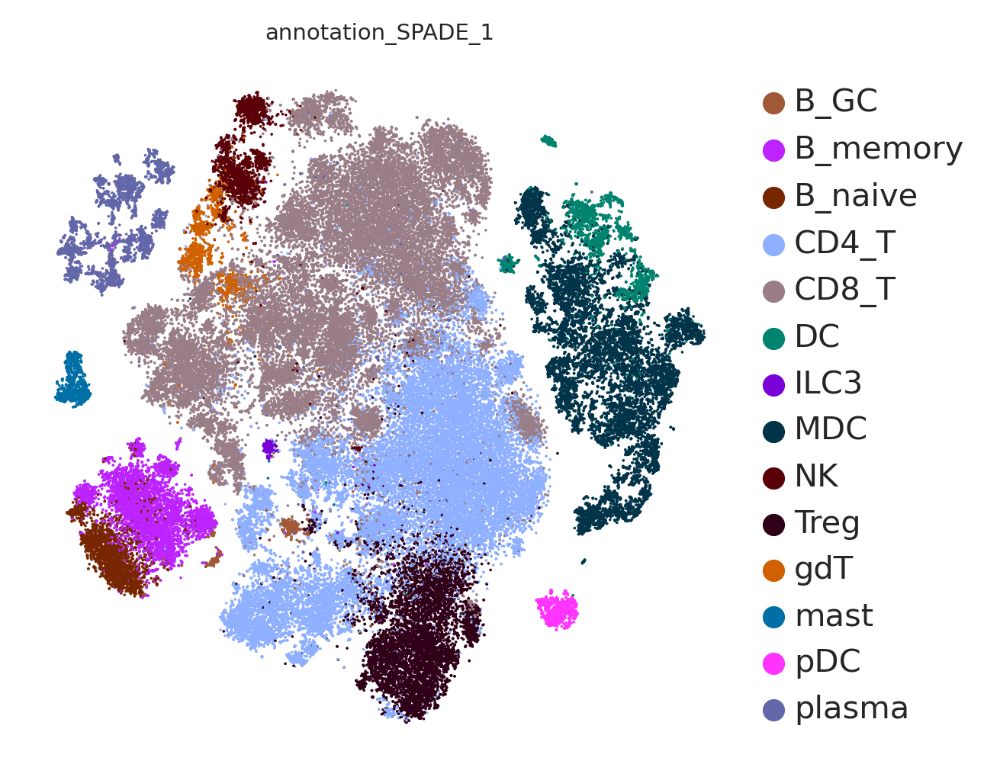

In [36]:
dp = sc.pl.tsne(adata, color = 'annotation_SPADE_1', s = 3, cmap='Spectral_r', palette=subtype_color_dict,legend_fontsize = 10, vmin=0,vmax=15,
          save='Bassez_tsne_annotation_final.svg', return_fig = True)

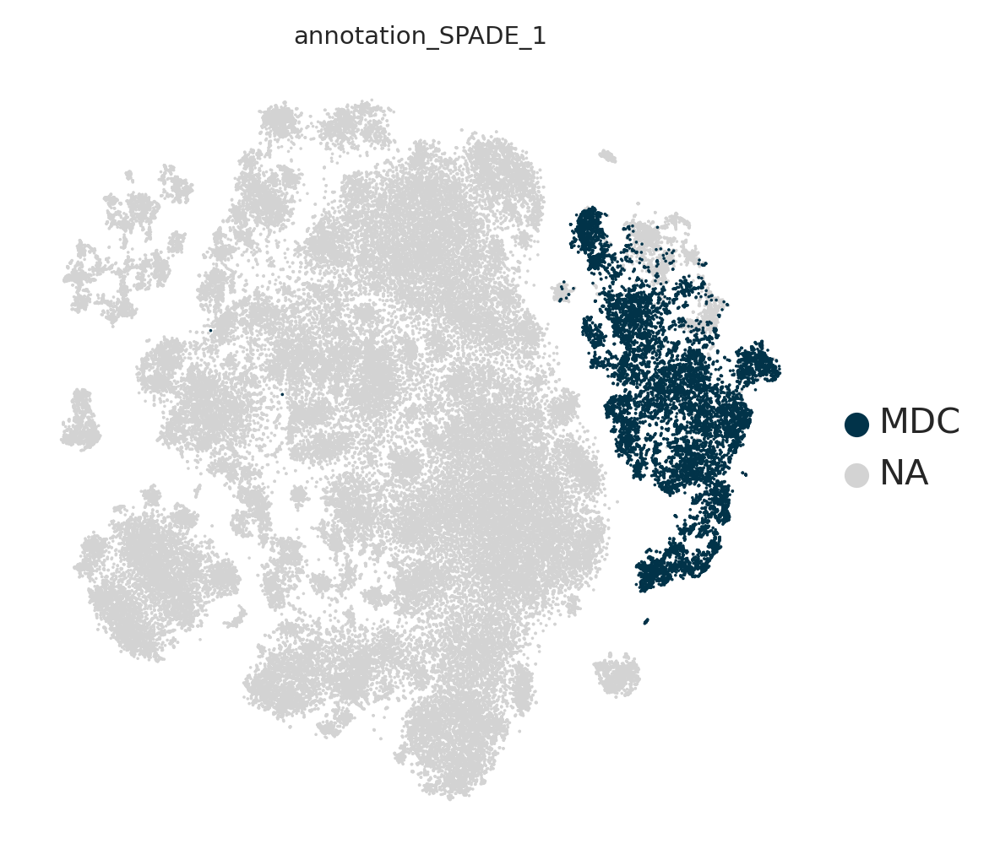

In [39]:
save_name = 'Bassez_TAM_tsne.svg'
sc.pl.tsne(adata, color = 'annotation_SPADE_1', s = 3, groups=['MDC'], palette=subtype_color_dict,legend_fontsize = 10,
           save=save_name,vmin=0,vmax=15)

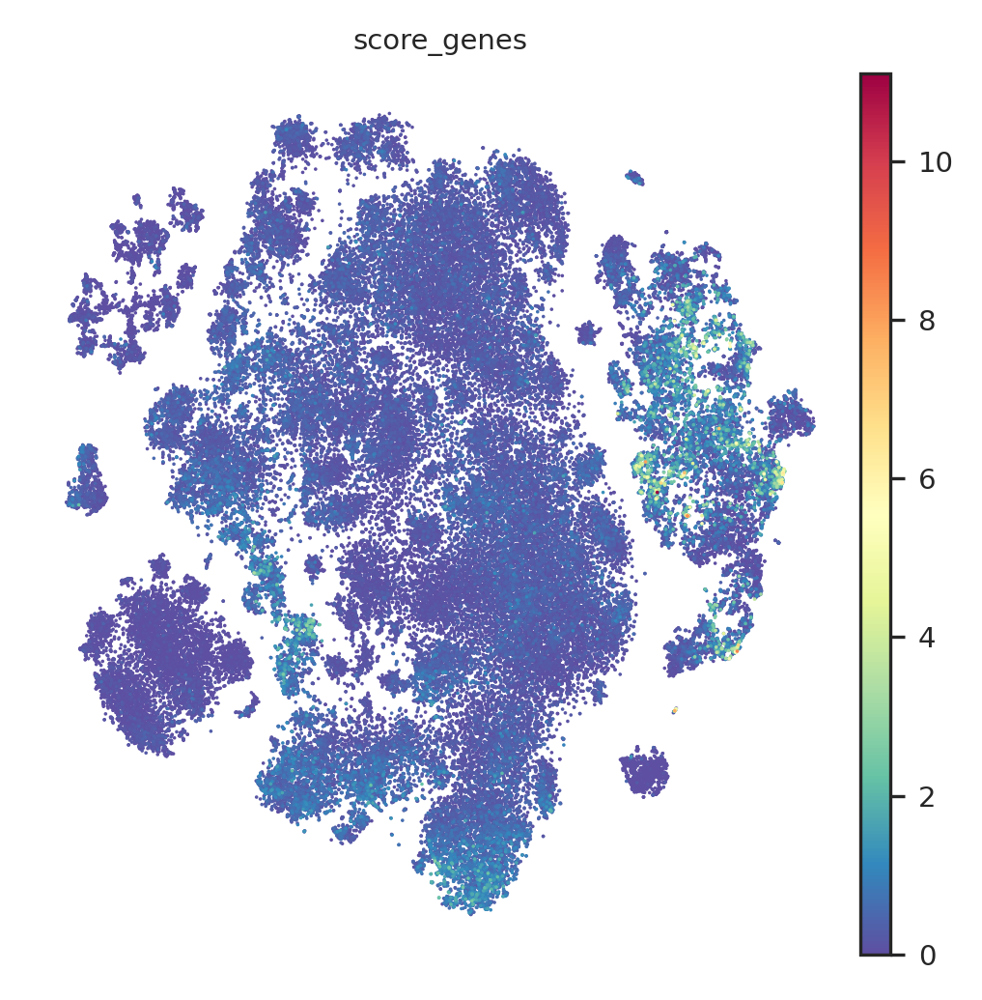

In [42]:
#compare with scoregenes
gene_set_list = list(input_df[input_df['gs.name']=='TNK_PD-1_signaling']['g.name'])

sc.tl.score_genes(adata, gene_set_list, ctrl_size=50, gene_pool=None, n_bins=25, score_name='score_genes', random_state=0, copy=False, use_raw=None)

sc.pl.tsne(adata, color = 'score_genes', s = 3, cmap='Spectral_r', legend_fontsize = 10, vmin=0, save='score_genes-Bassez.svg')

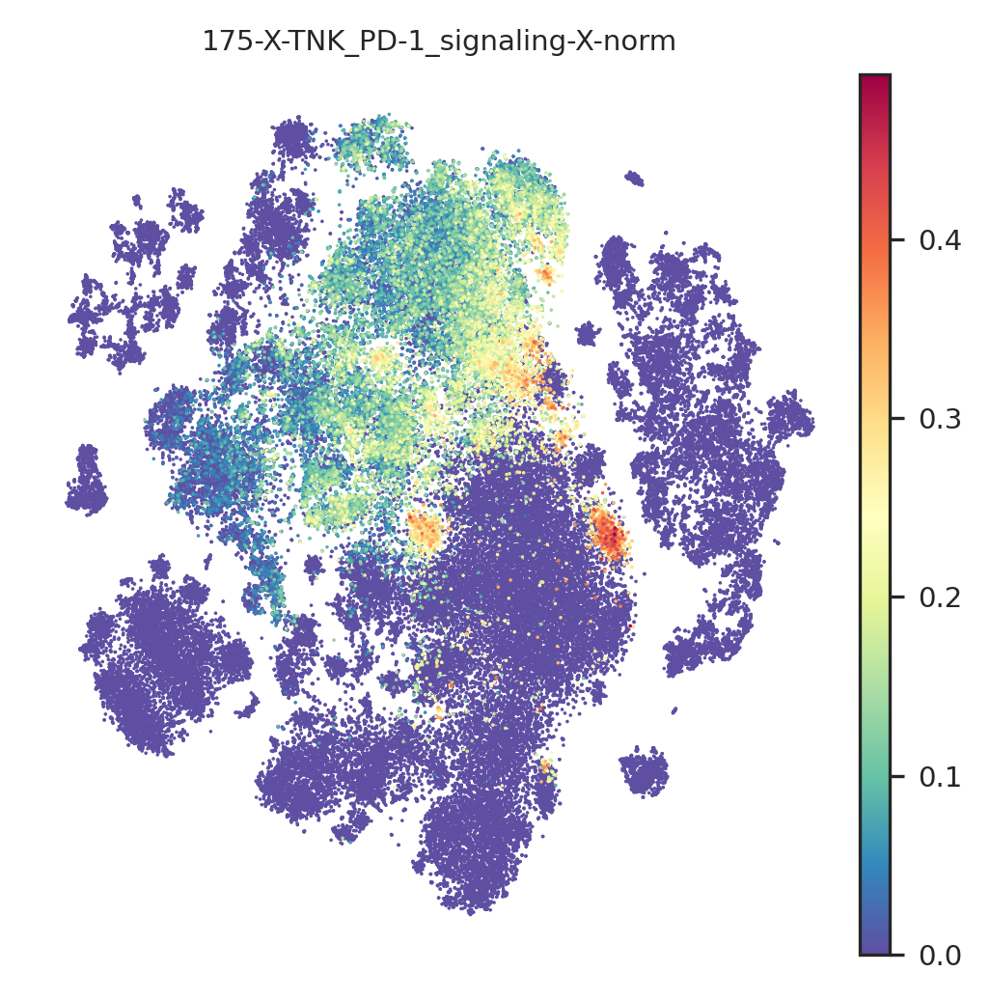

In [43]:
sc.pl.tsne(adata, color = '175-X-TNK_PD-1_signaling-X-norm', s = 3, cmap='Spectral_r', legend_fontsize = 10, vmin=0,
          save='Bassez_SPECTRA_tsne_PD1rece.svg')

/home/wallet/miniconda3/envs/2022_Peer_SPADE_cellrank2/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


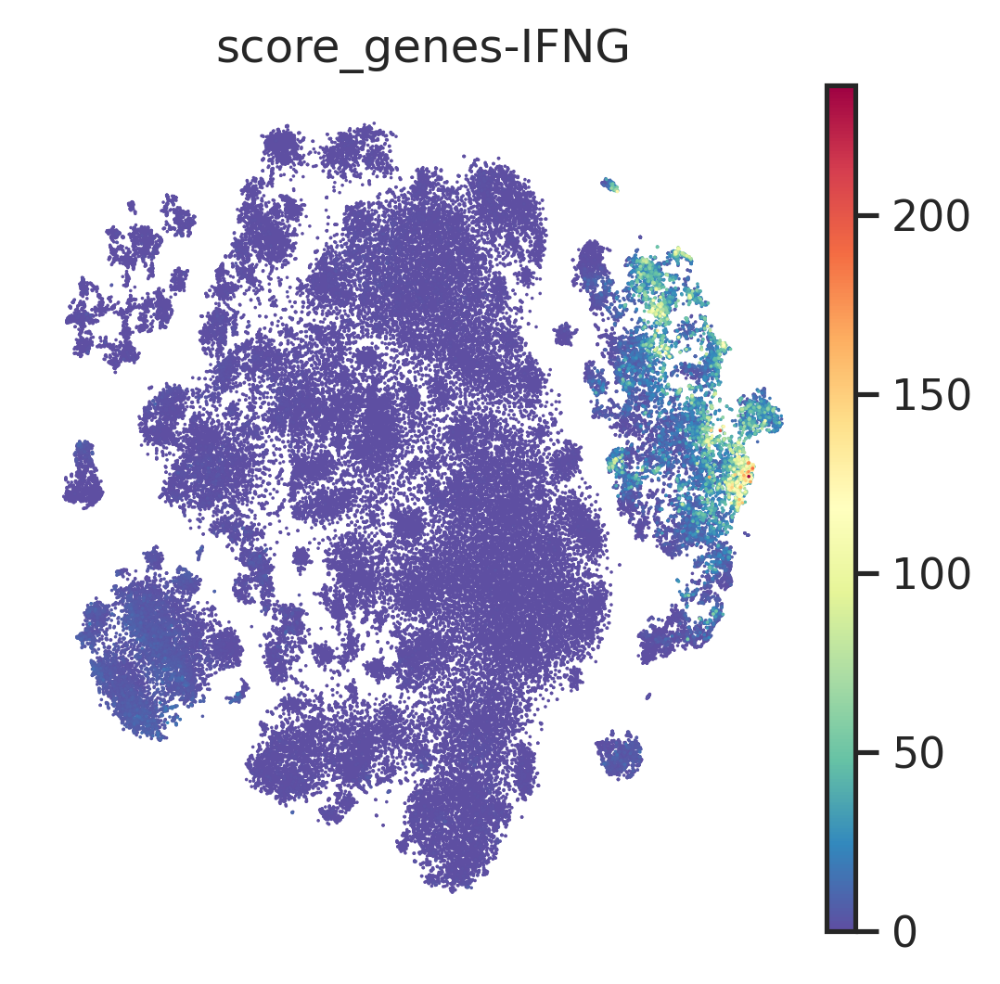

In [50]:
#compare with scoregenes
gene_set_list = list(input_df[input_df['gs.name']=='all_type-II-ifn-response']['g.name'])

sc.tl.score_genes(adata, gene_set_list, ctrl_size=50, gene_pool=None, n_bins=25, score_name='score_genes-IFNG', random_state=0, copy=False, use_raw=None)

sc.pl.tsne(adata, color = 'score_genes-IFNG', s = 3, cmap='Spectral_r', legend_fontsize = 10, vmin=0, save='score_genes-Bassez.svg')

In [16]:
adata.obs['is_Mac'] =  pd.Categorical((adata.obs['annotation_SPADE_1']=='MDC').astype(str))
set(adata.obs['is_Mac'])

/scratch/lsftmp/13708153.tmpdir/ipykernel_622419/3915120220.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['is_Mac'] =  pd.Categorical((adata.obs['annotation_SPADE_1']=='MDC').astype(str))


{'False', 'True'}

saved Figure to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_IFNGR1_dot_imputed.svg
SpearmanrResult(correlation=0.371499234147762, pvalue=0.0)
Pearson: (0.6926293523539229, 0.0)


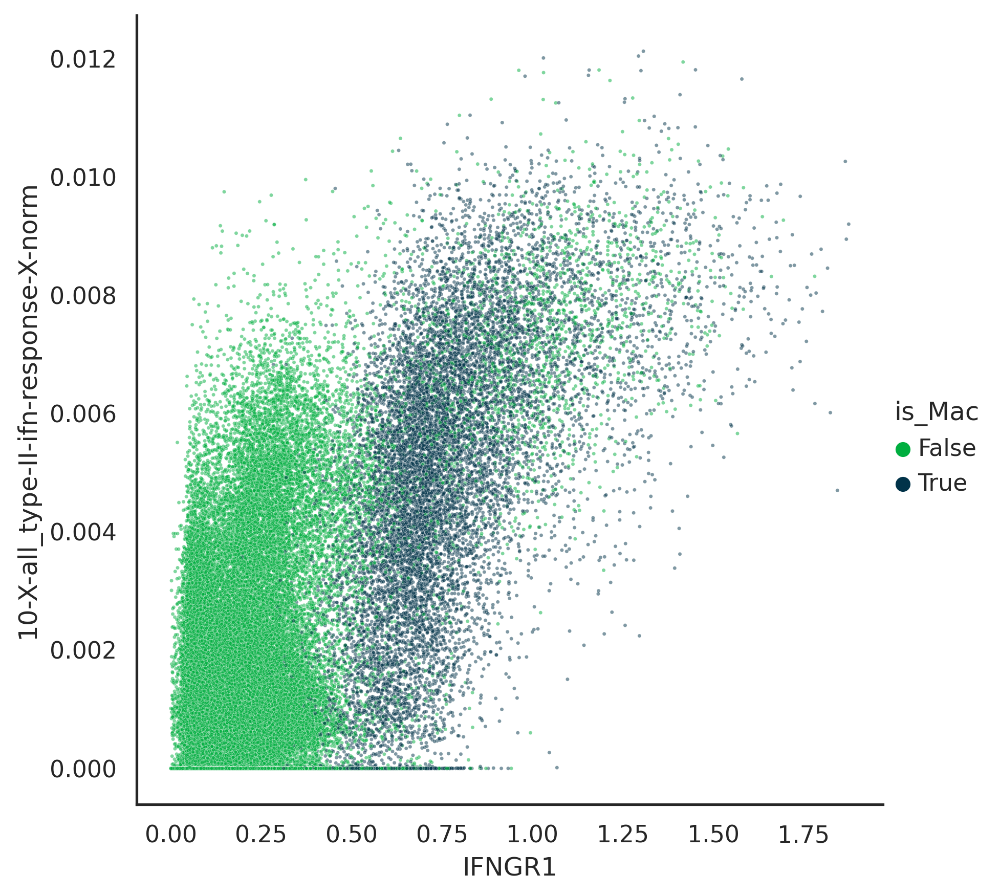

In [17]:
factor ='10-X-all_type-II-ifn-response-X-norm'
celltype = 'is_Mac'
receptor ='IFNGR1'
use_imputed = True
adata  = randomize_cells(adata)
save_name = 'Bassez_IFNGR1_dot_imputed.svg'

sns.set_theme(style="white")

if use_imputed:
    receptor_exp = np.array(adata[:,receptor].layers['imputed']).flatten()
else:
    receptor_exp = np.array(adata[:,receptor].X.todense()).flatten()
sns.relplot(x=receptor_exp, y=adata.obs[factor], hue=adata.obs[celltype],
            sizes=(40, 400), alpha=.5, palette={'True':'#013349','False':'#00AE3F'},
            height=6,s=3)

title_corr = scipy.stats.spearmanr(receptor_exp, np.array(adata.obs[factor]), axis=0, nan_policy='propagate')
plt.xlabel(receptor)
fig_save_path_complete = fig_save_path+save_name
plt.savefig(fig_save_path_complete,dpi=300)
print('saved Figure to:',fig_save_path_complete)
print(scipy.stats.spearmanr(receptor_exp, b=adata.obs[factor], axis=0, nan_policy='propagate', alternative='two-sided'))
print('Pearson:',scipy.stats.pearsonr(receptor_exp, adata.obs[factor]))

/home/wallet/miniconda3/envs/2022_Peer_SPADE_cellrank2/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


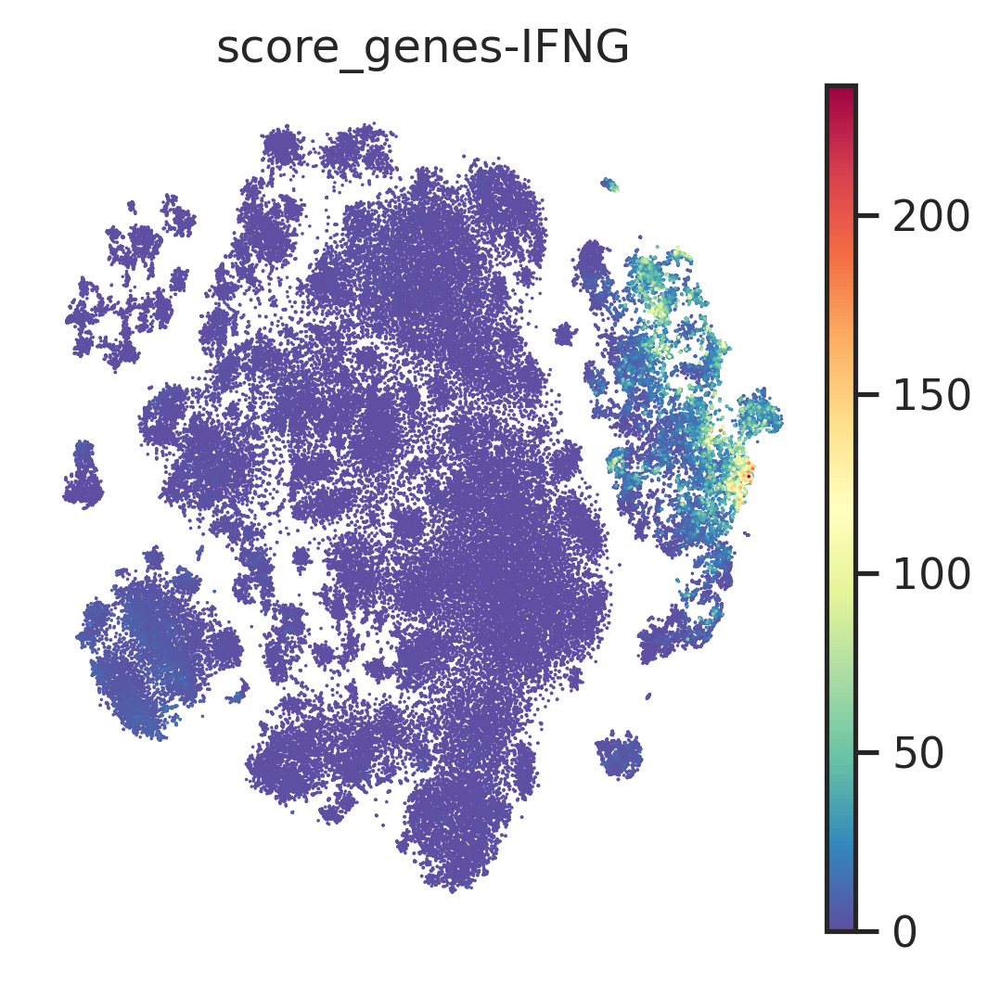

In [18]:
#compare with scoregenes
gene_set_list = list(input_df[input_df['gs.name']=='all_type-II-ifn-response']['g.name'])

sc.tl.score_genes(adata, gene_set_list, ctrl_size=50, gene_pool=None, n_bins=25, score_name='score_genes-IFNG', random_state=0, copy=False, use_raw=None)

sc.pl.tsne(adata, color = 'score_genes-IFNG', s = 3, cmap='Spectral_r',vmin=0, legend_fontsize = 10,save='Bassez_score_genes-Bassez-IFNG.svg')

saved Figure to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_IFNGR1_dot_imputed_scoregenes.svg
SpearmanrResult(correlation=0.4663383551188025, pvalue=0.0)
Pearson: (0.5944166155208023, 0.0)


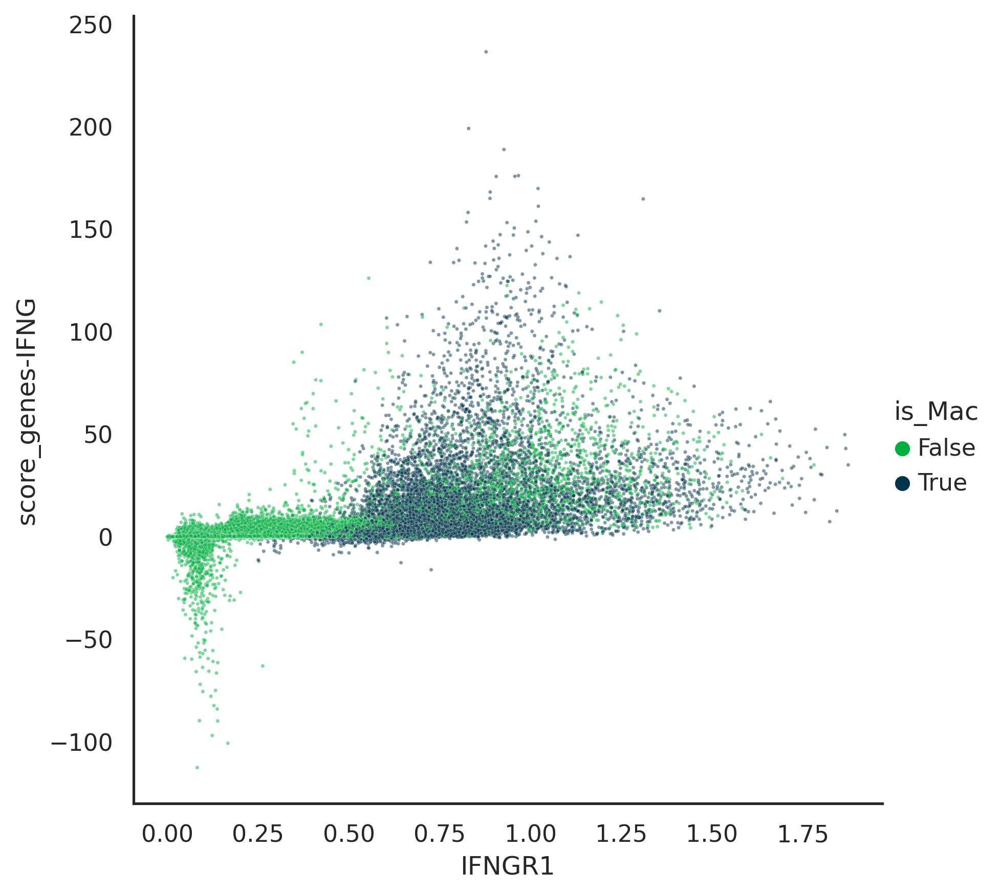

In [19]:
factor ='score_genes-IFNG'
celltype = 'is_Mac'
receptor ='IFNGR1'
use_imputed = True
adata  = randomize_cells(adata)
save_name = 'Bassez_IFNGR1_dot_imputed_scoregenes.svg'

sns.set_theme(style="white")

if use_imputed:
    receptor_exp = np.array(adata[:,receptor].layers['imputed']).flatten()
else:
    receptor_exp = np.array(adata[:,receptor].X.todense()).flatten()
sns.relplot(x=receptor_exp, y=adata.obs[factor], hue=adata.obs[celltype],
            sizes=(40, 400), alpha=.5,palette={'True':'#013349','False':'#00AE3F'},
            height=6,s=3)
title_corr = scipy.stats.spearmanr(receptor_exp, np.array(adata.obs[factor]), axis=0, nan_policy='propagate')
plt.xlabel(receptor)
fig_save_path_complete = fig_save_path+save_name
plt.savefig(fig_save_path_complete,dpi=300)
print('saved Figure to:',fig_save_path_complete)
print(scipy.stats.spearmanr(receptor_exp, b=adata.obs[factor], axis=0, nan_policy='propagate', alternative='two-sided'))
print('Pearson:',scipy.stats.pearsonr(receptor_exp, adata.obs[factor]))

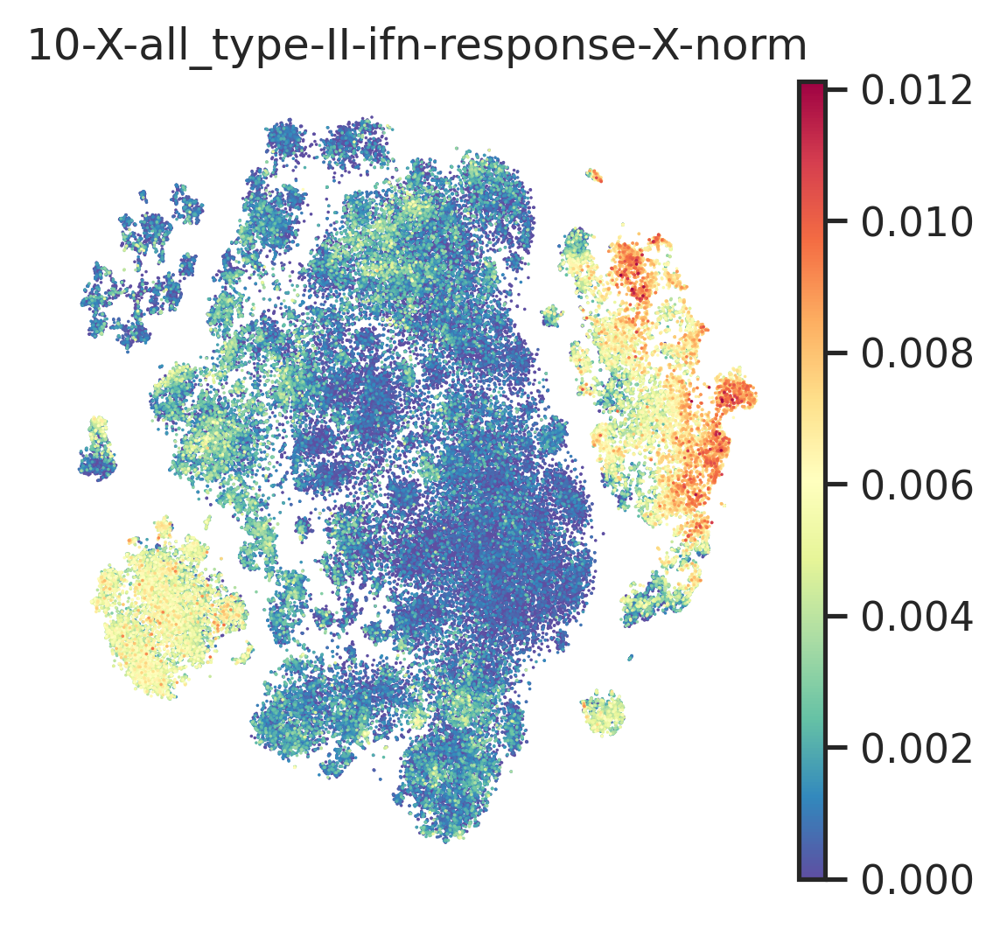

In [20]:
sc.pl.tsne(adata, color = '10-X-all_type-II-ifn-response-X-norm', s = 3, cmap='Spectral_r', legend_fontsize = 10, vmin=0,
          save='Bassez_SPECTRA_tsne_IFNII.svg')

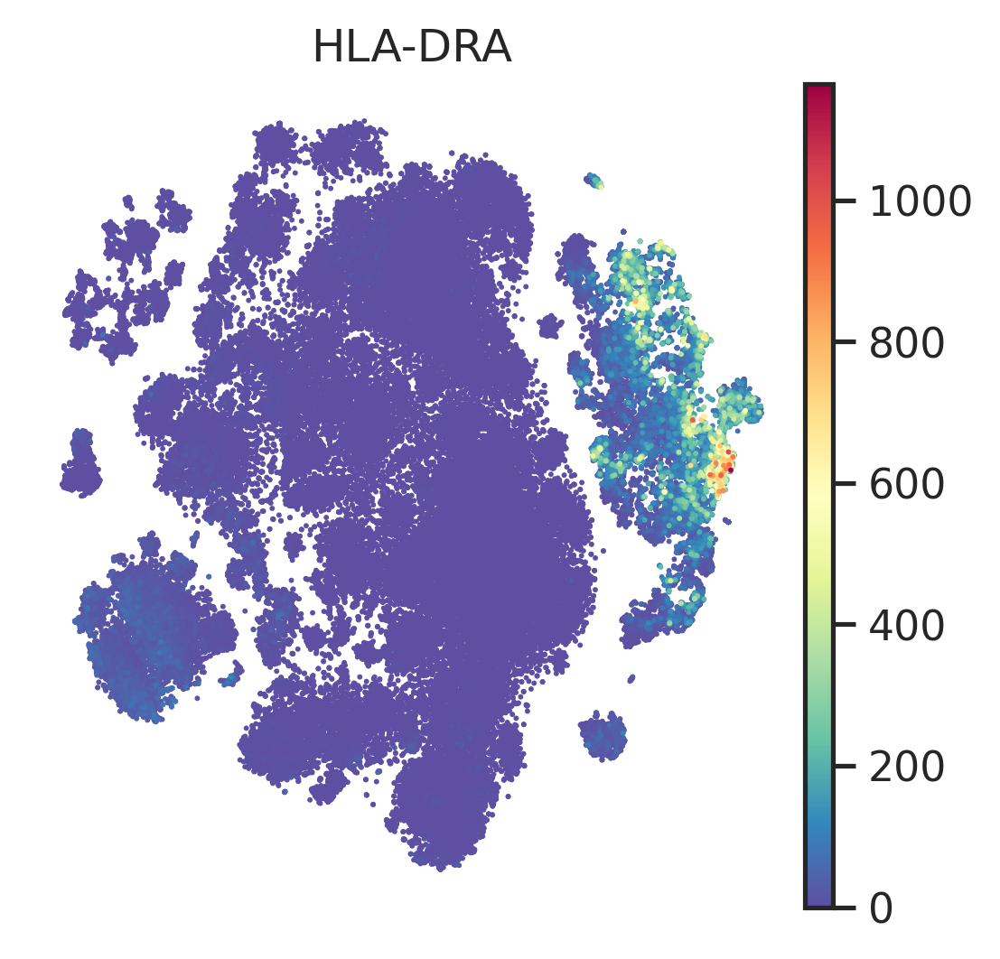

In [21]:
sc.pl.tsne(adata, color = ['HLA-DRA','HLA-DMB','HLA-DPA1'], s = 8, cmap='Spectral_r', legend_fontsize = 10, vmin=0,
          save='Bassez_SPECTRA_tsne_IFNII.svg')#,layer='imputed')

In [22]:
#calculate accuracy of predicting NE vs E from different DC embeddings
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance


markers_of_interest = list(input_df[input_df['gs.name']=='all_type-II-ifn-response']['g.name'])
class_dict_markers = {}
factor ='10-X-all_type-II-ifn-response-X-norm'

X = np.array(adata[:,[x for x in markers_of_interest if x in adata.var_names]].X.todense())
y = np.array(adata.obs[factor])
X_train, X_val, y_train, y_val = train_test_split( X, y, random_state=0,test_size=.25)
clf = LinearRegression(fit_intercept=False).fit(X_train, y_train)
clf.score(X_val, y_val)
r1 = permutation_importance(clf, X_val, y_val,
                           n_repeats=30,
                           random_state=0)

In [23]:
#calculate accuracy of predicting NE vs E from different DC embeddings
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance


markers_of_interest = list(input_df[input_df['gs.name']=='all_type-II-ifn-response']['g.name'])
markers_of_interest = [x for x in markers_of_interest if x in adata.var_names]
class_dict_markers = {}
factor ='score_genes-IFNG'

X = np.array(adata[:,markers_of_interest].X.todense())
y = np.array(adata.obs[factor])
X_train, X_val, y_train, y_val = train_test_split( X, y, random_state=0,test_size=.25)
clf = LinearRegression(fit_intercept=False).fit(X_train, y_train)
clf.score(X_val, y_val)
r2 = permutation_importance(clf, X_val, y_val,
                           n_repeats=30,
                           random_state=0)

In [24]:
#mean expressions
markers_of_interest = list(input_df[input_df['gs.name']=='all_type-II-ifn-response']['g.name'])
markers_of_interest = [x for x in markers_of_interest if x in adata.var_names]
mean_exp_list = []

for i in markers_of_interest:
    mean_exp_list.append(np.mean(adata[:,i].X))

In [25]:
factor_name_list = ['10-X-all_type-II-ifn-response-X-norm','score_genes-IFNG']
plot_df_list = []

for i in set(adata.obs['annotation_SPADE_1']):
    adata_celltype = adata[adata.obs['annotation_SPADE_1']==i]
    plot_df_list.append(aggregate_cell_scores(adata_celltype,'Bassez_timepoint', 'annotation_SPADE_1',factor_name_list,'batch','Bassez_patient_id',
                            ['timepoint','celltype','patient'],zero_cutoff =0.001).sort_values('patient').reset_index())
    

plot_df_list

[     index  10-X-all_type-II-ifn-response-X-norm timepoint celltype  \
 0   JUQ025                              0.003716        On       NK   
 1   JUQ024                              0.001760       Pre       NK   
 2   JUQ026                              0.001505       Pre       NK   
 3   JUQ027                              0.001735        On       NK   
 4   JUQ031                              0.001700        On       NK   
 ..     ...                                   ...       ...      ...   
 79  JUQ120                              0.001441        On       NK   
 80  JUQ121                              0.001277       Pre       NK   
 81  JUQ122                                   NaN        On       NK   
 82  JUQ123                              0.001014       Pre       NK   
 83  JUQ124                              0.001261        On       NK   
 
           patient  score_genes-IFNG  
 0   JUQ024_JUQ025          0.208279  
 1   JUQ024_JUQ025          0.163895  
 2   JUQ026_JUQ02

In [26]:
#Wilcoxon signed rank test comparing Pre and On
factor = '10-X-all_type-II-ifn-response-X-norm'
result_dict = {}
effect_dict = {}

for i in plot_df_list:
    df_pre = i[i['timepoint']=='Pre'].set_index('patient').fillna(0)
    df_on = i[i['timepoint']=='On'].set_index('patient').fillna(0)
    shared_patients = set(df_on.index).intersection(set(df_pre.index))
    df_pre = df_pre.reindex(shared_patients)
    df_on = df_on.reindex(shared_patients)
    print('pre and on patients identical',list(df_pre.index)==list(df_on.index))
    a = df_pre[factor]
    b= df_on[factor]
    result_dict[list(set(i['celltype']))[0]] = scipy.stats.wilcoxon(a, b, zero_method='wilcox', correction=False, 
                         alternative='two-sided',  axis=0, 
                         nan_policy='propagate')
    effect_dict[list(set(i['celltype']))[0]] = (np.mean(a)- np.mean(b))/np.std(a+b)
    
    

pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True


/home/wallet/miniconda3/envs/2022_Peer_SPADE_cellrank2/lib/python3.10/site-packages/scipy/stats/_morestats.py:3145: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


In [27]:
result_dict

{'NK': WilcoxonResult(statistic=289.0, pvalue=0.34573570837440926),
 'CD4_T': WilcoxonResult(statistic=237.0, pvalue=0.007317561361706958),
 'B_GC': WilcoxonResult(statistic=59.0, pvalue=0.1474161990774467),
 'CD8_T': WilcoxonResult(statistic=293.0, pvalue=0.047498192268905996),
 'B_naive': WilcoxonResult(statistic=129.0, pvalue=0.5645889043807983),
 'Treg': WilcoxonResult(statistic=282.0, pvalue=0.2944097491066251),
 'DC': WilcoxonResult(statistic=222.0, pvalue=0.011505333027757155),
 'mast': WilcoxonResult(statistic=75.0, pvalue=0.26272224684071965),
 'MDC': WilcoxonResult(statistic=339.0, pvalue=0.23574481188468444),
 'plasma': WilcoxonResult(statistic=220.0, pvalue=0.41064826930745923),
 'ILC3': WilcoxonResult(statistic=24.0, pvalue=0.23931654122149526),
 'pDC': WilcoxonResult(statistic=82.0, pvalue=0.017562701076178487),
 'gdT': WilcoxonResult(statistic=76.0, pvalue=0.981116590883351),
 'B_memory': WilcoxonResult(statistic=184.0, pvalue=0.052324482751182025)}

In [28]:
effect_dict

{'NK': -0.04923841084162617,
 'CD4_T': -0.32042702807109874,
 'B_GC': -0.22758456503020896,
 'CD8_T': -0.10548414371267781,
 'B_naive': -0.07497329696039143,
 'Treg': -0.06449306597064434,
 'DC': -0.2852804534664643,
 'mast': -0.1417906178503052,
 'MDC': -0.09337224244334988,
 'plasma': 0.1311165233036249,
 'ILC3': -0.17144654746564908,
 'pDC': -0.3405775771152601,
 'gdT': 0.06748826613772178,
 'B_memory': -0.19687216171359098}

In [29]:
plot_df = pd.concat(plot_df_list).fillna(0)
plot_df

,index,10-X-all_type-II-ifn-response-X-norm,timepoint,celltype,patient,score_genes-IFNG
0,JUQ025,0.003716,On,NK,JUQ024_JUQ025,0.208279
1,JUQ024,0.001760,Pre,NK,JUQ024_JUQ025,0.163895
2,JUQ026,0.001505,Pre,NK,JUQ026_JUQ027,0.379346
3,JUQ027,0.001735,On,NK,JUQ026_JUQ027,0.324687
4,JUQ031,0.001700,On,NK,JUQ030_JUQ031,0.368541
...,...,...,...,...,...,...
69,JUQ119,0.004362,Pre,B_memory,JUQ119_JUQ120,2.430522
70,JUQ120,0.005256,On,B_memory,JUQ119_JUQ120,1.452094
71,JUQ121,0.004650,Pre,B_memory,JUQ121_JUQ122,2.472351
72,JUQ122,0.005142,On,B_memory,JUQ121_JUQ122,2.807831


In [30]:
DATA_DIR

'/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/'

Bassez_celltype_boxplot10-X-all_type-II-ifn-response-X-norm.svg


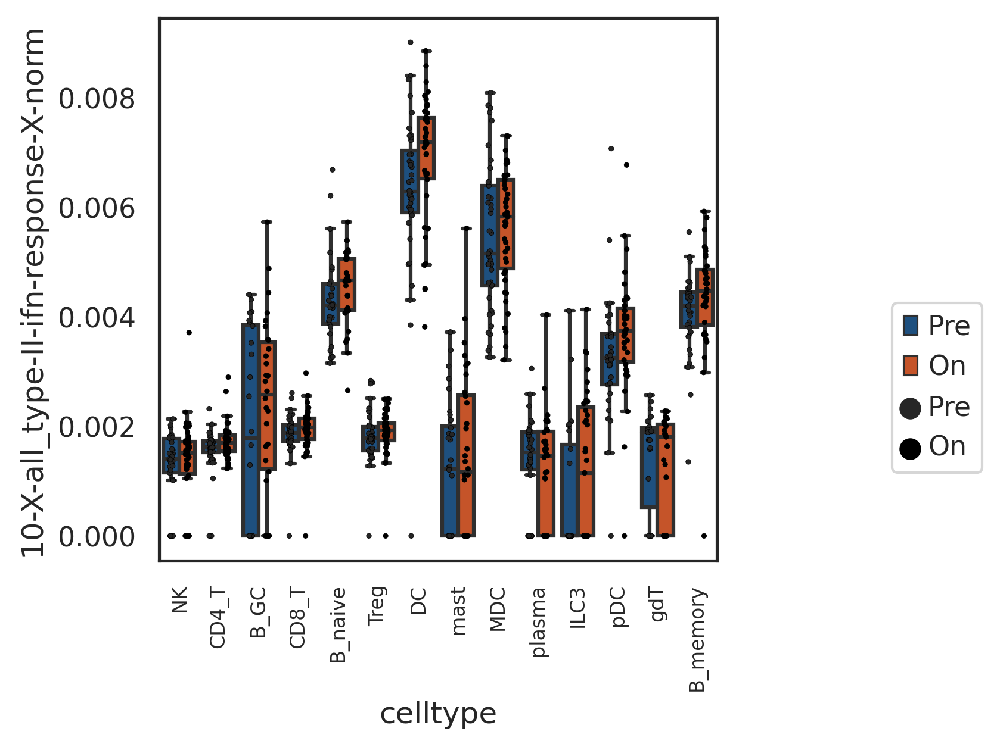

In [31]:
factor='10-X-all_type-II-ifn-response-X-norm'
sns.boxplot(data=plot_df,x='celltype', 
                y=factor, hue='timepoint', order=None, hue_order=['Pre','On'], 
                orient=None, color=None, palette=blue_red, saturation=0.75, width=0.8, 
                dodge=True, fliersize=0, linewidth=None, whis=1.5, ax=None)
sns.stripplot(data=plot_df,x='celltype', 
                y=factor, hue='timepoint', order=None, hue_order=['Pre','On'], 
                orient=None, color='#000000',s=2,
                dodge=True, linewidth=None, ax=None)
#plt.xlim(-25,100)
plt.legend(bbox_to_anchor=[1.5, 0.5])
plt.xticks(rotation=90,size=8)
plt.savefig(fig_save_path+'Bassez_celltype_boxplot'+factor+'.svg')
plot_df.to_csv(DATA_DIR + 'source_data/' 'FigureS3b_left_source.csv')
print('Bassez_celltype_boxplot'+factor+'.svg')

In [32]:
plot_df

,index,10-X-all_type-II-ifn-response-X-norm,timepoint,celltype,patient,score_genes-IFNG
0,JUQ025,0.003716,On,NK,JUQ024_JUQ025,0.208279
1,JUQ024,0.001760,Pre,NK,JUQ024_JUQ025,0.163895
2,JUQ026,0.001505,Pre,NK,JUQ026_JUQ027,0.379346
3,JUQ027,0.001735,On,NK,JUQ026_JUQ027,0.324687
4,JUQ031,0.001700,On,NK,JUQ030_JUQ031,0.368541
...,...,...,...,...,...,...
69,JUQ119,0.004362,Pre,B_memory,JUQ119_JUQ120,2.430522
70,JUQ120,0.005256,On,B_memory,JUQ119_JUQ120,1.452094
71,JUQ121,0.004650,Pre,B_memory,JUQ121_JUQ122,2.472351
72,JUQ122,0.005142,On,B_memory,JUQ121_JUQ122,2.807831


In [33]:
for i in markers_of_interest:
    adata.obs[i] = np.array(adata[:,i].X.todense())


/scratch/lsftmp/13708153.tmpdir/ipykernel_622419/1992766030.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[i] = np.array(adata[:,i].X.todense())


In [34]:
#aggregate factor scores
factor_name_list = ['score_genes-IFNG']
plot_df_list = []

for i in set(adata.obs['annotation_SPADE_1']):
    adata_celltype = adata[adata.obs['annotation_SPADE_1']==i]
    plot_df_list.append(aggregate_cell_scores(adata_celltype,'Bassez_timepoint', 'annotation_SPADE_1',factor_name_list,
                                              'batch','Bassez_patient_id',
                            ['timepoint','celltype','patient'],
                            zero_cutoff =None).sort_values('patient').reset_index())
plot_df_list

[     index  score_genes-IFNG timepoint celltype        patient
 0   JUQ025          0.128648        On       NK  JUQ024_JUQ025
 1   JUQ024          0.054563       Pre       NK  JUQ024_JUQ025
 2   JUQ026          0.213094       Pre       NK  JUQ026_JUQ027
 3   JUQ027          0.188252        On       NK  JUQ026_JUQ027
 4   JUQ031          0.279116        On       NK  JUQ030_JUQ031
 ..     ...               ...       ...      ...            ...
 79  JUQ120          0.093903        On       NK  JUQ119_JUQ120
 80  JUQ121          0.104177       Pre       NK  JUQ121_JUQ122
 81  JUQ122          0.094980        On       NK  JUQ121_JUQ122
 82  JUQ123         -0.105414       Pre       NK  JUQ123_JUQ124
 83  JUQ124          0.031096        On       NK  JUQ123_JUQ124
 
 [84 rows x 5 columns],
      index  score_genes-IFNG timepoint celltype        patient
 0   JUQ025          0.122784        On    CD4_T  JUQ024_JUQ025
 1   JUQ024          0.026147       Pre    CD4_T  JUQ024_JUQ025
 2   JUQ026   

In [35]:
#Wilcoxon signed rank test comparing Pre and On
factor = 'score_genes-IFNG'#'CXCL9'#'score_genes-IFNG'
result_dict = {}
effect_dict = {}

for i in plot_df_list:
    df_pre = i[i['timepoint']=='Pre'].set_index('patient').dropna(axis=0)
    df_on = i[i['timepoint']=='On'].set_index('patient').dropna(axis=0)
    shared_patients = set(df_on.index).intersection(set(df_pre.index))
    df_pre = df_pre.reindex(shared_patients)
    df_on = df_on.reindex(shared_patients)
    print('pre and on patients identical',list(df_pre.index)==list(df_on.index))
    a = df_pre[factor]
    b= df_on[factor]
    result_dict[list(set(i['celltype']))[0]] = scipy.stats.wilcoxon(a, b, zero_method='wilcox', correction=False, 
                         alternative='two-sided',  axis=0, 
                         nan_policy='propagate')
    effect_dict[list(set(i['celltype']))[0]] = (np.mean(a)- np.mean(b))/np.std(a+b)
    

pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True
pre and on patients identical True


In [36]:
result_dict

{'NK': WilcoxonResult(statistic=349.0, pvalue=0.19997403951553605),
 'CD4_T': WilcoxonResult(statistic=362.0, pvalue=0.2631069058914265),
 'B_GC': WilcoxonResult(statistic=104.0, pvalue=0.7079343795776367),
 'CD8_T': WilcoxonResult(statistic=427.0, pvalue=0.7593459684488444),
 'B_naive': WilcoxonResult(statistic=121.0, pvalue=0.4223414659500122),
 'Treg': WilcoxonResult(statistic=340.0, pvalue=0.862264490922046),
 'DC': WilcoxonResult(statistic=305.0, pvalue=0.15814550018178708),
 'mast': WilcoxonResult(statistic=168.0, pvalue=0.8489292299042391),
 'MDC': WilcoxonResult(statistic=356.0, pvalue=0.3343456374035435),
 'plasma': WilcoxonResult(statistic=262.0, pvalue=0.5438998321820947),
 'ILC3': WilcoxonResult(statistic=125.0, pvalue=0.9746217727661133),
 'pDC': WilcoxonResult(statistic=131.0, pvalue=0.2583877520983171),
 'gdT': WilcoxonResult(statistic=71.0, pvalue=0.3524589538574219),
 'B_memory': WilcoxonResult(statistic=241.0, pvalue=0.3340676475673736)}

In [37]:
effect_dict

{'NK': 0.16813396702338007,
 'CD4_T': 0.1426336700970984,
 'B_GC': 0.03936994320264262,
 'CD8_T': -0.04000697527252953,
 'B_naive': -0.18730848727430066,
 'Treg': -0.008474610922859189,
 'DC': -0.1661998232905266,
 'mast': 0.0032231855531482246,
 'MDC': -0.06393029603119467,
 'plasma': 0.1391758276043834,
 'ILC3': 0.0075758695582952874,
 'pDC': -0.201684155469682,
 'gdT': 0.1697229457061682,
 'B_memory': -0.1455525414860631}

In [91]:
plot_df = pd.concat(plot_df_list).fillna(0)
plot_df

,index,score_genes-IFNG,timepoint,celltype,patient
0,JUQ025,0.338599,On,Treg,JUQ024_JUQ025
1,JUQ024,0.117239,Pre,Treg,JUQ024_JUQ025
2,JUQ027,0.305639,On,Treg,JUQ026_JUQ027
3,JUQ026,0.343703,Pre,Treg,JUQ026_JUQ027
4,JUQ031,0.495806,On,Treg,JUQ030_JUQ031
...,...,...,...,...,...
70,JUQ119,-3.367715,Pre,plasma,JUQ119_JUQ120
71,JUQ120,-1.502582,On,plasma,JUQ119_JUQ120
72,JUQ122,-0.605622,On,plasma,JUQ121_JUQ122
73,JUQ121,-5.807302,Pre,plasma,JUQ121_JUQ122


Bassez_celltype_boxplotscore_genes-IFNG.svg


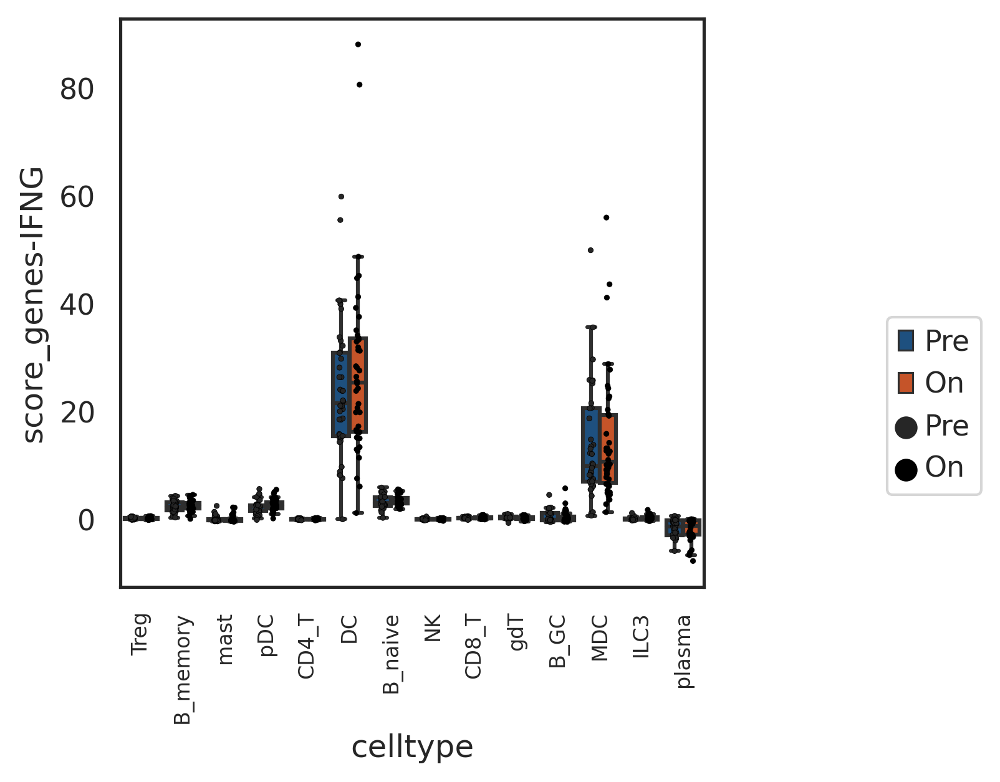

In [92]:
factor='score_genes-IFNG'#'HLA-DMB'#'CXCL9'#'score_genes-IFNG'
sns.boxplot(data=plot_df,x='celltype', 
                y=factor, hue='timepoint', order=None, hue_order=['Pre','On'], 
                orient=None, color=None, palette=blue_red, saturation=0.75, width=0.8, 
                dodge=True, fliersize=0, linewidth=None, whis=1.5, ax=None)
sns.stripplot(data=plot_df,x='celltype', 
                y=factor, hue='timepoint', order=None, hue_order=['Pre','On'], 
                orient=None, color='#000000',s=2,
                dodge=True, linewidth=None, ax=None)
#plt.xlim(-25,100)
plt.legend(bbox_to_anchor=[1.5, 0.5])
plt.xticks(rotation=90,size=8)
plt.savefig(fig_save_path+'Bassez_celltype_boxplot'+factor+'.svg')
plot_df.to_csv(DATA_DIR + 'source_data/' 'FigureS3b_right_source.csv')
print('Bassez_celltype_boxplot'+factor+'.svg')

# metabolic analysis

In [7]:
#paths
adata_path_adata = 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_nodub220818.h5ad'
cell_type = 'plasma'
annotation_key = 'annotation_SPADE_1'

metadata_gs = DATA_DIR + 'SPADE_genesets_x_geneset_metadata_mod.csv'

adata_path = DATA_DIR + adata_path_adata
input_gene_sets = DATA_DIR + 'SPADE_genes_x_genesets.csv'
input_gene_set_x_celltypes_global = DATA_DIR + 'SPADE_cells_x_genesets_general.csv'
input_gene_set_x_celltypes_specific = DATA_DIR + 'SPADE_cells_x_genesets_celltype-specific_modified_for_SPADE.csv'

In [8]:
#load input gene sets
input_df = pd.read_csv(input_gene_sets)
input_global_df = pd.read_csv(input_gene_set_x_celltypes_global)
input_specific_df = pd.read_csv(input_gene_set_x_celltypes_specific)

In [9]:
#load data
adata = sc.read(adata_path)

Only considering the two last: ['.0_50PC_reembedded_nodub220818', '.h5ad'].
Only considering the two last: ['.0_50PC_reembedded_nodub220818', '.h5ad'].


In [10]:
#load gene set metadata
metadata_df = pd.read_csv(metadata_gs)
metadata_df

,v.id,v.author,gs.name,gst.name,gsto.name,a.name
0,v_hs239,wallet,all_MYC_targets,bulk_curated,proliferation_cell_cycle,cellular_process
1,v_hs243,"wallet, Arthur_Liberzon_(MSigDB_Team)",all_TGFb_response,bulk_curated,immune_cellular_response,cellular_process
2,v_hs98,"Arthur_Liberzon_(MSigDB Team), wallet",all_TNF-via-NFkB_signaling,bulk_curated,immune_cellular_response,cellular_process
3,v_hs234,wallet,B_IgM-ligation_response,bulk_curated,immune_cellular_response,cellular_process
4,v_hs232,wallet,CD4-T_IL12_response,bulk_curated,immune_cellular_response,cellular_process
...,...,...,...,...,...,...
176,v_hs63b,wallet,M_angiogenic-effectors,manual_internal,immune_function,cellular_process
177,v_hs91,wallet,Mac_IFNG_response,manual_internal,immune_cellular_response,cellular_process
178,v_hs90,wallet,Mac_IL4-IL13_response,manual_internal,immune_cellular_response,cellular_process
179,v_hs52b,wallet,TNK_cytotoxicity-effectors,manual_internal,immune_function,cellular_process


In [14]:
#take subset of plasma cells
adata_celltype = adata[adata.obs['annotation_SPADE_1']=='plasma']
adata_celltype

View of AnnData object with n_obs × n_vars = 3803 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno

['AASS',
 'SLC3A1',
 'PIPOX',
 'SLC7A1',
 'AADAT',
 'TMLHE',
 'SLC38A4',
 'SPCS3',
 'BBOX1',
 'ALDH2',
 'GCDH',
 'SLC25A21',
 'ALDH7A1',
 'SLC6A14',
 'SPCS2',
 'SLC7A2',
 'SPCS1',
 'SLC7A3']

In [18]:
#calculate mean expression of lysine factor genes per cell type
genes_of_interest = list(adata_celltype.uns['SPADE_markers_global']['103-X-all_LYS_metabolism'])
heatmap_df = plt_gene_heatmap_df(adata,'annotation_SPADE_1',genes_of_interest,cluster_minus_one_present=False, zscore=True, layer_heat ='imputed')
heatmap_df

Cluster:  pDC
Cluster:  NK
Cluster:  gdT
Cluster:  CD8_T
Cluster:  B_memory
Cluster:  MDC
Cluster:  B_naive
Cluster:  plasma
Cluster:  B_GC
Cluster:  DC
Cluster:  ILC3
Cluster:  CD4_T
Cluster:  Treg
Cluster:  mast


,AADAT,PIPOX,SLC7A2,SERP1,SLC7A1,HSPA5,SLC3A1,PLPBP,TMEM59,TRAM1,...,SPCS1,SEC61A1,HERPUD1,SEC61G,SLC6A8,IGKC,BBOX1,SLC25A15,ALDH7A1,PLPP5
pDC,-0.267210,-0.233898,-0.318824,1.212914,1.652769,0.380663,0.212578,-0.447396,0.059567,1.145744,...,2.824847,1.185494,2.243824,1.645480,-0.247999,0.558519,-0.390263,-1.047433,0.348885,-0.464847
NK,-0.002392,-0.182246,0.092501,-0.554409,-0.496843,-0.011979,0.161117,-0.393530,-0.329746,-0.351757,...,-0.449931,-0.313077,-0.531908,-0.140162,-0.182179,-0.263519,-0.363172,-0.073262,-0.146769,-0.287135
gdT,0.363157,-0.385506,-0.392245,-0.662082,-0.057398,-0.250216,0.160436,0.220116,-0.098121,-0.313590,...,-0.095395,-0.300670,-0.341671,-0.221879,-0.135070,-0.093803,-0.261714,0.421620,-0.419805,-0.284105
CD8_T,-0.137750,-0.298236,0.103314,-0.517112,-0.126957,-0.095164,0.014758,-0.228349,-0.086208,-0.198377,...,-0.179652,-0.256096,-0.274972,-0.232357,-0.177842,-0.200840,-0.098828,0.402339,-0.297379,-0.314536
B_memory,-0.021652,-0.310283,-0.048493,0.528309,-0.201241,-0.752547,0.253563,-0.338570,-0.855940,-0.619188,...,-0.351758,-0.649298,0.212988,-0.779375,-0.209137,0.294883,0.197266,-0.777066,-0.171745,0.025256
MDC,0.077026,1.452992,-0.218779,0.717850,-0.036175,0.496666,-0.374182,1.226454,0.180713,0.289607,...,-0.370735,0.538943,0.305330,0.688783,1.169232,-0.273949,0.006080,-0.663016,1.552890,-0.219044
B_naive,-0.217665,-0.204763,-0.158949,0.625469,-0.314400,-0.709502,0.202851,-0.332764,-0.647279,-0.561607,...,-0.431008,-0.583194,0.144165,-0.704669,-0.157173,0.206016,-0.075628,-0.608377,-0.392716,1.610521
plasma,0.086982,-0.189009,0.334572,3.179351,1.413356,3.673512,0.048632,-0.086905,3.978658,4.275556,...,4.010776,4.236356,4.081717,3.367664,-0.138705,4.145846,0.743647,-0.115599,0.292097,4.395799
B_GC,-0.115355,-0.463149,0.348900,-0.384058,0.145367,-1.109390,-0.511604,-0.541299,-1.577738,-1.057081,...,-0.665757,-0.859507,-0.556243,0.416349,-0.225620,0.000103,0.503930,-0.424614,-0.349083,-0.364301
DC,0.115946,2.472015,-0.142165,0.830268,0.650050,0.182250,-0.338447,0.780133,-0.217274,0.013786,...,-0.137207,0.148861,0.745018,0.193211,0.022026,-0.234848,0.092550,-0.539069,1.137982,-0.230932


In [28]:
#retrieve reordered columns 
color1 = '#02dfcf'
color2 = '#024fdf'
col_colors = []

for i in heatmap_df.columns:
    if i in list(input_df[input_df['gs.name']=='all_LYS_metabolism']['g.name']):
        col_colors.append(color1)
    else:
        col_colors.append(color2)
        

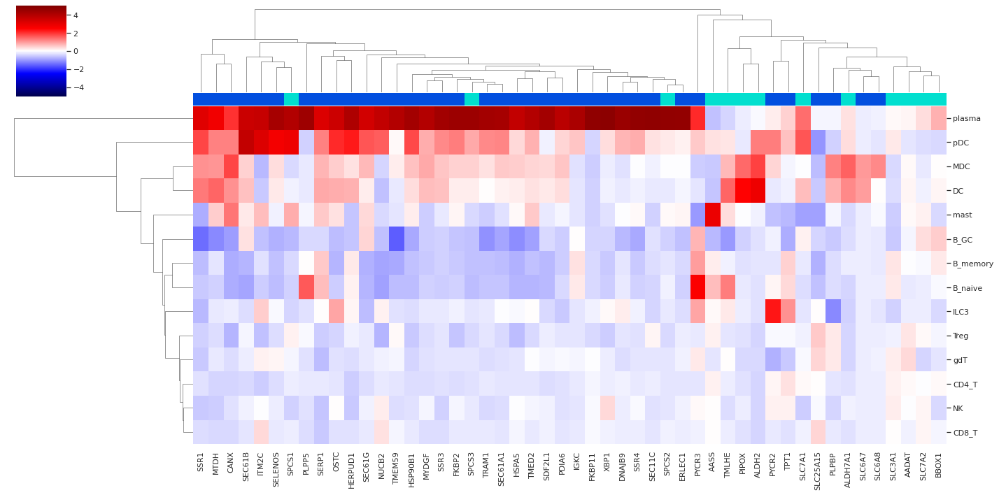

In [32]:
#plot heatmap of lysine factor genes
sns.set(font_scale=1)
hm = sns.clustermap(heatmap_df,
                    figsize=(20,10),vmin=-5,center=0,vmax=5,z_score=None, cmap='seismic',col_colors=col_colors)

### aggregate factors per celltype

In [33]:
metabolic_factors = ['3-X-all_glyoxylate-dicarboxylate_metabolism-X-norm',
 '6-X-all_triacylglycerol_synthesis-X-norm',
 '8-X-all_heparan-sulfate_degradation-X-norm',
 '11-X-all_autophagy_regulation_positive-X-norm',
 '13-X-all_TYR_metabolism-X-norm',
 '14-X-all_autophagy-of-mitochondria-X-norm',
 '15-X-all_autophagy-chaperone-mediated-X-norm',
 '16-X-all_transmembrane-transport-golgi-X-norm',
 '17-X-all_osmotic-stress-response-X-norm',
 '18-X-all_o-glycan_synthesis-X-norm',
 '19-X-all_transmembrane-transport-mitochondrial-X-norm',
 '21-X-all_mitophagy_regulation_positive-X-norm',
 '22-X-all_posttranslation-modification-X-norm',
 '24-X-all_autophagic-cell-death-X-norm',
 '29-X-all_Beta-Ala_metabolism-X-norm',
 '30-X-all_pterin_synthesis-X-norm',
 '31-X-all_oxidative-phosphorylation-X-norm',
 '32-X-all_creatinine_metabolism-X-norm',
 '33-X-all_autophagy_regulation_positive-X-norm',
 '34-X-all_NAD_metabolism-X-norm',
 '37-X-all_lipophagy-X-norm',
 '38-X-all_CYS_metabolism-X-norm',
 '39-X-all_glycerin-SER-THR_metabolism-X-norm',
 '40-X-all_citric-acid-cycle-X-norm',
 '41-X-all_ROS-detoxification-X-norm',
 '42-X-all_NOD-like-receptor_signaling-X-norm',
 '43-X-all_xenobiotics_metabolism-X-norm',
 '46-X-all_oxidative-phosphorylation-X-norm',
 '47-X-all_transmembrane-transport-lysosome-X-norm',
 '48-X-all_bile-acid_synthesis-X-norm',
 '49-X-all_peroxisome-component-X-norm',
 '50-X-all_pyruvate_metabolism-X-norm',
 '51-X-all_ros_response-X-norm',
 '52-X-all_n-glycan_synthesis-X-norm',
 '54-X-all_urea-cycle-X-norm',
 '56-X-all_glycogenesis-X-norm',
 '57-X-all_polyamines_metabolism-X-norm',
 '58-X-all_fructose-mannose_metabolism-X-norm',
 '59-X-all_thiamin_metabolism-X-norm',
 '60-X-all_PI3K-AKT-mTOR_signaling-X-norm',
 '61-X-all_fatty-acid-metabolism-X-norm',
 '62-X-all_NOTCH_signaling-X-norm',
 '63-X-all_purine_metabolism-X-norm',
 '64-X-all_nucleotide_metabolism-X-norm',
 '65-X-all_CoA_synthesis-X-norm',
 '66-X-all_platelet-activation-factor_production-X-norm',
 '67-X-all_ubiquinone_synthesis-X-norm',
 '68-X-all_CYP_metabolism-X-norm',
 '69-X-all_iron-uptake-and-storage-X-norm',
 '70-X-all_chondroitine-and-heparan-sulfate_synthesis-X-norm',
 '71-X-all_coagulation-factor_production-X-norm',
 '72-X-all_VAL-LEU-ILE_metabolism-X-norm',
 '73-X-all_glycogenolysis-X-norm',
 '74-X-all_HIS_metabolism-X-norm',
 '76-X-all_lactate_production-X-norm',
 '78-X-all_eicosanoid_metabolism-X-norm',
 '79-X-all_riboflavin_metabolism-X-norm',
 '80-X-leuko_ROS_production-X-norm',
 '81-X-all_GPI-anchor_synthesis-X-norm',
 '82-X-all_cholesterol_metabolism-X-norm',
 '83-X-all_inositol-phosphate_metabolism-X-norm',
 '84-X-all_unfolded-protein-response-X-norm',
 '85-X-all_protein-degradation-proteasome-X-norm',
 '86-X-all_retinol_metabolism-X-norm',
 '87-X-all_cholesterol-homeostasis-X-norm',
 '88-X-all_sphingolipid_metabolism-X-norm',
 '89-X-all_transmembrane-transport-cellmembrane-X-norm',
 '91-X-all_pyrimidine_metabolism-X-norm',
 '93-X-all_ascorbate-uptake-X-norm',
 '94-X-all_glycolysis-X-norm',
 '95-X-all_TRP_metabolism-X-norm',
 '96-X-all_fatty-acid-beta-oxidation-mitochondrial-X-norm',
 '97-X-all_ARG-PRO_metabolism-X-norm',
 '98-X-all_selenoamino-acid_metabolism-X-norm',
 '99-X-all_galactose_metabolism-X-norm',
 '101-X-all_DNA_synthesis-X-norm',
 '103-X-all_LYS_metabolism-X-norm',
 '104-X-all_hyaluronan_metabolism-X-norm',
 '105-X-all_GABA-shunt-X-norm',
 '106-X-all_propanoate_metabolism-X-norm',
 '107-X-all_GLU_metabolism-X-norm',
 '108-X-all_exocytosis-X-norm',
 '109-X-all_pyrimidine_synthesis-X-norm',
 '110-X-all_fatty-acid_synthesis-X-norm',
 '111-X-all_carnitine-shuttle-X-norm',
 '113-X-all_biotin_metabolism-X-norm',
 '114-X-all_cyclic-nucleotide_metabolism-X-norm',
 '115-X-all_macroautophagy-X-norm',
 '119-X-all_autophagy-nucleus-X-norm',
 '120-X-all_glutathione_metabolism-X-norm',
 '121-X-all_thrombolysis-factor_production-X-norm',
 '122-X-all_ketone-body_metabolism-X-norm',
 '123-X-all_nucleophagy-late-X-norm',
 '125-X-all_n-glycan_degradation-X-norm',
 '126-X-all_autophagy-chaperone-mediated-X-norm',
 '128-X-all_transmembrane-transport-ER-X-norm',
 '129-X-all_hypoxia-response-X-norm',
 '131-X-all_n-glycan_degradation-X-norm',
 '135-X-all_steroid_metabolism-X-norm',
 '137-X-all_keratan-sulfate_synthesis-X-norm',
 '139-X-all_lipophagy-X-norm',
 '140-X-all_pentose-phosphate-pathway-X-norm',
 '141-X-all_mTORC1_signaling-X-norm',
 '144-X-all_purine_metabolism-X-norm',
 '145-X-all_ethanol_metabolism-X-norm',
 '146-X-all_taurine-hypotaurine_metabolism-X-norm',
 '147-X-all_glycerophospholipid_metabolism-X-norm',
 '148-X-all_complement_production-X-norm',
 '149-X-all_folate_metabolism-X-norm']

In [34]:
#The SPECTRA loadings are generally bimodal. The lower mode can be assumed to be non-expression while the 
#upper mode can be assumed to be expression of this factor. While the lower mode is generally close to zero it 
#is not exactly 0. here we will calculate the positive fraction of cells for different factors to find a good
#threshold above the lower mode but below the higher mode of the factor loadings
#calculate pos frac for diferent thresholds to find a rational threshold for defining the zero fraction

#set everything below threshold 0
thresholds_to_test =[0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10]

out_df = pd.DataFrame()

for thresh in thresholds_to_test:
    plotting_df = adata.obs[metabolic_factors]
    plotting_df_thresh = plotting_df.applymap(lambda x: 0 if x < thresh else x)
    plotting_df_thresh_group = plotting_df_thresh

    df = plotting_df_thresh_group.copy()
    df_frac = pd.DataFrame()

    #calculate positive fraction per gene program and cell type
    for i in df.columns:
        df['sign'] = np.sign(df[i])
        allzero  = df['sign'] == 0
        nonezero  = df['sign'] != 0
        if allzero.all() ==False and nonezero.all()==False:
            pos_cells = df.sign.value_counts()
            pos_frac = pos_cells[1]/(pos_cells[0]+pos_cells[1])
            out_df.loc[thresh,i] = pos_frac
        elif nonezero.all()==True:
            #print('for',i,'no negative cells were detected, setting positive fraction to 1')
            out_df.loc[thresh,i] = 1
        elif allzero.all()==True:
            #print('for',i,'no positive cells were detected, setting positive fraction to 0')
            out_df.loc[thresh,i] = 0

out_df      

/home/wallet/.local/lib/python3.10/site-packages/pandas/core/indexing.py:1684: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.obj[key] = infer_fill_value(value)


,3-X-all_glyoxylate-dicarboxylate_metabolism-X-norm,6-X-all_triacylglycerol_synthesis-X-norm,8-X-all_heparan-sulfate_degradation-X-norm,11-X-all_autophagy_regulation_positive-X-norm,13-X-all_TYR_metabolism-X-norm,14-X-all_autophagy-of-mitochondria-X-norm,15-X-all_autophagy-chaperone-mediated-X-norm,16-X-all_transmembrane-transport-golgi-X-norm,17-X-all_osmotic-stress-response-X-norm,18-X-all_o-glycan_synthesis-X-norm,...,137-X-all_keratan-sulfate_synthesis-X-norm,139-X-all_lipophagy-X-norm,140-X-all_pentose-phosphate-pathway-X-norm,141-X-all_mTORC1_signaling-X-norm,144-X-all_purine_metabolism-X-norm,145-X-all_ethanol_metabolism-X-norm,146-X-all_taurine-hypotaurine_metabolism-X-norm,147-X-all_glycerophospholipid_metabolism-X-norm,148-X-all_complement_production-X-norm,149-X-all_folate_metabolism-X-norm
0.00,1.000000,1.0,1.0,1.0,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,...,1.0,1.000000,1.000000,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.0
0.01,0.496445,0.0,0.0,0.0,0.000205,0.0,0.882812,0.373252,0.000675,0.073085,...,0.0,0.001586,0.685869,0.0,0.0,0.004082,0.028297,0.000061,0.255685,0.0
0.02,0.486348,0.0,0.0,0.0,0.000000,0.0,0.867211,0.362520,0.000000,0.002721,...,0.0,0.000020,0.649214,0.0,0.0,0.000020,0.008583,0.000000,0.172258,0.0
0.03,0.474501,0.0,0.0,0.0,0.000000,0.0,0.846730,0.341579,0.000000,0.000102,...,0.0,0.000000,0.589796,0.0,0.0,0.000000,0.002476,0.000000,0.132748,0.0
0.04,0.456956,0.0,0.0,0.0,0.000000,0.0,0.823773,0.307584,0.000000,0.000000,...,0.0,0.000000,0.519709,0.0,0.0,0.000000,0.000604,0.000000,0.112840,0.0
0.05,0.433212,0.0,0.0,0.0,0.000000,0.0,0.799282,0.263266,0.000000,0.000000,...,0.0,0.000000,0.445406,0.0,0.0,0.000000,0.000072,0.000000,0.100707,0.0
0.06,0.407892,0.0,0.0,0.0,0.000000,0.0,0.773522,0.219460,0.000000,0.000000,...,0.0,0.000000,0.372925,0.0,0.0,0.000000,0.000051,0.000000,0.093157,0.0
0.07,0.382654,0.0,0.0,0.0,0.000000,0.0,0.746043,0.181782,0.000000,0.000000,...,0.0,0.000000,0.304985,0.0,0.0,0.000000,0.000010,0.000000,0.086988,0.0
0.08,0.356014,0.0,0.0,0.0,0.000000,0.0,0.716171,0.150119,0.000000,0.000000,...,0.0,0.000000,0.244135,0.0,0.0,0.000000,0.000000,0.000000,0.081771,0.0
0.09,0.330336,0.0,0.0,0.0,0.000000,0.0,0.685726,0.123428,0.000000,0.000000,...,0.0,0.000000,0.191726,0.0,0.0,0.000000,0.000000,0.000000,0.077228,0.0


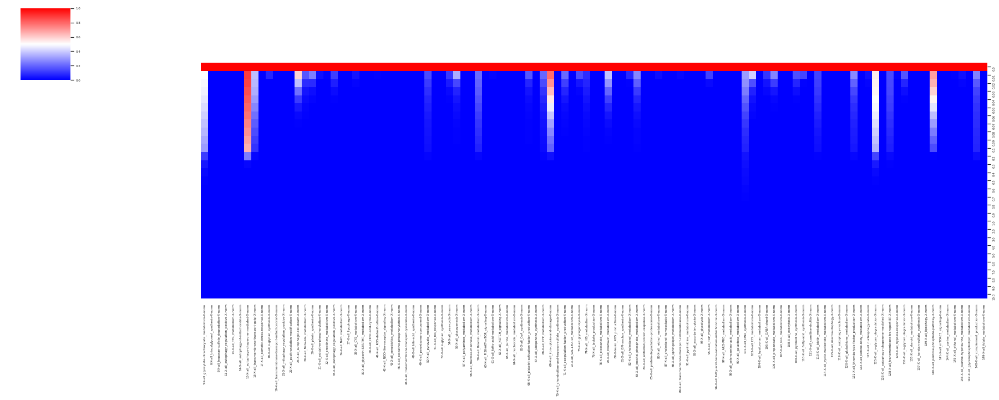

In [35]:
#plot pos fractions for different thresholds
sns.set(font_scale = 0.5) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
h = sns.clustermap(out_df,
               cmap='bwr', col_cluster=False, row_cluster=False, figsize=(25,10), vmax=1,center=0.5,vmin=0, z_score= None)


In [36]:
#calculate cell type means of pos_frac
thresh = 0.001 #everything below will be considere nonexpression
group_obs = 'annotation_SPADE_1' #obs varaiable for grouping


plotting_df = adata.obs[metabolic_factors]
plotting_df_thresh = plotting_df.applymap(lambda x: np.nan if x < thresh else x)
plotting_df_thresh_group = plotting_df_thresh
plotting_df_thresh_group['groups'] = adata.obs[group_obs]
df_means = plotting_df_thresh_group.groupby('groups').mean() #by default this ingnores nan --> only mean of pos. frac will be calculated


In [37]:
#normalize df to max

normalized_series = []

for i in df_means.columns:
    normalized_series.append(df_means[i]/ np.max(df_means[i]))

normalized_means  = pd.concat(normalized_series,axis=1)
normalized_means


,3-X-all_glyoxylate-dicarboxylate_metabolism-X-norm,6-X-all_triacylglycerol_synthesis-X-norm,8-X-all_heparan-sulfate_degradation-X-norm,11-X-all_autophagy_regulation_positive-X-norm,13-X-all_TYR_metabolism-X-norm,14-X-all_autophagy-of-mitochondria-X-norm,15-X-all_autophagy-chaperone-mediated-X-norm,16-X-all_transmembrane-transport-golgi-X-norm,17-X-all_osmotic-stress-response-X-norm,18-X-all_o-glycan_synthesis-X-norm,...,137-X-all_keratan-sulfate_synthesis-X-norm,139-X-all_lipophagy-X-norm,140-X-all_pentose-phosphate-pathway-X-norm,141-X-all_mTORC1_signaling-X-norm,144-X-all_purine_metabolism-X-norm,145-X-all_ethanol_metabolism-X-norm,146-X-all_taurine-hypotaurine_metabolism-X-norm,147-X-all_glycerophospholipid_metabolism-X-norm,148-X-all_complement_production-X-norm,149-X-all_folate_metabolism-X-norm
groups,,,,,,,,,,,,,,,,,,,,,
B_GC,1.000000,0.992638,0.914887,0.938135,1.000000,0.945321,0.516825,0.828122,0.826144,0.686363,...,1.000000,0.917747,0.652852,1.000000,0.978529,0.940078,0.842928,0.896506,0.147912,0.994919
B_memory,0.440031,0.970020,0.945810,0.990285,0.891054,0.929646,0.944552,0.984097,0.914043,0.849765,...,0.849125,0.912082,0.574012,0.809670,0.967195,0.862208,0.891896,0.908934,0.153268,0.939278
B_naive,0.418101,0.923664,0.906624,0.975215,0.852343,0.943035,1.000000,0.944488,0.876876,0.936675,...,0.838536,0.878633,0.418037,0.815610,0.966167,0.798162,0.677634,0.864094,0.128792,0.981519
CD4_T,0.517133,0.941440,0.963939,1.000000,0.866664,0.934092,0.921678,0.965117,0.927194,0.872526,...,0.884996,0.870239,0.659398,0.864003,0.929328,0.795147,0.696425,0.938073,0.142822,0.921923
CD8_T,0.450353,0.920967,0.939455,0.982147,0.883791,0.942844,0.778485,1.000000,0.932905,0.898659,...,0.911619,0.883124,0.635735,0.879259,0.918673,0.770895,0.878111,0.927670,0.142801,0.919966
DC,0.886556,0.909806,0.892056,0.898834,0.701454,0.873197,0.460809,0.618228,0.793723,0.594080,...,0.804002,0.763529,1.000000,0.870313,0.852389,0.720090,0.419213,0.810372,0.659489,0.870373
ILC3,0.452429,0.958657,0.881094,0.986208,0.896915,0.916566,0.820658,0.934762,1.000000,1.000000,...,0.912149,0.935536,0.424227,0.817818,1.000000,0.843384,0.908536,0.948321,0.161636,0.989978
MDC,0.664674,0.906850,0.902476,0.913840,0.741051,0.900597,0.282637,0.621831,0.799499,0.649528,...,0.793497,0.763296,0.611264,0.838701,0.872442,0.767766,0.373020,0.797028,1.000000,0.864831
NK,0.427235,0.923861,0.923809,0.951760,0.889283,0.959426,0.574052,0.972002,0.875570,0.964812,...,0.944859,0.937054,0.579838,0.866038,0.896690,0.780298,1.000000,0.903819,0.141982,0.921736


In [38]:
#replace nans with 0s (bc nans are the negative fraction)
df_means_nonan = normalized_means.fillna(0)

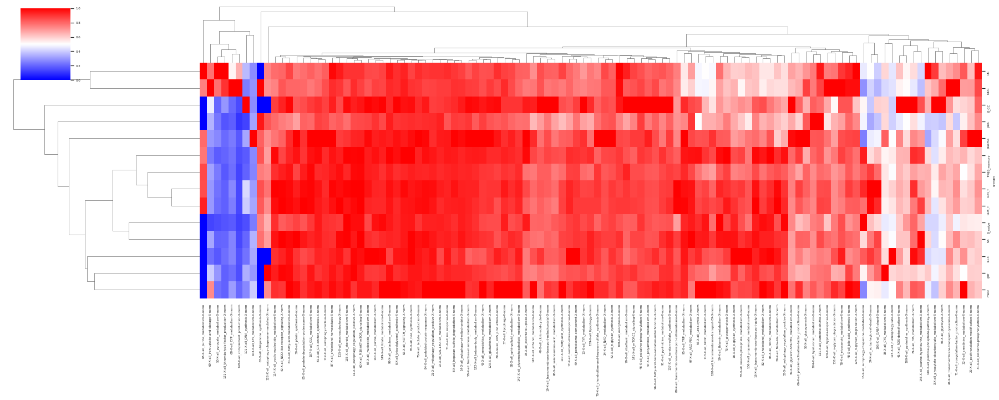

In [39]:
#plot
sns.set(font_scale = 0.5) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
h = sns.clustermap(df_means_nonan,
               cmap='bwr', col_cluster=True, figsize=(25,10), vmax=1,center=0.5,vmin=0, z_score= None)


In [40]:
#extract reordered columns

reordered_rows = []
for i in h.dendrogram_col.reordered_ind:
    reordered_rows.append(df_means_nonan.columns[i])
 

In [41]:
#calculate pos frac

#set everything below threshold 0
plotting_df = adata.obs[metabolic_factors]
plotting_df_thresh = plotting_df.applymap(lambda x: 0 if x < thresh else x)
plotting_df_thresh_group = plotting_df_thresh
plotting_df_thresh_group['groups'] = adata.obs[group_obs]

df = plotting_df_thresh_group.copy()
df_frac = pd.DataFrame()

#calculate positive fraction per gene program and cell type
for i in df.drop(columns='groups').columns:
    df['sign'] = np.sign(df[i])
    allzero  = df['sign'] == 0
    nonezero  = df['sign'] != 0
    if allzero.all() ==False and nonezero.all()==False:
        pos_cells = df.groupby('groups').sign.value_counts()
        pos_frac = pos_cells.unstack()[1]/(pos_cells.unstack()[0]+pos_cells.unstack()[1])
        df_frac[i] = pos_frac
    elif nonezero.all()==True:
        print('for',i,'no negative cells were detected, setting positive fraction to 1')
        df_frac[i] = [1]*(len(df.groupby('groups')))
    elif allzero.all()==True:
        print('for',i,'no positive cells were detected, setting positive fraction to 0')
        df_frac[i] = [0]* (len(df.groupby('groups')))

df_frac

/scratch/lsftmp/13731371.tmpdir/ipykernel_134032/1097057931.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  df_frac[i] = pos_frac


,3-X-all_glyoxylate-dicarboxylate_metabolism-X-norm,6-X-all_triacylglycerol_synthesis-X-norm,8-X-all_heparan-sulfate_degradation-X-norm,11-X-all_autophagy_regulation_positive-X-norm,13-X-all_TYR_metabolism-X-norm,14-X-all_autophagy-of-mitochondria-X-norm,15-X-all_autophagy-chaperone-mediated-X-norm,16-X-all_transmembrane-transport-golgi-X-norm,17-X-all_osmotic-stress-response-X-norm,18-X-all_o-glycan_synthesis-X-norm,...,137-X-all_keratan-sulfate_synthesis-X-norm,139-X-all_lipophagy-X-norm,140-X-all_pentose-phosphate-pathway-X-norm,141-X-all_mTORC1_signaling-X-norm,144-X-all_purine_metabolism-X-norm,145-X-all_ethanol_metabolism-X-norm,146-X-all_taurine-hypotaurine_metabolism-X-norm,147-X-all_glycerophospholipid_metabolism-X-norm,148-X-all_complement_production-X-norm,149-X-all_folate_metabolism-X-norm
groups,,,,,,,,,,,,,,,,,,,,,
B_GC,0.708145,0.106335,0.047511,0.309955,0.210407,0.226244,0.963801,0.190045,0.477376,0.208145,...,0.085973,0.303167,0.762443,0.561086,0.384615,0.237557,0.076923,0.357466,0.201357,0.167421
B_memory,0.479707,0.161948,0.185508,0.420709,0.173827,0.196001,0.982182,0.325084,0.628786,0.426252,...,0.167690,0.302316,0.672144,0.550980,0.284300,0.222134,0.092259,0.520689,0.198575,0.139576
B_naive,0.435299,0.144675,0.090369,0.421298,0.176496,0.216801,0.997879,0.300382,0.610946,0.516759,...,0.184981,0.341112,0.601612,0.553670,0.313110,0.229529,0.064913,0.487484,0.164192,0.162495
CD4_T,0.473953,0.182850,0.195205,0.492002,0.270421,0.236028,0.944421,0.357644,0.687013,0.509663,...,0.193385,0.359735,0.713467,0.637980,0.320384,0.246950,0.134397,0.620861,0.199814,0.138696
CD8_T,0.489679,0.167549,0.198747,0.465215,0.300548,0.226938,0.990822,0.365889,0.689710,0.532843,...,0.278058,0.353453,0.740110,0.662835,0.291214,0.232200,0.094565,0.620673,0.212592,0.131245
DC,0.763179,0.269079,0.099921,0.492132,0.376869,0.284815,0.756491,0.536585,0.737215,0.631786,...,0.121951,0.599921,0.845004,0.695122,0.344217,0.241542,0.125098,0.654209,0.692368,0.149882
ILC3,0.375610,0.146341,0.126829,0.370732,0.229268,0.214634,NaN,0.341463,0.756098,0.419512,...,0.190244,0.341463,0.585366,0.551220,0.351220,0.258537,0.126829,0.536585,0.141463,0.180488
MDC,0.697659,0.195434,0.093389,0.510138,0.399110,0.313963,0.552753,0.517227,0.747692,0.668727,...,0.160979,0.607237,0.781982,0.663947,0.352868,0.256924,0.173261,0.623887,0.776377,0.129575
NK,0.419830,0.156855,0.152208,0.420604,0.293184,0.222696,0.984508,0.316034,0.616576,0.537955,...,0.268009,0.372192,0.585593,0.626259,0.271495,0.239737,0.090627,0.580945,0.175058,0.156081


In [42]:
#reorder dataframe
df_frac = df_frac[reordered_rows]
df_means_nonan = df_means_nonan[reordered_rows]

In [43]:
#remove spurious columns
df_means_nonan = df_means_nonan.T[np.sum(df_means_nonan)>0.01].T

In [44]:
#melt dataframe containing means of pos fraction for plotting
df_means_flat  = df_means_nonan.melt(ignore_index=False,value_name='mean')
df_means_flat['groups'] = df_means_flat.index
df_means_flat.index = df_means_flat.index.str.cat(df_means_flat['variable'],sep = '-X-')
df_means_flat

,variable,mean,groups
groups,,,
B_GC-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.000000,B_GC
B_memory-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.766729,B_memory
B_naive-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.000000,B_naive
CD4_T-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.849298,CD4_T
CD8_T-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.933921,CD8_T
...,...,...,...
Treg-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.669258,Treg
gdT-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.593502,gdT
mast-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.612090,mast


In [45]:
#melt dataframe containing pos fraction for plotting
df_frac_flat  = df_frac.melt(ignore_index=False,value_name='pos_frac')
df_frac_flat['groups'] = df_frac_flat.index
df_frac_flat.index = df_frac_flat.index.str.cat(df_frac_flat['variable'],sep = '-X-')
df_frac_flat

,variable,pos_frac,groups
groups,,,
B_GC-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,NaN,B_GC
B_memory-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.000198,B_memory
B_naive-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,NaN,B_naive
CD4_T-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.000232,CD4_T
CD8_T-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.000251,CD8_T
...,...,...,...
Treg-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.884721,Treg
gdT-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.863048,gdT
mast-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.821186,mast


In [46]:
#add means of pos fraction to df containing pos fractions
df_frac_flat['mean'] = df_means_flat['mean']
df_frac_flat

,variable,pos_frac,groups,mean
groups,,,,
B_GC-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,NaN,B_GC,0.000000
B_memory-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.000198,B_memory,0.766729
B_naive-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,NaN,B_naive,0.000000
CD4_T-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.000232,CD4_T,0.849298
CD8_T-X-63-X-all_purine_metabolism-X-norm,63-X-all_purine_metabolism-X-norm,0.000251,CD8_T,0.933921
...,...,...,...,...
Treg-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.884721,Treg,0.669258
gdT-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.863048,gdT,0.593502
mast-X-31-X-all_oxidative-phosphorylation-X-norm,31-X-all_oxidative-phosphorylation-X-norm,0.821186,mast,0.612090


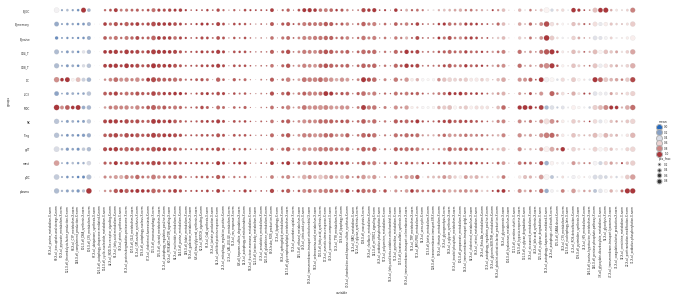

In [55]:
# Create a dotplot with mean of pos frac as dot hue and pos frac as dot size
sns.set(font_scale=0.25)
sns.set_style('white')
g = sns.relplot(
    data=df_frac_flat,
    x="variable", y="groups", hue="mean", size="pos_frac",
    palette="vlag", edgecolor=".7",
    height=3, aspect=3,sizes=(0, 30),
)
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)
for artist in g.legend.legendHandles:
    artist.set_edgecolor(".7")
fig_save_path_spec = fig_save_path+adata_path_adata[:-5]+'_'+'dotplot_cell_types_metabolism.svg'
plt.savefig(fig_save_path_spec,dpi=300)

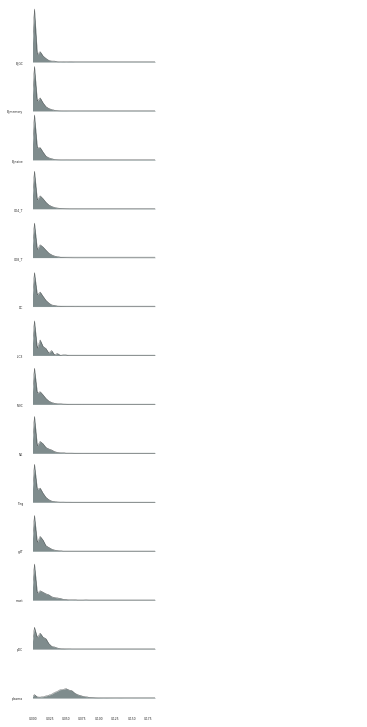

In [56]:
#select program
program = '103-X-all_LYS_metabolism-X-norm'

import joypy

sns.set_style('white')
plot_df = adata.obs[['annotation_SPADE_1',program]]
fig, axes = joypy.joyplot(plot_df, by="annotation_SPADE_1",kind='normalized_counts',bins=50,linewidth=0.25,figsize=(5,10),
                         color='#7F8C8D')
for i in axes:
    i.set_xlim(0,.5)
save_path_figure_complete = fig_save_path+adata_path_adata[:-5]+'_'+'histplot_celltypes_LYS.svg'
plt.savefig(save_path_figure_complete,dpi=300)

### compare marker genes

In [59]:
program = '103-X-all_LYS_metabolism'

In [60]:
#factor top genes after transfer to Zhang et al
Zhang_et_al = set(['ALDH7A1', 'PIPOX', 'BBOX1', 'AASS', 'PRDX4', 'TMLHE', 'SPCS2',
       'AADAT', 'MZB1', 'JCHAIN', 'TENT5C', 'SLC7A1', 'IGKC', 'MUCL1',
       'SPCS3', 'SPCS1', 'DERL3', 'CD79A', 'SSR4', 'HERPUD1', 'ITM2C',
       'FTL', 'CD74', 'FTH1', 'ST6GALNAC4', 'AC012236.1', 'FCGR2B',
       'CD27', 'PSAP', 'TXNDC5', 'AC078883.1', 'ADA2', 'GSTP1', 'KDELR1',
       'SYNGR1', 'LMAN1', 'TMEM59', 'CD79B', 'HMGB1', 'SIL1', 'C11orf24',
       'CKAP4', 'TXNDC15', 'PLD4', 'C11orf80', 'LINC02362', 'MEI1',
       'PLD3', 'SEL1L3', 'TAPBPL'])

In [61]:
#calculate intersections and set differences
output_genes = set(adata.uns['SPADE_markers_global'][program])
input_genes = set(input_df[input_df['gs.name']==program[6:]]['g.name'])
retained_input_genes = output_genes.intersection(input_genes)
new_genes = output_genes - input_genes
removed_genes = input_genes - output_genes
removed_Zhang = output_genes - Zhang_et_al
new_Zhang = Zhang_et_al - output_genes
retained_Zhang = Zhang_et_al.intersection(output_genes)

print(len(retained_input_genes),'(',100*(len(retained_input_genes))/len(input_genes),'%)','input genes were retained','these are:', retained_input_genes)

13 ( 72.22222222222223 %) input genes were retained these are: {'AASS', 'PIPOX', 'AADAT', 'SPCS1', 'SLC7A2', 'TMLHE', 'SLC7A1', 'SLC3A1', 'BBOX1', 'ALDH2', 'ALDH7A1', 'SPCS3', 'SPCS2'}


saved Figure to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_nodub220818_venn-Zhang-et-al_transferredall_LYS_metabolism.svg


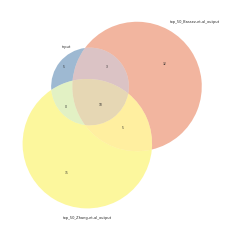

In [74]:
#venn for input output and graph-transferred output in Zhang data

#get intersections and set differerences 
a = len((input_genes-output_genes)-Zhang_et_al)
b = len((output_genes-input_genes)-Zhang_et_al)
c = len((output_genes.intersection(input_genes))-Zhang_et_al)
d = len((Zhang_et_al-output_genes)-input_genes)
e = len((Zhang_et_al.intersection(input_genes))-output_genes)
f = len((Zhang_et_al.intersection(output_genes))-input_genes)
g = len(Zhang_et_al.intersection(output_genes).intersection(input_genes))

venn3(subsets=(a,b,c,d,e,f,g),set_labels=('input','top_50_Bassez-et-al_output','top_50_Zhang-et-al_output'),
     set_colors= blue_red+['#F9EB0C'])
save_fig_path = fig_save_path+adata_path_adata[:-5]+'_venn-Zhang-et-al_transferred'+program[6:]+'.svg'
plt.savefig(save_fig_path,dpi=300)
print('saved Figure to:',save_fig_path)

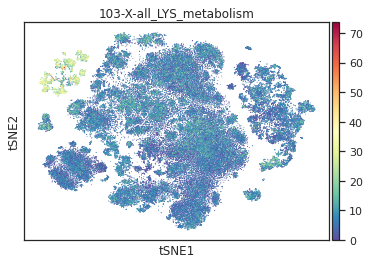

<Figure size 432x288 with 0 Axes>

In [79]:
sc.pl.tsne(adata, color = program, s = 3, cmap='Spectral_r', legend_fontsize = 10, vmin=0)
fig_save_path_complete = fig_save_path+adata_path_adata[:-5]+'_tsne'+program[6:]+'.svg'
plt.savefig(fig_save_path_complete,dpi=300)

# CD8 T cells

In [117]:
#parameters
cell_subset = ['CD8_T']

adata_name = 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_CD8-reembeded-norm.h5ad'

adata_path = DATA_DIR + adata_name
#adata_save_path = DATA_DIR + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_CD8-reembeded-norm.h5ad'
input_gene_sets = DATA_DIR + 'SPADE_genes_x_genesets.csv'


annotation_key = 'annotation_SPADE_1'
log_loadings = False
remove_patients = False
recalculate_fdl = False
recalculate_PCs = False
save_data = False


In [118]:
input_df = pd.read_csv(input_gene_sets)

In [119]:
adata = sc.read(adata_path)
print('read adata from:',adata_path)
adata

Only considering the two last: ['.0_50PC_reembedded_CD8-reembeded-norm', '.h5ad'].
Only considering the two last: ['.0_50PC_reembedded_CD8-reembeded-norm', '.h5ad'].
read adata from: /data/peer/wallet/Jupyter/SPADE_Peer_validation/data/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_CD8-reembeded-norm.h5ad


AnnData object with n_obs × n_vars = 31925 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

In [121]:
a = set(adata.uns['SPADE_markers_specific']['CD8_T']['171-X-CD8-T_tumor-reactive-like_UP'])
b = set(adata.uns['SPADE_markers_specific']['CD8_T']['172-X-CD8-T_terminal-exhaustion'])
c = set(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name'])
d = set(input_df[input_df['gs.name']=='CD8-T_terminal-exhaustion']['g.name'])

print('genes exclusive to tumor reactive', a-b)
print('#############################################')
print('genes in tumor reactive not in input', a-c)
print('#############################################')
print('genes in tumor reactive not in input',len(a-b-c), a-b-c)
print('#############################################')
print('genes from input gs tumor reactive', a.intersection(c))
print('#############################################')
print('genes exclusive to exhaustion',b-a)
print('#############################################')
print('genes from input gs exhaustion', b.intersection(d))
print('#############################################')
print('overlapping genes:', a.intersection(b))

genes exclusive to tumor reactive {'ENTPD1', 'NFATC1', 'MTHFD2', 'GALNT2', 'STAT5A', 'LINC02195', 'FBXW7', 'GBP1', 'SH2D2A', 'ZBTB32', 'GNLY', 'IL10RB', 'CD38', 'TESPA1', 'BTN3A2', 'CCL3', 'GZMH', 'RBPJ', 'FASLG', 'GADD45G', 'LTA', 'IFNG', 'CXCL13', 'GZMM', 'LCP2', 'CCR1', 'SLA', 'DOK2', 'ITM2A', 'SEMA7A', 'GZMB', 'GFI1', 'CIC', 'PRF1', 'LAX1', 'LAYN', 'RHOH', 'TNFRSF18', 'ITGAE', 'GZMA', 'BATF', 'KRT86', 'MKI67', 'TNFRSF9', 'TNFRSF4', 'CD8B'}
#############################################
genes in tumor reactive not in input {'NFATC1', 'STAT5A', 'GALNT2', 'MTHFD2', 'LAG3', 'LINC02195', 'FBXW7', 'GBP1', 'SH2D2A', 'ZBTB32', 'GNLY', 'IL10RB', 'CD38', 'TESPA1', 'BTN3A2', 'CCL3', 'GZMH', 'RBPJ', 'FASLG', 'GADD45G', 'LTA', 'GZMM', 'LCK', 'LCP2', 'CCR1', 'SLA', 'DOK2', 'ITM2A', 'SEMA7A', 'NR4A3', 'GZMB', 'GFI1', 'CIC', 'PRF1', 'LAX1', 'LAYN', 'RHOH', 'HAVCR2', 'BATF', 'KRT86', 'TNFRSF4', 'CD8B'}
#############################################
genes in tumor reactive not in input 38 {'NFATC1', '

## subset adata

In [122]:
#subset adata
adata_celltype = adata[adata.obs[annotation_key].isin(cell_subset)]
adata_celltype

View of AnnData object with n_obs × n_vars = 31925 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'phen

In [126]:
factor_name_list = list(set(adata.uns['SPADE_markers_specific'][cell_subset[0]].keys())) 

In [127]:
factor_name_list_corr = factor_name_list + list(set(adata.uns['SPADE_markers_global'].keys()))
factor_name_list_corr = [x + '-X-norm' for x in factor_name_list_corr]
factor_name_list_corr

['173-X-T_tcr-activation-X-norm',
 '174-X-CD8-T_IL12_response-X-norm',
 '177-X-177-X-norm',
 '175-X-TNK_PD-1_signaling-X-norm',
 '176-X-TNK_cytotoxicity-effectors-X-norm',
 '172-X-CD8-T_terminal-exhaustion-X-norm',
 '171-X-CD8-T_tumor-reactive-like_UP-X-norm',
 '143-X-all_pyroptosis-X-norm',
 '39-X-all_glycerin-SER-THR_metabolism-X-norm',
 '59-X-all_thiamin_metabolism-X-norm',
 '148-X-all_complement_production-X-norm',
 '23-X-leuko_transendothelial-migration-X-norm',
 '146-X-all_taurine-hypotaurine_metabolism-X-norm',
 '49-X-all_peroxisome-component-X-norm',
 '24-X-all_autophagic-cell-death-X-norm',
 '63-X-all_purine_metabolism-X-norm',
 '88-X-all_sphingolipid_metabolism-X-norm',
 '13-X-all_TYR_metabolism-X-norm',
 '37-X-all_lipophagy-X-norm',
 '31-X-all_oxidative-phosphorylation-X-norm',
 '110-X-all_fatty-acid_synthesis-X-norm',
 '48-X-all_bile-acid_synthesis-X-norm',
 '15-X-all_autophagy-chaperone-mediated-X-norm',
 '82-X-all_cholesterol_metabolism-X-norm',
 '34-X-all_NAD_metabolism-

In [128]:
#remove patients with all zeros in pre sample
if remove_patients:
    adata_celltype = adata_celltype[~adata_celltype.obs['Bassez_patient_id'].isin(patients_to_remove)]
    adata_celltype

In [129]:
#log loadings
if log_loadings:
    log_loading_obs(adata_celltype,factor_name_list_corr)
    print('logged the loadings')

In [130]:
#recalculate FDL
if recalculate_fdl:
    np.random.seed(0)
    sc.pp.neighbors(adata_celltype, n_neighbors=10, method= 'umap', n_pcs=adata_celltype.varm['PCs'].shape[1],random_state=0)
    sc.tl.diffmap(adata_celltype, n_comps=15, neighbors_key=None,  copy=False)
    sc.tl.draw_graph(adata_celltype, layout='fa', init_pos=None, root=None, random_state=0, n_jobs=None, adjacency=None, key_added_ext=None, neighbors_key=None, obsp=None, copy=False)

In [131]:
#save
if save_data:
    adata_celltype.write(adata_save_path)
    print('saved data to:',adata_save_path)

## cell - cell factor loading correlation 

In [133]:
#parameters
cell_subset = ['CD8_T']

input_gene_sets = DATA_DIR + 'SPADE_genes_x_genesets.csv'


annotation_key = 'annotation_SPADE_1'



In [134]:
#randomize cells
adata_celltype = randomize_cells(adata_celltype)

In [135]:
#get factors
factor_name_list = list(set(adata.uns['SPADE_markers_specific'][cell_subset[0]].keys())) 

In [137]:
factor_name_list_corr = factor_name_list + list(set(adata.uns['SPADE_markers_global'].keys()))
factor_name_list_corr = [x+'-X-norm' for x in factor_name_list_corr]
factor_name_list_corr

['173-X-T_tcr-activation-X-norm',
 '174-X-CD8-T_IL12_response-X-norm',
 '177-X-177-X-norm',
 '175-X-TNK_PD-1_signaling-X-norm',
 '176-X-TNK_cytotoxicity-effectors-X-norm',
 '172-X-CD8-T_terminal-exhaustion-X-norm',
 '171-X-CD8-T_tumor-reactive-like_UP-X-norm',
 '143-X-all_pyroptosis-X-norm',
 '39-X-all_glycerin-SER-THR_metabolism-X-norm',
 '59-X-all_thiamin_metabolism-X-norm',
 '148-X-all_complement_production-X-norm',
 '23-X-leuko_transendothelial-migration-X-norm',
 '146-X-all_taurine-hypotaurine_metabolism-X-norm',
 '49-X-all_peroxisome-component-X-norm',
 '24-X-all_autophagic-cell-death-X-norm',
 '63-X-all_purine_metabolism-X-norm',
 '88-X-all_sphingolipid_metabolism-X-norm',
 '13-X-all_TYR_metabolism-X-norm',
 '37-X-all_lipophagy-X-norm',
 '31-X-all_oxidative-phosphorylation-X-norm',
 '110-X-all_fatty-acid_synthesis-X-norm',
 '48-X-all_bile-acid_synthesis-X-norm',
 '15-X-all_autophagy-chaperone-mediated-X-norm',
 '82-X-all_cholesterol_metabolism-X-norm',
 '34-X-all_NAD_metabolism-

In [138]:
factor_name_list = list(adata_celltype.uns['SPADE_markers_global']) + list(adata_celltype
                                                                           .uns['SPADE_markers_specific']['CD8_T'])
factor_name_list = [x + '-X-norm' for x in factor_name_list]

factor_name_list

['0-X-all_multidrug-resistance-X-norm',
 '1-X-all_porphyrine-heme_metabolism-X-norm',
 '10-X-all_type-II-ifn-response-X-norm',
 '100-X-all_JAK-STAT_signaling-X-norm',
 '101-X-all_DNA_synthesis-X-norm',
 '102-X-all_G1S-transition-X-norm',
 '103-X-all_LYS_metabolism-X-norm',
 '104-X-all_hyaluronan_metabolism-X-norm',
 '105-X-all_GABA-shunt-X-norm',
 '106-X-all_propanoate_metabolism-X-norm',
 '107-X-all_GLU_metabolism-X-norm',
 '108-X-all_exocytosis-X-norm',
 '109-X-all_pyrimidine_synthesis-X-norm',
 '11-X-all_autophagy_regulation_positive-X-norm',
 '110-X-all_fatty-acid_synthesis-X-norm',
 '111-X-all_carnitine-shuttle-X-norm',
 '112-X-all_DNA-repair-X-norm',
 '113-X-all_biotin_metabolism-X-norm',
 '114-X-all_cyclic-nucleotide_metabolism-X-norm',
 '115-X-all_macroautophagy-X-norm',
 '116-X-all_p53-signaling-X-norm',
 '117-X-all_phosphoinositide_signaling-X-norm',
 '118-X-118-X-norm',
 '119-X-all_autophagy-nucleus-X-norm',
 '12-X-all_DNA-demethylation-X-norm',
 '120-X-all_glutathione_metab

In [139]:
data_corr = adata_celltype.obs[factor_name_list]
factors = list(data_corr.columns)

calculate_covariance=False

In [140]:
from scipy.spatial import distance
from scipy.cluster import hierarchy

saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_CD8-reembeded-normfactor-factor-correlation-cell-level.svg


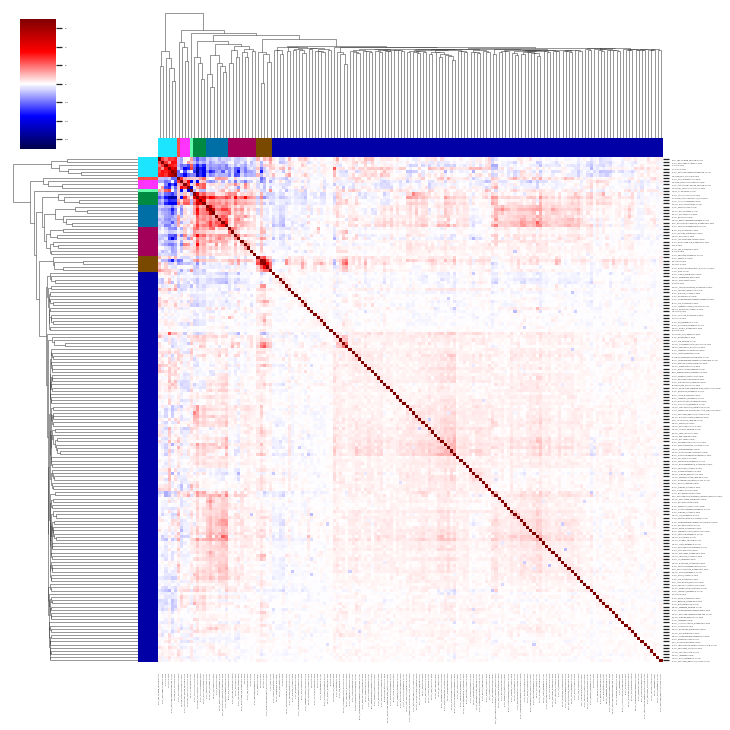

In [141]:
#marker gene list
from scipy.spatial import distance
from scipy.cluster import hierarchy
sns.set(font_scale=0.15)   
save_name = adata_name[:-5] + 'factor-factor-correlation-cell-level' + '.svg'
save_path_complete = fig_save_path + save_name
#calculate covariance or corrcoef either on imputed or non imputed data:
if calculate_covariance ==False:             
    subsetcluster_cov = np.corrcoef(data_corr.T)
else:             
    subsetcluster_cov = np.cov(data_corr.T)
                
subsetcluster_cov_df = pd.DataFrame(subsetcluster_cov, index=factors, columns=factors)
    
if True not in np.isnan(subsetcluster_cov):
    #define hierachical clustering
    row_linkage = hierarchy.linkage(distance.pdist(subsetcluster_cov), method='average')
    col_linkage = hierarchy.linkage(distance.pdist(subsetcluster_cov.T), method='average')
    #color side bar according to flat clustering
    row_col = []
    col_col = []

    hierarchical_cluster = hierarchy.fcluster(row_linkage, 1.5, criterion='distance')
    for j in hierarchical_cluster:
        a = color_map_clusters_nogrey[j]
        row_col.append(a)
        col_col.append(a)
            
    tmp = sns.clustermap(subsetcluster_cov_df, row_linkage=row_linkage, 
                            col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(10,10),vmax=.7, center=0,vmin=-.7, cmap='seismic')
plt.savefig(save_path_complete)
print('saved to:',save_path_complete)

saved Figure to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_CD8-reembeded-norm_venn-Zhang-et-al_lambda0.1t_cell_reactivity.svg


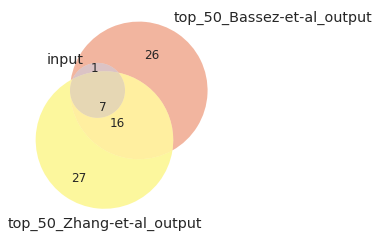

In [149]:
#venn for input output and Zhang data lambda 0.1
sns.set(font_scale=1)
sns.set_style('white')
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
from matplotlib import pyplot as plt

output_genes = {'MKI67', 'TNFRSF18', 'ENTPD1', 'ITGAE', 'CXCL13', 'TNFRSF9',
       'IFNG', 'GZMB', 'CCL3', 'GNLY', 'FASLG', 'CCR1', 'PRF1', 'GZMH',
       'HAVCR2', 'SLA', 'BATF', 'SH2D2A', 'LCP2', 'GBP1', 'ITM2A', 'GZMA',
       'RHOH', 'ZBTB32', 'DOK2', 'BTN3A2', 'LAX1', 'IL10RB', 'CIC',
       'TESPA1', 'SEMA7A', 'LTA', 'GFI1', 'CD8B', 'TNFRSF4', 'GADD45G',
       'FBXW7', 'STAT5A', 'NFATC1', 'KRT86', 'CD38', 'NR4A3', 'GZMM',
       'GALNT2', 'LCK', 'MTHFD2', 'RBPJ', 'LAG3', 'LAYN', 'LINC02195'}

Zhang_et_al = {'IFNG', 'MKI67', 'TNFRSF9', 'TNFRSF18', 'CCL4', 'TNFSF10', 'GZMH',
       'FASLG', 'CCL3', 'NR4A3', 'GZMA', 'LAMP1', 'IRF4', 'ENTPD1',
       'ITGAE', 'NR4A1', 'TOX', 'STXBP2', 'CD244', 'ATF3', 'EOMES',
       'BATF', 'GNLY', 'IL10RB', 'FGFBP2', 'FBXW7', 'LAG3', 'CIC',
       'COMMD3', 'IRF9', 'TESPA1', 'CTSC', 'GBP1', 'CCR1', 'HMGCS1',
       'IL2', 'NKG7', 'NT5E', 'GZMB', 'S100A4', 'ID2', 'PTPRO', 'CCL3L1',
       'NR4A2', 'CCL5', 'LTA', 'IL13', 'IL4', 'PRF1', 'LAMP2'}
input_genes = set(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name'])

#get intersections and set differerences 
a = len((input_genes-output_genes)-Zhang_et_al)
b = len((output_genes-input_genes)-Zhang_et_al)
c = len((output_genes.intersection(input_genes))-Zhang_et_al)
d = len((Zhang_et_al-output_genes)-input_genes)
e = len((Zhang_et_al.intersection(input_genes))-output_genes)
f = len((Zhang_et_al.intersection(output_genes))-input_genes)
g = len(Zhang_et_al.intersection(output_genes).intersection(input_genes))

venn3(subsets=(a,b,c,d,e,f,g),set_labels=('input','top_50_Bassez-et-al_output','top_50_Zhang-et-al_output'),
     set_colors= blue_red+['#F9EB0C'])
save_fig_path = fig_save_path+adata_name[:-5]+'_venn-Zhang-et-al_lambda0.1'+'t_cell_reactivity'+'.svg'
plt.savefig(save_fig_path,dpi=300)
print('saved Figure to:',save_fig_path)

In [150]:
print('conserved new genes:',(Zhang_et_al.intersection(output_genes))-input_genes)

conserved new genes: {'CCL3', 'GZMH', 'PRF1', 'FASLG', 'NR4A3', 'GZMB', 'LAG3', 'FBXW7', 'GBP1', 'LTA', 'CIC', 'BATF', 'GNLY', 'IL10RB', 'TESPA1', 'CCR1'}


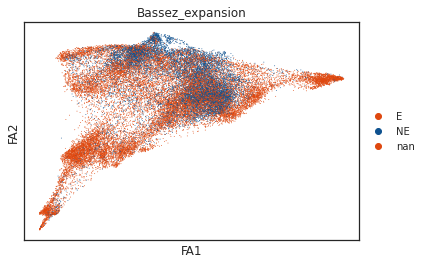

In [152]:
sc.pl.draw_graph(adata_celltype, color = ['Bassez_expansion'], s = 3, palette=[blue_red[-1],blue_red[0]], legend_fontsize = 10, vmin=0)


In [153]:
#compare gene sets
a = set(input_df[input_df['gs.name']=='CD8-T_terminal-exhaustion']['g.name'])
b = set(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name'])
intersection = a.intersection(b)
a_not_b = a - b
b_not_a = b - a


print('intersection:',intersection)
print('only exhausted',a_not_b)
print('only tumor-reactive', b_not_a)

intersection: {'CXCL13'}
only exhausted {'NR4A1', 'TOX', 'NR4A3', 'EOMES', 'LAG3', 'PDCD1', 'NR4A2', 'IRF4', 'CD244', 'HAVCR2', 'ID2', 'PRDM1'}
only tumor-reactive {'ENTPD1', 'TNFRSF18', 'ITGAE', 'GZMA', 'IFNG', 'MKI67', 'TNFRSF9'}


/data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_exhaust-reactive_venn.svg


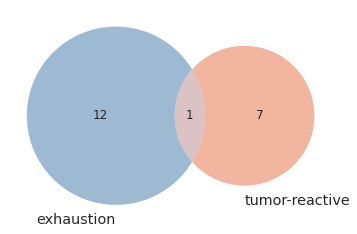

In [154]:
#plot venn
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
from matplotlib import pyplot as plt

venn2(subsets=(len(a_not_b),len(b_not_a),len(intersection)),set_labels=('exhaustion','tumor-reactive'),
     set_colors= blue_red)
fig_save_path_complete = fig_save_path+'Bassez_exhaust-reactive_venn'+'.svg'
plt.savefig(fig_save_path_complete,dpi=300)
print(fig_save_path_complete)

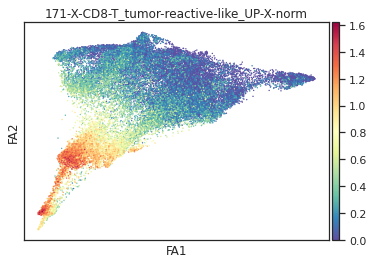

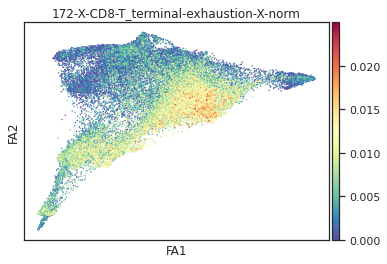

In [157]:
sns.set_style('white')
sc.pl.draw_graph(adata_celltype, color = ['171-X-CD8-T_tumor-reactive-like_UP-X-norm'], s = 8, cmap='Spectral_r', legend_fontsize = 10, vmin=0,save='Bassez_tumor-reac_fdl_new-norm.svg')
sc.pl.draw_graph(adata_celltype, color = ['172-X-CD8-T_terminal-exhaustion-X-norm'], s = 8, cmap='Spectral_r', legend_fontsize = 10, vmin=0,save='Bassez_exhaust_fdl_new-norm.svg')



In [158]:
#compare gene sets
a = set(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name']) 
b = set(adata_celltype.uns['SPADE_markers_specific']['CD8_T']['171-X-CD8-T_tumor-reactive-like_UP'])
intersection = a.intersection(b)
a_not_b = a - b
b_not_a = b - a


print('intersection:',intersection)
print('only input',a_not_b)
print('only tumor-reactive', b_not_a)

intersection: {'ENTPD1', 'TNFRSF18', 'ITGAE', 'GZMA', 'IFNG', 'MKI67', 'TNFRSF9', 'CXCL13'}
only input set()
only tumor-reactive {'NFATC1', 'STAT5A', 'GALNT2', 'MTHFD2', 'LAG3', 'LINC02195', 'FBXW7', 'GBP1', 'SH2D2A', 'ZBTB32', 'GNLY', 'IL10RB', 'CD38', 'TESPA1', 'BTN3A2', 'CCL3', 'GZMH', 'RBPJ', 'FASLG', 'GADD45G', 'LTA', 'GZMM', 'LCK', 'LCP2', 'CCR1', 'SLA', 'DOK2', 'ITM2A', 'SEMA7A', 'NR4A3', 'GZMB', 'GFI1', 'CIC', 'PRF1', 'LAX1', 'LAYN', 'RHOH', 'HAVCR2', 'BATF', 'KRT86', 'TNFRSF4', 'CD8B'}


/data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_tumor-reactive_input_venn.svg


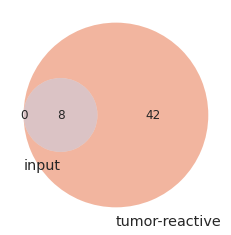

In [159]:
#plot venn
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
from matplotlib import pyplot as plt

venn2(subsets=(len(a_not_b),len(b_not_a),len(intersection)),set_labels=('input','tumor-reactive'),
     set_colors= blue_red)
fig_save_path_complete = fig_save_path+'Bassez_tumor-reactive_input_venn'+'.svg'
plt.savefig(fig_save_path_complete,dpi=300)
print(fig_save_path_complete)

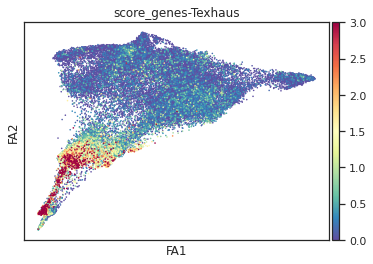

In [166]:
#compare with scoregenes
score_name = 'score_genes-Texhaus'
gene_set_list = list(input_df[input_df['gs.name']=='CD8-T_terminal-exhaustion']['g.name'])

sc.tl.score_genes(adata_celltype, gene_set_list, ctrl_size=50, gene_pool=None, n_bins=25, score_name=score_name, random_state=0, copy=False, use_raw=None)

sc.pl.draw_graph(adata_celltype, color = score_name, s = 10, cmap='Spectral_r', 
                 legend_fontsize = 10, vmin=0,vmax=3,save = 'Bassez_score_genes-Texhaus.svg')

### correlation of exhaustion and tumor reactivity gene sets

In [170]:
color_dict = {'EOMES':'#0E518F',
 'PDCD1':'#0E518F',
 'ITGAE':'#DF480F',
 'PRDM1':'#0E518F',
 'LAG3':'#0E518F',
 'CXCL13':'#000000',
 'TNFRSF9':'#DF480F',
 'NR4A2':'#0E518F',
 'MKI67':'#DF480F',
 'GZMA':'#DF480F',
 'NR4A3':'#0E518F',
 'ID2':'#0E518F',
 'ENTPD1':'#DF480F',
 'HAVCR2':'#0E518F',
 'TNFRSF18':'#DF480F',
 'NR4A1':'#0E518F',
 'IFNG':'#DF480F',
 'CD244':'#0E518F',
 'TOX':'#0E518F',
 'IRF4':'#0E518F'}

In [176]:
genes_a = list(set(input_df[input_df['gs.name']=='CD8-T_terminal-exhaustion']['g.name']))
genes_b = list(set(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name']))
order_list = [
 'HAVCR2',
 'CD244',
 'EOMES',
 'LAG3',
 'TOX',
 'ID2',
 'PDCD1',
 'NR4A2',
 'NR4A1',
 'IRF4',
 'PRDM1',
 'NR4A3',
'CXCL13',
'GZMA', 'TNFRSF18', 'ENTPD1', 'TNFRSF9', 'MKI67', 'ITGAE', 'IFNG']
genes = order_list


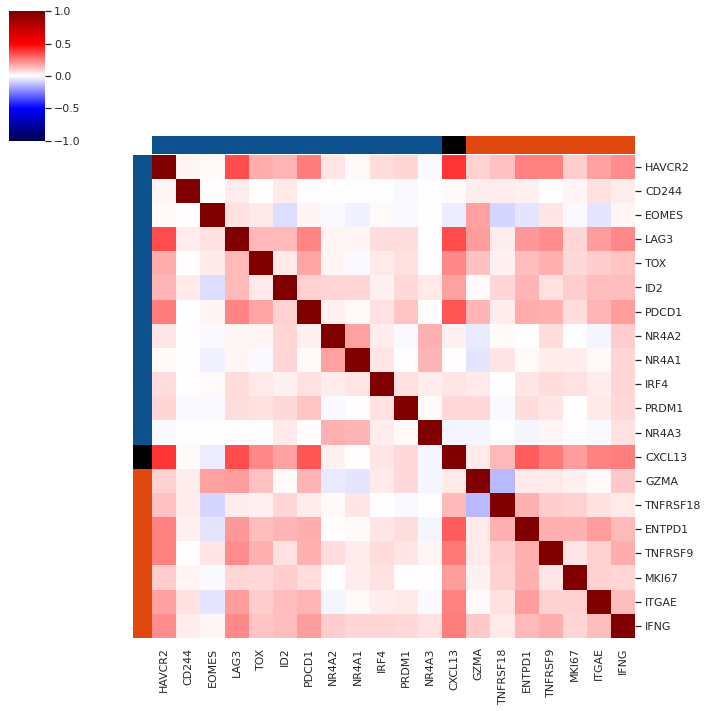

In [177]:
#correlation of genes in exhaustion and tumor reactive geneset
#genes =  list(set(list(set(input_df[input_df['gs.name']=='CD8-T_terminal-exhaustion']['g.name'])) + list(set(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name']))))
corr_df = pd.DataFrame(np.corrcoef(adata_celltype[:,genes].X.todense().T),index=order_list,columns=order_list)#index=genes,columns=genes)
corr_df = corr_df

sns.set(font_scale=1)
sns.clustermap(corr_df,pivot_kws=None, method='average', metric='euclidean', 
           standard_scale=None, figsize=(10, 10), cbar_kws=None, row_cluster=None, 
           col_cluster=None, row_linkage=None, col_linkage=None, row_colors=corr_df.index.map(color_dict), 
           col_colors=corr_df.columns.map(color_dict), mask=None, dendrogram_ratio=0.2, colors_ratio=0.03, cmap='seismic',
           cbar_pos=(0.02, 0.8, 0.05, 0.18), tree_kws=None,vmin=-1,center=0,vmax=1)
#plt.savefig(figure_save_path + save_name)
#print(save_name)

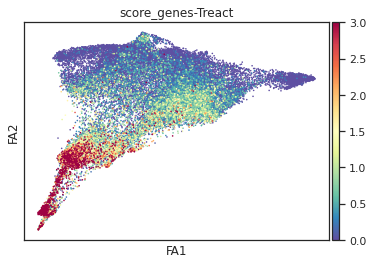

In [167]:
#compare with scoregenes
gene_set_list = list(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name'])

sc.tl.score_genes(adata_celltype, gene_set_list, ctrl_size=50, gene_pool=None, n_bins=25, score_name='score_genes-Treact', random_state=0, copy=False, use_raw=None)

sc.pl.draw_graph(adata_celltype, color = 'score_genes-Treact', s = 10, cmap='Spectral_r', legend_fontsize = 10,vmax=3, vmin=0,save='score_genes-Treact.svg')

In [168]:
corr_df_gs = pd.DataFrame()
gene_set_names = ['CD8-T_tumor-reactive-like_UP','CD8-T_terminal-exhaustion']
gene_set_lists = [list(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name']),
                 list(input_df[input_df['gs.name']=='CD8-T_terminal-exhaustion']['g.name'])]



for h,i in enumerate(gene_set_lists):
        name = gene_set_names[h]
        sc.tl.score_genes(adata_celltype, i, ctrl_size=50, gene_pool=None, n_bins=25, score_name='score_genes', random_state=0, copy=False, use_raw=None)
        for j in i:
            gene_exp = np.array(adata_celltype[:,j].X.todense()).flatten()
            score = np.array(adata_celltype.obs['score_genes'])
            corr = np.cov([gene_exp,score])
            corr_df_gs.loc[j,name]= corr[0][1]

Bassez_exhaustion_reactivity_covariance.svg


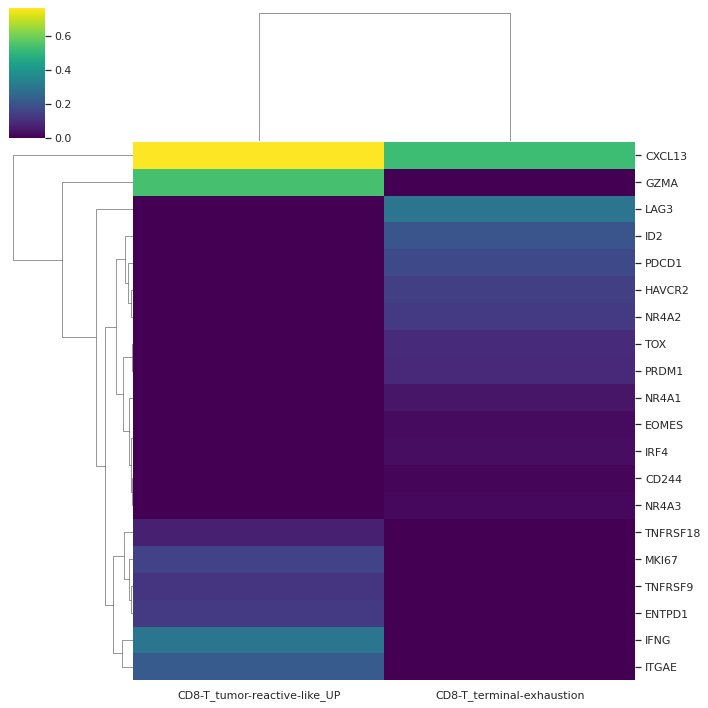

In [169]:
save_name = 'Bassez_exhaustion_reactivity_covariance.svg'
sns.set(font_scale=1)
sns.clustermap(data = corr_df_gs.fillna(0),pivot_kws=None, method='average', metric='euclidean', 
           standard_scale=None, figsize=(10, 10), cbar_kws=None, row_cluster=True, 
           col_cluster=True, row_linkage=None, col_linkage=None, 
            mask=None, dendrogram_ratio=0.2, colors_ratio=0.03, cmap='viridis',
           cbar_pos=(0.02, 0.8, 0.05, 0.18), tree_kws=None,)
plt.savefig(fig_save_path + save_name)
print(save_name)

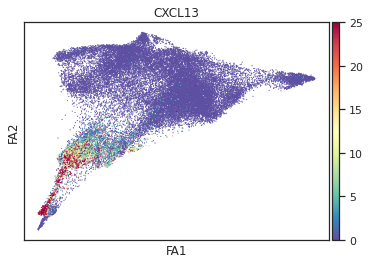

In [181]:
sns.set_style('white')
sc.pl.draw_graph(adata_celltype, color = ['CXCL13'],cmap='Spectral_r', legend_fontsize = 10, 
                 save='Bassez_CD8_CXCL13.svg',s=5,vmin=0,vmax=25)

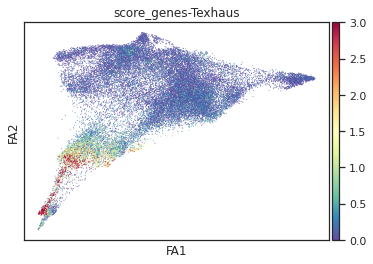

In [182]:
#compare with scoregenes
score_name = 'score_genes-Texhaus'
gene_set_list = list(input_df[input_df['gs.name']=='CD8-T_terminal-exhaustion']['g.name'])

sc.tl.score_genes(adata_celltype, gene_set_list, ctrl_size=50, gene_pool=None, n_bins=25, score_name=score_name, random_state=0, copy=False, use_raw=None)

sc.pl.draw_graph(adata_celltype, color = score_name, s = 3, cmap='Spectral_r', 
                 legend_fontsize = 10, vmin=0,vmax=3, save = 'Bassez_score_genes-Texhaus.svg')

(28766, 3)
(28766, 3)
(28766, 3)
['all_:_13.397761245915316%', 'E_:_19.28487690504103%', 'NE_:_2.35%']
saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez-treac-exhaust_correlation-scatter-norm.svg
SpearmanrResult(correlation=0.07206225442876901, pvalue=1.959049984792364e-34)


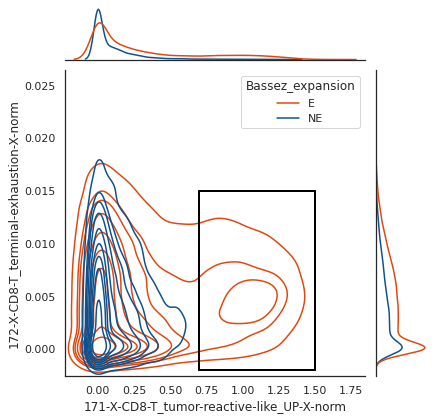

In [183]:
%matplotlib inline
#create df for scatter
save_name = 'Bassez-treac-exhaust_correlation-scatter-norm.svg'
#create dict for batches to sample ids
clinical_var_key = 'Bassez_expansion'
use_gene_expression = True
hue_order = ['E','NE']
factor_list = ["172-X-CD8-T_terminal-exhaustion-X-norm","171-X-CD8-T_tumor-reactive-like_UP-X-norm"]

zero_cutoff = 0

df = adata_celltype[adata_celltype.obs[clinical_var_key].isin(hue_order)].obs[[clinical_var_key]+factor_list]
print(df.shape)
df = df[df[factor_list[0]]>zero_cutoff]
print(df.shape)
df = df[df[factor_list[1]]>zero_cutoff]
print(df.shape)

#calculate correlation
title = scipy.stats.spearmanr(np.array(df[factor_list[0]]), np.array(df[factor_list[1]]), axis=0, nan_policy='propagate')

#plot
sns.set_theme(style="white")
#sns.relplot(x=factor_list[1], y=factor_list[0], hue=clinical_var_key,
  #          sizes=(40, 400), alpha=.5, palette=['#DF480F','#0E518F','#000000'],
 #           height=3, data=df,s=4)

g = sns.jointplot(
    data=df,
    x=df.columns[2], y=df.columns[1] ,hue=df.columns[0],hue_order = hue_order,palette=['#DF480F','#0E518F'],
    kind="kde",
)

draw_square_gate(df, g, clinical_var_key, factor_list[1], factor_list[0], (0.7,1.5),(-0.002,0.015),
                 width=2, color='#000000',print_absolute=False)


#plt.title(title)
save_name_complete = fig_save_path + save_name
plt.savefig(save_name_complete)
print('saved to:',save_name_complete)
print(title)

(28766, 3)
(13360, 3)
(8437, 3)
['all_:_7.372288728220931%', 'E_:_8.780336991807081%', 'NE_:_2.7439024390243905%']
saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez-scoregenes_exhaust_correlation-scatter.svg
SpearmanrResult(correlation=0.5956758746157526, pvalue=0.0)


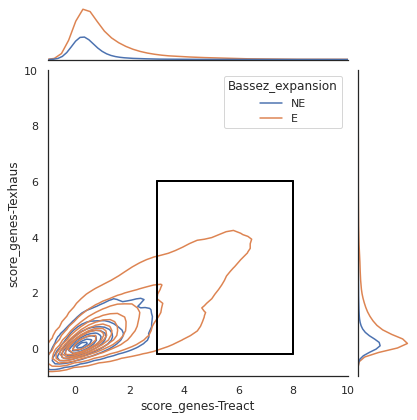

In [184]:
 #create df for scatter
save_name = 'Bassez-scoregenes_exhaust_correlation-scatter.svg'
#create dict for batches to sample ids
clinical_var_key = 'Bassez_expansion'
use_gene_expression = True
hue_order = ['NE','E']
#factor_list = ["173-X-T_tcr-activation","171-X-CD8-T_tumor-reactive-like_UP"]
factor_list = ["score_genes-Texhaus","score_genes-Treact"]
zero_cutoff = 0

df = adata_celltype[adata_celltype.obs[clinical_var_key].isin(hue_order)].obs[[clinical_var_key]+factor_list]
print(df.shape)
df = df[df[factor_list[0]]>zero_cutoff]
print(df.shape)
df = df[df[factor_list[1]]>zero_cutoff]
print(df.shape)

#calculate correlation
title = scipy.stats.spearmanr(np.array(df[factor_list[0]]), np.array(df[factor_list[1]]), axis=0, nan_policy='propagate')

#plot
sns.set_theme(style="white")
#sns.relplot(x=factor_list[1], y=factor_list[0], hue=clinical_var_key,
  #          sizes=(40, 400), alpha=.5, palette=['#DF480F','#0E518F','#000000'],
 #           height=3, data=df,s=4)
g = sns.jointplot(
    data=df,
    x=df.columns[2], y=df.columns[1] ,hue=df.columns[0],hue_order = hue_order,
    kind="kde",
)
g.ax_marg_x.set_xlim(-1, 10)
g.ax_marg_y.set_ylim(-1, 10)


draw_square_gate(df, g, clinical_var_key, factor_list[1], factor_list[0], (3,8),(-0.2,6), 
                 width=2, color='#000000',print_absolute=False)

#plt.title(title)
save_name_complete = fig_save_path + save_name
plt.savefig(save_name_complete)
print('saved to:',save_name_complete)
print(title)

## plot mean cell scores per sample

saved figure to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_CD8-reembeded-norm_171-X-CD8-T_tumor-reactive-like_UP-X-norm_histplot_celltypes.svg


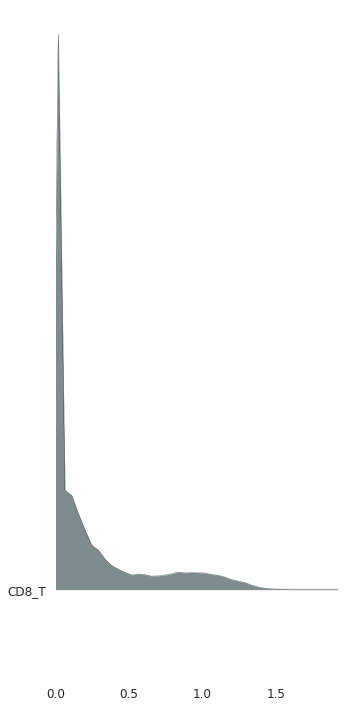

In [185]:
import joypy
program = '171-X-CD8-T_tumor-reactive-like_UP-X-norm'
sns.set_style('white')
plot_df = adata_celltype.obs[['annotation_SPADE_1',program]]
fig, axes = joypy.joyplot(plot_df, by="annotation_SPADE_1",kind='normalized_counts',bins=50,linewidth=0.25,figsize=(5,10),
                         color='#7F8C8D')
for i in axes:
    i.set_xlim(0,)
save_path_figure_complete = fig_save_path+adata_name[:-5]+'_'+program+'_'+'histplot_celltypes.svg'
plt.savefig(save_path_figure_complete,dpi=300)
print('saved figure to:',save_path_figure_complete)

In [186]:
#define factors for plotting (they're not metabolic factors that is just the variable name)
metabolic_factors =  ['171-X-CD8-T_tumor-reactive-like_UP-X-norm',"175-X-TNK_PD-1_signaling-X-norm"]

In [187]:
#The SPECTRA loadings are generally bimodal. The lower mode can be assumed to be non-expression while the 
#upper mode can be assumed to be expression of this factor. While the lower mode is generally close to zero it 
#is not exactly 0. here we will calculate the positive fraction of cells for different factors to find a good
#threshold above the lower mode but below the higher mode of the factor loadings
#calculate pos frac for diferent thresholds to find a rational threshold for defining the zero fraction

#set everything below threshold 0
thresholds_to_test =[0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10]

out_df = pd.DataFrame()

for thresh in thresholds_to_test:
    plotting_df = adata_celltype.obs[metabolic_factors]
    plotting_df_thresh = plotting_df.applymap(lambda x: 0 if x < thresh else x)
    plotting_df_thresh_group = plotting_df_thresh

    df = plotting_df_thresh_group.copy()
    df_frac = pd.DataFrame()

    #calculate positive fraction per gene program and cell type
    for i in df.columns:
        df['sign'] = np.sign(df[i])
        allzero  = df['sign'] == 0
        nonezero  = df['sign'] != 0
        if allzero.all() ==False and nonezero.all()==False:
            pos_cells = df.sign.value_counts()
            pos_frac = pos_cells[1]/(pos_cells[0]+pos_cells[1])
            out_df.loc[thresh,i] = pos_frac
        elif nonezero.all()==True:
            #print('for',i,'no negative cells were detected, setting positive fraction to 1')
            out_df.loc[thresh,i] = 1
        elif allzero.all()==True:
            #print('for',i,'no positive cells were detected, setting positive fraction to 0')
            out_df.loc[thresh,i] = 0

out_df      

,171-X-CD8-T_tumor-reactive-like_UP-X-norm,175-X-TNK_PD-1_signaling-X-norm
0.00,1.000000,1.000000
0.01,0.616727,0.787815
0.02,0.605732,0.747972
0.03,0.593923,0.702584
0.04,0.579577,0.655912
0.05,0.562506,0.605701
0.06,0.546186,0.558215
0.07,0.529209,0.509193
0.08,0.512827,0.465904
0.09,0.497197,0.423117


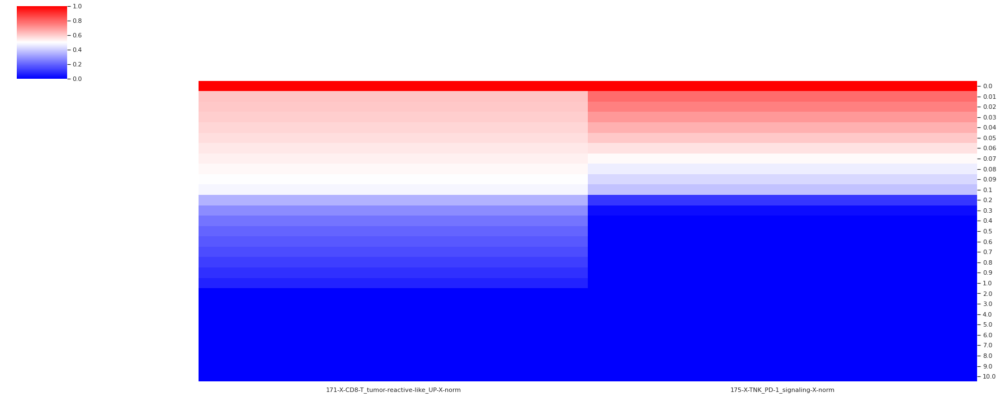

In [212]:
#plot pos fractions for different thresholds
sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
h = sns.clustermap(out_df,
               cmap='bwr', col_cluster=False, row_cluster=False, figsize=(25,10), vmax=1,center=0.5,vmin=0, z_score= None)


In [213]:
#calculate aggregate factor loadings per batch

#set parameters
clinical_var_obs = 'Bassez_timepoint' #obs for clinical variable to correlate with
clinical_var2_obs = 'Bassez_expansion'
patient_obs = 'Bassez_patient_id'
obs_columns = ['clinical_var','clinical_var2','patient'] #these will store the obs above and will be dropped for calculations
zero_cutoff = 0.001
#define parameters
#factor_name_list_corr = list(set(adata_celltype.uns['SPADE_markers_global'].keys()))


df_batches = pd.DataFrame()

for j in set(adata_celltype.obs['batch']):
    adata_celltype_subset = adata_celltype[adata_celltype.obs['batch']==j]
    clinical_var = list(set(adata_celltype_subset.obs[clinical_var_obs]))[0]
    clinical_var2 = list(set(adata_celltype_subset.obs[clinical_var2_obs]))[0]
    patient = list(set(adata_celltype_subset.obs[patient_obs]))[0]
    
    #define here which metric you want to use
    for i in factor_name_list_corr:
        #greater_zero = list(set(adata_celltype_subset.obs[i] > zero_cutoff))
        #if greater_zero[0] == False and len(greater_zero) == 1:
         #   a = 0 #set 0 if all loadings are 0
        #else:
        #a = scipy.stats.mstats.gmean(adata_celltype_pre.obs[i])
        #a = len(adata_celltype_pre.obs[adata_celltype_pre.obs[i] >zero_cutoff])/len(adata_celltype_pre.obs[i])
        #a = scipy.stats.mstats.gmean(adata_celltype_subset.obs[adata_celltype_subset.obs[i] >zero_cutoff][i])
        a = np.mean(adata_celltype_subset.obs[adata_celltype_subset.obs[i] >zero_cutoff][i])
        #a = np.mean(adata_celltype_pre.obs[i])
        
        df_batches.loc[j,i]=a
        df_batches.loc[j,'clinical_var'] = clinical_var
        df_batches.loc[j,'clinical_var2'] = clinical_var2
        df_batches.loc[j,'patient'] = patient

/home/wallet/.local/lib/python3.10/site-packages/pandas/core/indexing.py:1684: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.obj[key] = infer_fill_value(value)


In [214]:
#drop all zero columns
df_batches_plot = df_batches.dropna(axis=1)
is_nonzero = df_batches_plot != 0
df_batches_plot = df_batches_plot.loc[:,is_nonzero.any()]
df_batches_plot

,173-X-T_tcr-activation-X-norm,clinical_var,clinical_var2,patient,174-X-CD8-T_IL12_response-X-norm,177-X-177-X-norm,175-X-TNK_PD-1_signaling-X-norm,176-X-TNK_cytotoxicity-effectors-X-norm,171-X-CD8-T_tumor-reactive-like_UP-X-norm,23-X-leuko_transendothelial-migration-X-norm,...,75-X-all_actin-cytoskeleton_regulation-X-norm,62-X-all_NOTCH_signaling-X-norm,25-X-all_MHC-I-presentation-X-norm,103-X-all_LYS_metabolism-X-norm,121-X-all_thrombolysis-factor_production-X-norm,92-X-all_TLR_signaling-X-norm,45-X-all_apoptosis-X-norm,4-X-all_IL6-JAK-STAT3_signaling-X-norm,42-X-all_NOD-like-receptor_signaling-X-norm,43-X-all_xenobiotics_metabolism-X-norm
JUQ042,0.173294,Pre,NE,JUQ042_JUQ044,0.003503,0.078584,0.141934,0.136721,0.132870,0.008055,...,0.004376,0.001605,0.068645,0.014771,0.015253,0.002194,0.002180,0.002636,0.002039,0.001320
JUQ106,0.131679,Pre,NE,JUQ106_JUQ108,0.003277,0.071238,0.135606,0.165144,0.113512,0.007527,...,0.004295,0.001716,0.058970,0.014771,0.019816,0.001936,0.002139,0.002563,0.002175,0.001389
JUQ104,0.238361,On,NE,JUQ103_JUQ104,0.002760,0.029054,0.052124,0.132282,0.267103,0.007846,...,0.004468,0.001849,0.077847,0.016805,0.011763,0.002497,0.002365,0.003592,0.002021,0.001096
JUQ052,0.128143,Pre,E,JUQ052_JUQ056,0.002263,0.029650,0.065674,0.109712,0.177514,0.005490,...,0.004123,0.001857,0.039366,0.018182,0.019189,0.002937,0.002178,0.002779,0.003107,0.001506
JUQ062,0.136200,On,E,JUQ060_JUQ062,0.002728,0.028377,0.071201,0.107875,0.552792,0.007410,...,0.004413,0.001473,0.055609,0.017097,0.019007,0.002582,0.001930,0.002837,0.002301,0.001429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
JUQ043,0.156336,Pre,NE,JUQ043_JUQ047,0.003677,0.071148,0.132045,0.188753,0.165040,0.008074,...,0.004384,0.001579,0.076546,0.014075,0.026485,0.002460,0.002077,0.002415,0.001923,0.001368
JUQ119,0.151737,Pre,NE,JUQ119_JUQ120,0.002814,0.050567,0.077446,0.186936,0.122701,0.007890,...,0.004133,0.001646,0.082387,0.021405,0.016326,0.002402,0.002218,0.002606,0.002342,0.001361
JUQ121,0.163269,Pre,NE,JUQ121_JUQ122,0.002645,0.041406,0.075732,0.216166,0.124041,0.007477,...,0.003680,0.001688,0.081684,0.017978,0.015899,0.002290,0.002101,0.002314,0.002327,0.001378
JUQ047,0.177160,On,NE,JUQ043_JUQ047,0.002806,0.065419,0.104848,0.162966,0.174659,0.007948,...,0.004246,0.001626,0.056888,0.016233,0.019322,0.002184,0.002220,0.002532,0.002058,0.001370


saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/171-X-CD8-T_tumor-reactive-like_UP-X-norm.svg


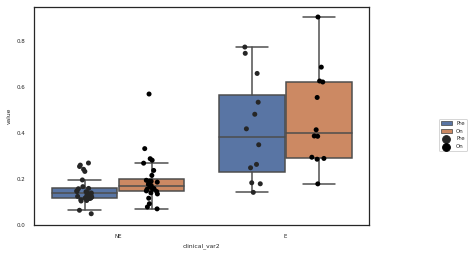

In [192]:
#plot mean of positive fraction cell scores per sample
gene_set = '171-X-CD8-T_tumor-reactive-like_UP-X-norm'
save_name = gene_set + '.svg'

clinical_var_to_include = ['Pre','On']
clinical_var_to_include2 = ['NE','E',]
sns.set_style('white')
df_plot = df_batches.copy()   
df_plot = df_plot.melt(id_vars=['clinical_var','clinical_var2'])
df_plot = df_plot[df_plot['variable']==gene_set]
df_plot = df_plot[df_plot['clinical_var'].isin(clinical_var_to_include)]
df_plot = df_plot[df_plot['clinical_var2'].isin(clinical_var_to_include2)]

ax = sns.boxplot(x='clinical_var2',y='value',hue='clinical_var',data=df_plot, showfliers = False,
                hue_order=clinical_var_to_include,order=clinical_var_to_include2)
sns.stripplot(x='clinical_var2',y='value',hue='clinical_var',data=df_plot, color='#000000',dodge=True,
             hue_order=clinical_var_to_include,order=clinical_var_to_include2)
ax.set_ylim(0,)
plt.legend(bbox_to_anchor=(0.8, 0., 0.5, 0.5))
save_name_complete = fig_save_path + save_name
plt.savefig(save_name_complete)
print('saved to:',save_name_complete)

In [193]:
#Cohen's d
df_sub = df_plot[df_plot['clinical_var']=='Pre']
df_sub_1 = df_sub[df_sub['clinical_var2']=='NE']
df_sub_2  = df_sub[df_sub['clinical_var2']=='E']
(np.mean(df_sub_1['value'])-np.mean(df_sub_2['value']))/np.std(list(df_sub_1['value'])+list(df_sub_2['value']))

-1.5102392350447293

In [194]:
#Cohen's d
df_sub = df_plot[df_plot['clinical_var']=='On']
df_sub_1 = df_sub[df_sub['clinical_var2']=='NE']
df_sub_2  = df_sub[df_sub['clinical_var2']=='E']
(np.mean(df_sub_1['value'])-np.mean(df_sub_2['value']))/np.std(list(df_sub_1['value'])+list(df_sub_2['value']))

-1.4909859044770188

In [216]:
#comparison E NE
df_batches_plot_sub = df_batches_plot[df_batches_plot['clinical_var']=='Pre'].sort_values('patient')
a = list(df_batches_plot_sub[df_batches_plot_sub['clinical_var2']=='E']['171-X-CD8-T_tumor-reactive-like_UP-X-norm'])
b = list(df_batches_plot_sub[df_batches_plot_sub['clinical_var2']=='NE']['171-X-CD8-T_tumor-reactive-like_UP-X-norm'])
scipy.stats.mannwhitneyu(a, b, use_continuity=True, alternative='two-sided', 
                          )

MannwhitneyuResult(statistic=308.0, pvalue=3.8348275832950745e-05)

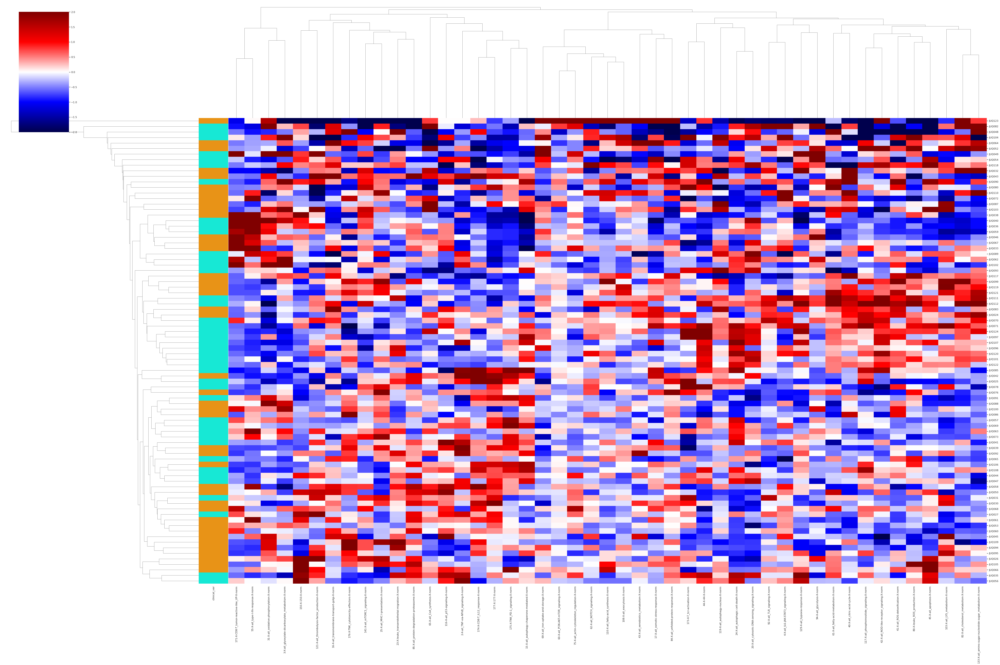

In [217]:
#drop factors with any nan
color_dict = {'Pre':'#E89317','On':'#17E8D5'}

sns.set(font_scale=1)
sns.clustermap(df_batches_plot.drop(columns=obs_columns), pivot_kws=None, method='average', 
               metric='euclidean', 
           z_score=1, standard_scale=None, figsize=(60, 40), cbar_kws=None, 
           row_cluster=True, col_cluster=True, row_linkage=None, col_linkage=None, 
           row_colors=df_batches['clinical_var'].map(color_dict), col_colors=None, mask=None, 
           dendrogram_ratio=0.2, colors_ratio=0.03, cmap='seismic',
           cbar_pos=(0.02, 0.8, 0.05, 0.18), tree_kws=None,vmin=-2,center=0,vmax=2)

In [218]:
#normalize each patient to pre value

df_list = []

for i in set(df_batches['patient']):
    df_batches_subset = df_batches[df_batches['patient']==i]
    #check if pre and on sample available for patient and if so normalize to pre
    if 'Pre' in list(df_batches_subset['clinical_var'])and 'On' in list(df_batches_subset['clinical_var']):
        df_batches_subset_on = df_batches_subset[df_batches_subset['clinical_var']=='On'].drop(columns=obs_columns).astype(float)
        df_batches_subset_pre = df_batches_subset[df_batches_subset['clinical_var']=='Pre'].drop(columns=obs_columns).astype(float)
        if log_loadings:
            df_batches_subset_norm = df_batches_subset_on.iloc[0,:] - df_batches_subset_pre.iloc[0,:] #for logged subtract
        else:
            df_batches_subset_norm = df_batches_subset_on.iloc[0,:]/df_batches_subset_pre.iloc[0,:] #for logged subtract
        df_batches_subset_norm.loc['patient']=i
        df_batches_subset_norm.loc['clinical_var2']= list(set(df_batches_subset['clinical_var2']))[0]
        df_list.append(df_batches_subset_norm.T)
        print('normalized patient:', i)
    else:
        print('missing pre or on for patient:',i)
df_patients_norm = pd.concat(df_list,axis=1).T

normalized patient: JUQ121_JUQ122
normalized patient: JUQ042_JUQ044
normalized patient: JUQ053_JUQ057
normalized patient: JUQ095_JUQ097
normalized patient: JUQ068_JUQ070
normalized patient: JUQ105_JUQ107
normalized patient: JUQ030_JUQ031
normalized patient: JUQ083_JUQ085
normalized patient: JUQ045_JUQ048
normalized patient: JUQ092_JUQ093
normalized patient: JUQ087_JUQ090
normalized patient: JUQ052_JUQ056
normalized patient: JUQ100_JUQ102
normalized patient: JUQ024_JUQ025
normalized patient: JUQ110_JUQ112
normalized patient: JUQ099_JUQ101
normalized patient: JUQ038_JUQ040
normalized patient: JUQ032_JUQ035
normalized patient: JUQ046_JUQ049
normalized patient: JUQ058_JUQ059
normalized patient: JUQ043_JUQ047
normalized patient: JUQ039_JUQ041
normalized patient: JUQ123_JUQ124
normalized patient: JUQ094_JUQ096
normalized patient: JUQ088_JUQ091
normalized patient: JUQ060_JUQ062
normalized patient: JUQ033_JUQ036
normalized patient: JUQ117_JUQ118
normalized patient: JUQ050_JUQ054
normalized pat

In [219]:
df_patients_norm

,173-X-T_tcr-activation-X-norm,174-X-CD8-T_IL12_response-X-norm,177-X-177-X-norm,175-X-TNK_PD-1_signaling-X-norm,176-X-TNK_cytotoxicity-effectors-X-norm,172-X-CD8-T_terminal-exhaustion-X-norm,171-X-CD8-T_tumor-reactive-like_UP-X-norm,143-X-all_pyroptosis-X-norm,39-X-all_glycerin-SER-THR_metabolism-X-norm,59-X-all_thiamin_metabolism-X-norm,...,99-X-all_galactose_metabolism-X-norm,43-X-all_xenobiotics_metabolism-X-norm,142-X-142-X-norm,147-X-all_glycerophospholipid_metabolism-X-norm,109-X-all_pyrimidine_synthesis-X-norm,145-X-all_ethanol_metabolism-X-norm,151-X-151-X-norm,134-X-all_mitotic-spindle-component-X-norm,patient,clinical_var2
0,1.007243,1.010114,1.120211,1.110138,0.850047,1.662912,1.32074,0.87376,0.870503,0.977363,...,0.929071,0.973665,1.145814,0.993789,0.726635,0.943866,1.401196,1.137689,JUQ121_JUQ122,NE
1,1.051017,0.878098,0.786777,0.79802,1.126704,1.044579,1.417244,1.153873,0.989233,0.708358,...,1.032421,1.134537,1.128308,1.046058,0.794071,1.004691,1.895574,0.996539,JUQ042_JUQ044,NE
2,0.898747,1.01096,1.060394,1.538717,0.946227,1.539104,1.106212,0.980478,0.995316,1.149837,...,1.062817,0.98528,0.698986,0.933184,0.977749,0.951238,0.490659,0.882987,JUQ053_JUQ057,E
3,1.44337,0.866172,0.991731,1.11726,0.552269,1.486329,1.65552,0.719971,1.068423,1.144875,...,0.981961,0.981258,2.428034,1.08271,0.820587,1.062569,1.964106,0.936349,JUQ095_JUQ097,NE
4,0.773746,0.903715,0.795377,1.051988,1.029364,1.441962,0.774897,1.090634,0.96836,0.986768,...,1.172139,0.991251,1.084148,1.055501,0.898516,1.129892,0.937631,0.881893,JUQ068_JUQ070,E
5,1.002752,1.034616,0.890679,1.552985,0.897882,2.105754,0.999707,1.009337,1.064229,0.872355,...,1.038125,0.89191,0.830037,0.935108,0.729452,1.054283,0.192839,0.846973,JUQ105_JUQ107,NE
6,1.18744,0.912301,0.848259,0.807164,0.982386,0.900462,1.185427,1.224306,1.023997,0.855818,...,1.058105,0.898558,1.000575,0.969536,0.925534,1.024108,1.174454,0.962457,JUQ030_JUQ031,E
7,0.770689,1.275419,1.201114,2.04517,0.865008,1.395538,0.476041,0.820932,0.742066,0.931025,...,0.88635,0.934961,NaN,0.812112,0.74526,1.107961,0.84043,1.011213,JUQ083_JUQ085,NE
8,0.756169,1.10255,0.799251,0.736577,1.184133,1.06227,0.791919,1.041245,NaN,1.281266,...,1.553729,0.724177,1.978851,1.460976,0.586302,1.061379,1.915531,1.003083,JUQ045_JUQ048,NE
9,1.747566,0.892136,0.988839,0.885938,0.852342,0.898307,1.715269,1.079813,0.914419,0.697565,...,0.73714,0.847977,0.738747,1.1187,0.830786,0.979708,0.390231,1.019364,JUQ092_JUQ093,NE


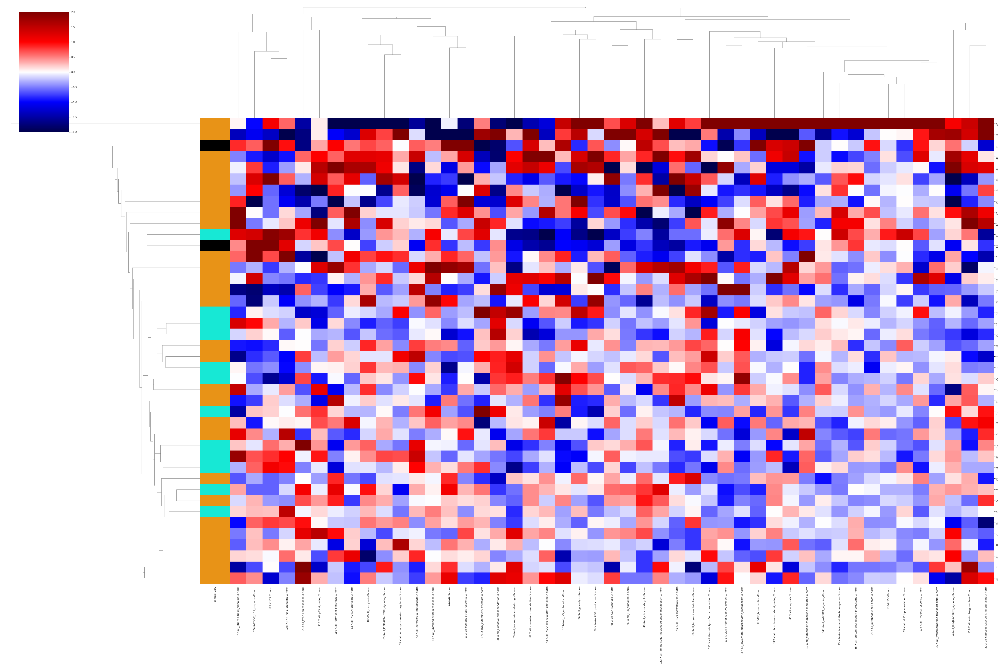

In [220]:
df_patients_norm_plot = df_patients_norm.dropna(axis=1)
color_dict = {'NE':'#E89317','E':'#17E8D5','nan':'#000000'}

sns.set(font_scale=1)
sns.clustermap(df_patients_norm_plot.drop(columns=['patient','clinical_var2']).astype(float),pivot_kws=None, method='average', 
               metric='euclidean', 
           z_score=1, standard_scale=None, figsize=(60, 40), cbar_kws=None, 
           row_colors=df_patients_norm_plot['clinical_var2'].map(color_dict), row_cluster=True, col_cluster=True, row_linkage=None, col_linkage=None,
            col_colors=None, mask=None, 
           dendrogram_ratio=0.2, colors_ratio=0.03, cmap='seismic',
           cbar_pos=(0.02, 0.8, 0.05, 0.18), tree_kws=None,vmin=-2,center=0,vmax=2)

### assess clinical vars of interest in normalized data

In [221]:
clinical_var_key = 'Bassez_expansion'

In [222]:
clinical_var_dict = adata_celltype.obs[[clinical_var_key,'Bassez_patient_id']].set_index('Bassez_patient_id').to_dict()[clinical_var_key]
color_dict = {'E':'#E89317','NE':'#17E8D5'}


In [223]:
df_patients_norm_plot

,173-X-T_tcr-activation-X-norm,174-X-CD8-T_IL12_response-X-norm,177-X-177-X-norm,175-X-TNK_PD-1_signaling-X-norm,176-X-TNK_cytotoxicity-effectors-X-norm,171-X-CD8-T_tumor-reactive-like_UP-X-norm,23-X-leuko_transendothelial-migration-X-norm,24-X-all_autophagic-cell-death-X-norm,31-X-all_oxidative-phosphorylation-X-norm,110-X-all_fatty-acid_synthesis-X-norm,...,25-X-all_MHC-I-presentation-X-norm,103-X-all_LYS_metabolism-X-norm,121-X-all_thrombolysis-factor_production-X-norm,92-X-all_TLR_signaling-X-norm,45-X-all_apoptosis-X-norm,4-X-all_IL6-JAK-STAT3_signaling-X-norm,42-X-all_NOD-like-receptor_signaling-X-norm,43-X-all_xenobiotics_metabolism-X-norm,patient,clinical_var2
0,1.007243,1.010114,1.120211,1.110138,0.850047,1.32074,1.055349,2.483218,1.022886,0.803544,...,0.882034,0.913446,1.183756,0.995948,1.097058,1.083274,1.046961,0.973665,JUQ121_JUQ122,NE
1,1.051017,0.878098,0.786777,0.79802,1.126704,1.417244,1.014321,1.270477,1.160664,1.009524,...,0.931074,0.945196,1.44758,1.05595,0.973263,1.010321,1.105686,1.134537,JUQ042_JUQ044,NE
2,0.898747,1.01096,1.060394,1.538717,0.946227,1.106212,0.98429,2.335835,1.028446,0.948647,...,1.116384,0.925976,0.923407,1.036304,1.043417,0.959434,1.085707,0.98528,JUQ053_JUQ057,E
3,1.44337,0.866172,0.991731,1.11726,0.552269,1.65552,0.874729,2.593752,0.963852,1.02978,...,0.884592,0.774222,0.803991,1.039625,1.050181,0.896575,1.237285,0.981258,JUQ095_JUQ097,NE
4,0.773746,0.903715,0.795377,1.051988,1.029364,0.774897,0.956539,2.345137,0.875747,1.118477,...,0.923259,0.987723,1.051452,1.284079,0.98866,1.057185,1.087325,0.991251,JUQ068_JUQ070,E
5,1.002752,1.034616,0.890679,1.552985,0.897882,0.999707,0.92937,3.101922,0.823193,0.871289,...,0.83177,0.946467,1.03943,1.037757,0.807757,0.947689,1.152515,0.89191,JUQ105_JUQ107,NE
6,1.18744,0.912301,0.848259,0.807164,0.982386,1.185427,1.051532,0.943095,1.157008,0.965301,...,1.06667,0.97154,1.258194,1.295208,1.002541,1.019549,0.968752,0.898558,JUQ030_JUQ031,E
7,0.770689,1.275419,1.201114,2.04517,0.865008,0.476041,1.055863,2.673245,1.075834,0.925819,...,1.043883,1.090427,0.964775,0.883091,0.927895,1.05131,1.10898,0.934961,JUQ083_JUQ085,NE
8,0.756169,1.10255,0.799251,0.736577,1.184133,0.791919,1.27557,1.634861,0.726805,1.075845,...,1.044412,0.690528,1.058976,0.936699,0.757327,0.848051,1.006155,0.724177,JUQ045_JUQ048,NE
9,1.747566,0.892136,0.988839,0.885938,0.852342,1.715269,0.879679,1.656646,1.024845,0.930848,...,0.901092,0.879266,1.006664,1.060821,0.823384,1.036145,1.032457,0.847977,JUQ092_JUQ093,NE


In [224]:
df_patients_norm_plot = df_patients_norm_plot.set_index('patient')

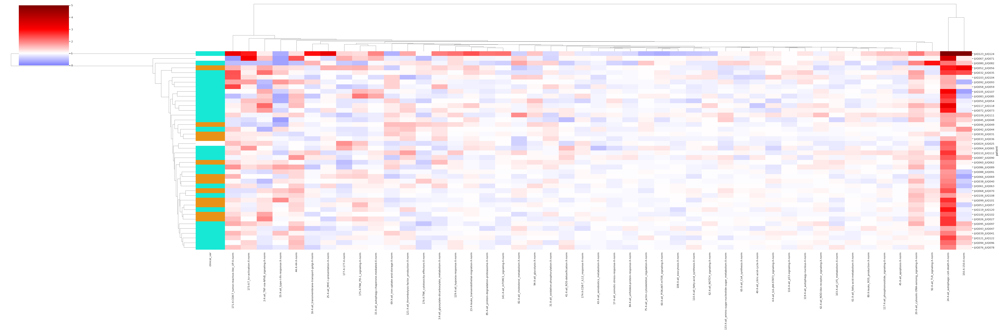

In [225]:
#add clinical var info
correlation_df_pre_plot_annotated = df_patients_norm_plot.drop(columns='clinical_var2').T.copy().astype(float).T
correlation_df_pre_plot_annotated['clinical_var'] = correlation_df_pre_plot_annotated.index.map(clinical_var_dict).T

sns.set(font_scale=1)
sns.clustermap(correlation_df_pre_plot_annotated.drop(columns='clinical_var'), pivot_kws=None, method='average', 
               metric='euclidean', 
           z_score=None, standard_scale=None, figsize=(60, 20), cbar_kws=None, 
           row_cluster=True, col_cluster=True, row_linkage=None, col_linkage=None, 
            col_colors=None, mask=None, row_colors = correlation_df_pre_plot_annotated['clinical_var'].map(color_dict),
           dendrogram_ratio=0.2, colors_ratio=0.03, cmap='seismic',cbar_pos=(0.02, 0.8, 0.05, 0.18), tree_kws=None,
                vmin=0,center=1,vmax=5 )

In [226]:
#compare fold change of clinical var
correlation_df_pre_plot_annotated_grouped = correlation_df_pre_plot_annotated.groupby('clinical_var').median()
if log_loadings:
    correlation_df_pre_plot_annotated_norm = correlation_df_pre_plot_annotated_grouped.loc['E'].subtract(correlation_df_pre_plot_annotated_grouped.loc['NE'])
else:
    correlation_df_pre_plot_annotated_norm = correlation_df_pre_plot_annotated_grouped.loc['E'].divide(correlation_df_pre_plot_annotated_grouped.loc['NE'])
correlation_df_pre_plot_annotated_norm.sort_values(ascending=False)[0:20]

177-X-177-X-norm                                            1.232898
2-X-all_TNF-via-NFkB_signaling-X-norm                       1.190824
3-X-all_glyoxylate-dicarboxylate_metabolism-X-norm          1.136105
31-X-all_oxidative-phosphorylation-X-norm                   1.129258
176-X-TNK_cytotoxicity-effectors-X-norm                     1.102163
85-X-all_protein-degradation-proteasome-X-norm              1.073862
15-X-all_autophagy-chaperone-mediated-X-norm                1.071027
174-X-CD8-T_IL12_response-X-norm                            1.068318
175-X-TNK_PD-1_signaling-X-norm                             1.043616
43-X-all_xenobiotics_metabolism-X-norm                      1.041226
55-X-all_type-I-ifn-response-X-norm                         1.040039
84-X-all_unfolded-protein-response-X-norm                   1.030649
141-X-all_mTORC1_signaling-X-norm                           1.029449
23-X-leuko_transendothelial-migration-X-norm                1.010994
133-X-all_amino-sugar-nucleotide-s

### stats for all SPADE programs

In [227]:
df_plot = correlation_df_pre_plot_annotated.drop(columns='clinical_var')
df_plot = df_plot.T.reindex(correlation_df_pre_plot_annotated_norm.sort_values(ascending=False).index).T
df_plot['clinical_var'] = correlation_df_pre_plot_annotated['clinical_var'].copy()
df_plot_melt = df_plot.melt(id_vars = 'clinical_var')
df_plot_melt

,clinical_var,variable,value
0,NE,177-X-177-X-norm,1.120211
1,NE,177-X-177-X-norm,0.786777
2,E,177-X-177-X-norm,1.060394
3,NE,177-X-177-X-norm,0.991731
4,E,177-X-177-X-norm,0.795377
...,...,...,...
1969,NE,69-X-all_iron-uptake-and-storage-X-norm,1.137294
1970,NE,69-X-all_iron-uptake-and-storage-X-norm,1.061603
1971,NE,69-X-all_iron-uptake-and-storage-X-norm,0.968585
1972,NE,69-X-all_iron-uptake-and-storage-X-norm,1.357772


In [228]:
subset = ['2-X-all_TNF-via-NFkB_signaling-X-norm']
remove_nan= True
df_plot_melt_subset = df_plot_melt[df_plot_melt['variable'].isin(subset)]
if remove_nan:
    df_plot_melt_subset = df_plot_melt_subset[df_plot_melt_subset['clinical_var']!='nan']
df_plot_melt_subset

,clinical_var,variable,value
42,NE,2-X-all_TNF-via-NFkB_signaling-X-norm,0.858219
43,NE,2-X-all_TNF-via-NFkB_signaling-X-norm,0.414815
44,E,2-X-all_TNF-via-NFkB_signaling-X-norm,1.207155
45,NE,2-X-all_TNF-via-NFkB_signaling-X-norm,1.248417
46,E,2-X-all_TNF-via-NFkB_signaling-X-norm,1.285257
47,NE,2-X-all_TNF-via-NFkB_signaling-X-norm,1.647513
48,E,2-X-all_TNF-via-NFkB_signaling-X-norm,1.153325
49,NE,2-X-all_TNF-via-NFkB_signaling-X-norm,1.397414
50,NE,2-X-all_TNF-via-NFkB_signaling-X-norm,0.953145
51,NE,2-X-all_TNF-via-NFkB_signaling-X-norm,0.481331


In [229]:
subset_df = df_plot_melt_subset[df_plot_melt_subset['variable']==subset[0]]
group_1 = np.array(subset_df[subset_df['clinical_var']=='E']['value'])
group_2 = np.array(subset_df[subset_df['clinical_var']=='NE']['value'])
scipy.stats.mannwhitneyu(group_1, group_2, use_continuity=True, alternative='two-sided')

MannwhitneyuResult(statistic=211.0, pvalue=0.20971560272803147)

In [231]:
import statsmodels

result_df = pd.DataFrame()

for gene_set in correlation_df_pre_plot_annotated.drop(columns='clinical_var').columns:
    group_1 = df_plot[df_plot['clinical_var']=='E'][gene_set]
    group_1 = list(group_1)
    group_2 = df_plot[df_plot['clinical_var']=='NE'][gene_set]
    group_2 = list(group_2)
    
    #test
    result_mw = scipy.stats.mannwhitneyu(group_1, group_2, use_continuity=True, alternative='two-sided')
    result_df.loc[gene_set,'pvalue'] = result_mw[1]

### fold change on treatment

In [234]:
correlation_df_pre_plot_annotated.median().sort_values(ascending=False)[0:30].index

/scratch/lsftmp/13731371.tmpdir/ipykernel_134032/3667500878.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  correlation_df_pre_plot_annotated.median().sort_values(ascending=False)[0:30].index


Index(['24-X-all_autophagic-cell-death-X-norm', '44-X-44-X-norm',
       '20-X-all_cytosolic-DNA-sensing_signaling-X-norm',
       '171-X-CD8-T_tumor-reactive-like_UP-X-norm',
       '173-X-T_tcr-activation-X-norm',
       '2-X-all_TNF-via-NFkB_signaling-X-norm', '150-X-150-X-norm',
       '69-X-all_iron-uptake-and-storage-X-norm',
       '175-X-TNK_PD-1_signaling-X-norm',
       '121-X-all_thrombolysis-factor_production-X-norm',
       '42-X-all_NOD-like-receptor_signaling-X-norm',
       '23-X-leuko_transendothelial-migration-X-norm',
       '92-X-all_TLR_signaling-X-norm', '94-X-all_glycolysis-X-norm',
       '117-X-all_phosphoinositide_signaling-X-norm',
       '15-X-all_autophagy-chaperone-mediated-X-norm',
       '129-X-all_hypoxia-response-X-norm',
       '4-X-all_IL6-JAK-STAT3_signaling-X-norm',
       '25-X-all_MHC-I-presentation-X-norm',
       '40-X-all_citric-acid-cycle-X-norm',
       '31-X-all_oxidative-phosphorylation-X-norm',
       '62-X-all_NOTCH_signaling-X-norm', '1

In [235]:
#one sample mann whithney u
gene_set = '171-X-CD8-T_tumor-reactive-like_UP-X-norm'
med_hyp = 1 #hypothesized median
clinical_var = 'E'
#define groups for comparison
df = correlation_df_pre_plot_annotated[correlation_df_pre_plot_annotated['clinical_var']==clinical_var]
group_1 = df[gene_set]
group_1 = np.array(group_1)


#test
print(np.mean(group_1))
scipy.stats.wilcoxon(group_1-med_hyp, zero_method='wilcox', correction=False, alternative='two-sided', mode='auto')

1.2225710245951993


WilcoxonResult(statistic=10.0, pvalue=0.02099609375)

([<matplotlib.axis.XTick at 0x2aedea3902b0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

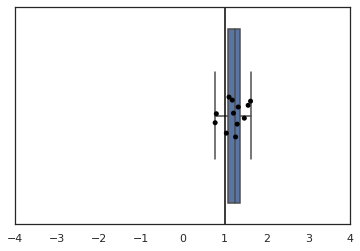

In [236]:
ax = sns.boxplot(x=group_1)
sns.stripplot(x=group_1,color='#000000')
xlim = (-4,4)
ax.set_xlim(xlim[0],xlim[1])
plt.axvline(x=med_hyp, color='black', linestyle='-')

plt.xticks(np.arange(xlim[0],xlim[1]+1, step=1))

In [237]:
correlation_df_pre_plot_annotated

,173-X-T_tcr-activation-X-norm,174-X-CD8-T_IL12_response-X-norm,177-X-177-X-norm,175-X-TNK_PD-1_signaling-X-norm,176-X-TNK_cytotoxicity-effectors-X-norm,171-X-CD8-T_tumor-reactive-like_UP-X-norm,23-X-leuko_transendothelial-migration-X-norm,24-X-all_autophagic-cell-death-X-norm,31-X-all_oxidative-phosphorylation-X-norm,110-X-all_fatty-acid_synthesis-X-norm,...,62-X-all_NOTCH_signaling-X-norm,25-X-all_MHC-I-presentation-X-norm,103-X-all_LYS_metabolism-X-norm,121-X-all_thrombolysis-factor_production-X-norm,92-X-all_TLR_signaling-X-norm,45-X-all_apoptosis-X-norm,4-X-all_IL6-JAK-STAT3_signaling-X-norm,42-X-all_NOD-like-receptor_signaling-X-norm,43-X-all_xenobiotics_metabolism-X-norm,clinical_var
patient,,,,,,,,,,,,,,,,,,,,,
JUQ121_JUQ122,1.007243,1.010114,1.120211,1.110138,0.850047,1.320740,1.055349,2.483218,1.022886,0.803544,...,1.032708,0.882034,0.913446,1.183756,0.995948,1.097058,1.083274,1.046961,0.973665,NE
JUQ042_JUQ044,1.051017,0.878098,0.786777,0.798020,1.126704,1.417244,1.014321,1.270477,1.160664,1.009524,...,1.031628,0.931074,0.945196,1.447580,1.055950,0.973263,1.010321,1.105686,1.134537,NE
JUQ053_JUQ057,0.898747,1.010960,1.060394,1.538717,0.946227,1.106212,0.984290,2.335835,1.028446,0.948647,...,0.988169,1.116384,0.925976,0.923407,1.036304,1.043417,0.959434,1.085707,0.985280,E
JUQ095_JUQ097,1.443370,0.866172,0.991731,1.117260,0.552269,1.655520,0.874729,2.593752,0.963852,1.029780,...,1.173512,0.884592,0.774222,0.803991,1.039625,1.050181,0.896575,1.237285,0.981258,NE
JUQ068_JUQ070,0.773746,0.903715,0.795377,1.051988,1.029364,0.774897,0.956539,2.345137,0.875747,1.118477,...,1.006823,0.923259,0.987723,1.051452,1.284079,0.988660,1.057185,1.087325,0.991251,E
JUQ105_JUQ107,1.002752,1.034616,0.890679,1.552985,0.897882,0.999707,0.929370,3.101922,0.823193,0.871289,...,0.904624,0.831770,0.946467,1.039430,1.037757,0.807757,0.947689,1.152515,0.891910,NE
JUQ030_JUQ031,1.187440,0.912301,0.848259,0.807164,0.982386,1.185427,1.051532,0.943095,1.157008,0.965301,...,1.033476,1.066670,0.971540,1.258194,1.295208,1.002541,1.019549,0.968752,0.898558,E
JUQ083_JUQ085,0.770689,1.275419,1.201114,2.045170,0.865008,0.476041,1.055863,2.673245,1.075834,0.925819,...,1.149184,1.043883,1.090427,0.964775,0.883091,0.927895,1.051310,1.108980,0.934961,NE
JUQ045_JUQ048,0.756169,1.102550,0.799251,0.736577,1.184133,0.791919,1.275570,1.634861,0.726805,1.075845,...,1.009563,1.044412,0.690528,1.058976,0.936699,0.757327,0.848051,1.006155,0.724177,NE


In [238]:
df_plot = correlation_df_pre_plot_annotated.drop(columns='clinical_var')
df_plot = df_plot.T.reindex(df_plot.median().sort_values(ascending=False).index).T
df_plot_melt = df_plot.melt()
df_plot_melt

,variable,value
0,24-X-all_autophagic-cell-death-X-norm,2.483218
1,24-X-all_autophagic-cell-death-X-norm,1.270477
2,24-X-all_autophagic-cell-death-X-norm,2.335835
3,24-X-all_autophagic-cell-death-X-norm,2.593752
4,24-X-all_autophagic-cell-death-X-norm,2.345137
...,...,...
1969,176-X-TNK_cytotoxicity-effectors-X-norm,0.871643
1970,176-X-TNK_cytotoxicity-effectors-X-norm,0.961200
1971,176-X-TNK_cytotoxicity-effectors-X-norm,0.950590
1972,176-X-TNK_cytotoxicity-effectors-X-norm,0.735441


saved fig to: CD8_change_upon_treatment.svg


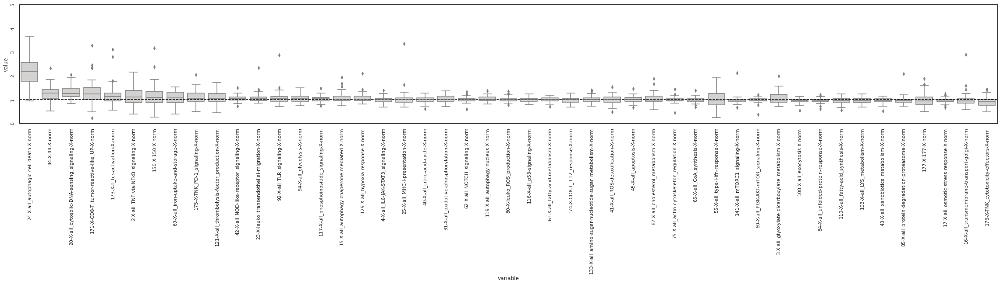

In [242]:
sns.set_style('white')
save_name = 'CD8_change_upon_treatment.svg'
fig,ax = plt.subplots(figsize=(40, 5))
ax.tick_params(labelrotation=90)
ax.set_ylim(0,5)
sns.boxplot(x="variable", y="value", data=df_plot_melt,color='#D3D2D1')
plt.axhline(y=1,color='#000000',linestyle='--')
plt.savefig(fig_save_path + save_name)
print('saved fig to:',save_name)



# TAM story

In [243]:
#parameters
cell_subset = ['MDC']
adata_path = DATA_DIR + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded.h5ad'

adata_save_path = DATA_DIR + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_Msubset.h5ad'
input_gene_sets = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/SPADE_genes_x_genesets.csv'
annotation_key = 'annotation_SPADE_1'
recalculate_fdl = True
recalculate_PCs = True
save_adata = False

In [244]:
#paths
input_gene_sets = DATA_DIR + 'SPADE_genes_x_genesets.csv'
input_gene_set_x_celltypes_global =  DATA_DIR + 'SPADE_cells_x_genesets_general.csv'
input_gene_set_x_celltypes_specific =  DATA_DIR + 'SPADE_cells_x_genesets_celltype-specific_modified_for_SPADE.csv'

In [245]:
#load input gene sets
input_df = pd.read_csv(input_gene_sets)
input_global_df = pd.read_csv(input_gene_set_x_celltypes_global)
input_specific_df = pd.read_csv(input_gene_set_x_celltypes_specific)

In [248]:
df_plot = pd.read_csv(input_gene_sets)
df_plot

,gs.name,g.name
0,all_multidrug-resistance,ABCC4
1,all_multidrug-resistance,ABCB4
2,all_multidrug-resistance,ABCC3
3,all_multidrug-resistance,ABCC1
4,all_porphyrine-heme_metabolism,UROS
...,...,...
7855,all_folate_metabolism,SLC19A1
7856,all_folate_metabolism,AMT
7857,all_folate_metabolism,FOLR3
7858,all_folate_metabolism,FTCD


In [251]:
adata = sc.read(adata_path)
print('read adata from:',adata_path)

Only considering the two last: ['.0_50PC_reembedded', '.h5ad'].
Only considering the two last: ['.0_50PC_reembedded', '.h5ad'].
read adata from: /data/peer/wallet/Jupyter/SPADE_Peer_validation/data/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded.h5ad


In [253]:
#define factors
factor_name_list = list(set(adata.uns['SPADE_markers_specific'][cell_subset[0]].keys())) 
factor_name_list_corr = factor_name_list + list(set(adata.uns['SPADE_markers_global'].keys()))
factor_name_list_corr  = [x+'-X-norm' for x in factor_name_list_corr ]
factor_name_list_corr 

['185-X-Mac_CSF1_response-X-norm',
 '183-X-Mac_LPS_response-X-norm',
 '184-X-Mac_IL4-IL13_response-X-norm',
 '187-X-187-X-norm',
 '186-X-Mac_IFNG_response-X-norm',
 '182-X-M_angiogenic-effectors-X-norm',
 '143-X-all_pyroptosis-X-norm',
 '39-X-all_glycerin-SER-THR_metabolism-X-norm',
 '59-X-all_thiamin_metabolism-X-norm',
 '148-X-all_complement_production-X-norm',
 '23-X-leuko_transendothelial-migration-X-norm',
 '146-X-all_taurine-hypotaurine_metabolism-X-norm',
 '49-X-all_peroxisome-component-X-norm',
 '24-X-all_autophagic-cell-death-X-norm',
 '63-X-all_purine_metabolism-X-norm',
 '88-X-all_sphingolipid_metabolism-X-norm',
 '13-X-all_TYR_metabolism-X-norm',
 '37-X-all_lipophagy-X-norm',
 '31-X-all_oxidative-phosphorylation-X-norm',
 '110-X-all_fatty-acid_synthesis-X-norm',
 '48-X-all_bile-acid_synthesis-X-norm',
 '15-X-all_autophagy-chaperone-mediated-X-norm',
 '82-X-all_cholesterol_metabolism-X-norm',
 '34-X-all_NAD_metabolism-X-norm',
 '55-X-all_type-I-ifn-response-X-norm',
 '26-X-a

In [254]:
#subset adata
adata_celltype = adata[adata.obs[annotation_key].isin(cell_subset)]
adata_celltype

View of AnnData object with n_obs × n_vars = 12132 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'phen

In [255]:
#set sample id
adata_celltype.obs['sample_id'] = adata_celltype.obs['Bassez_patient_id'].str.cat(adata_celltype.obs['Bassez_timepoint'], sep='_')
len(set(adata_celltype.obs['sample_id']))

/scratch/lsftmp/13731371.tmpdir/ipykernel_134032/2755462270.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_celltype.obs['sample_id'] = adata_celltype.obs['Bassez_patient_id'].str.cat(adata_celltype.obs['Bassez_timepoint'], sep='_')


83

In [256]:
#recalculate FDL
if recalculate_fdl:
    #np.random.seed(0)
    #sc.pp.neighbors(adata_celltype, n_neighbors=15, method= 'umap', n_pcs=number_of_PC_used,random_state=0)
    sc.tl.diffmap(adata_celltype, n_comps=15, neighbors_key=None,  copy=False)

/home/wallet/miniconda3/envs/2022_Peer_SPADE_cellrank2/lib/python3.10/site-packages/scanpy/neighbors/__init__.py:924: RuntimeWarning: divide by zero encountered in true_divide
  Q = scipy.sparse.spdiags(1.0 / q, 0, W.shape[0], W.shape[0])
/home/wallet/miniconda3/envs/2022_Peer_SPADE_cellrank2/lib/python3.10/site-packages/scanpy/neighbors/__init__.py:934: RuntimeWarning: divide by zero encountered in true_divide
  self.Z = scipy.sparse.spdiags(1.0 / z, 0, K.shape[0], K.shape[0])


In [258]:
compare_factors(df_plot, gene_plot, 'patient', 'expansion_timepoint', ['EPre','EOn'],test='wilcoxon',
                         zero_method='wilcox', correction=False, 
                          alternative='two-sided',  axis=0, 
                          nan_policy='propagate')

pre and on patients identical True


WilcoxonResult(statistic=38.0, pvalue=0.9697265625)

In [259]:
adata_celltype_E = adata_celltype[adata_celltype.obs['Bassez_expansion']=='E']
adata_celltype_NE = adata_celltype[adata_celltype.obs['Bassez_expansion']=='NE']


## how well do DC pairs separate Macrophage/Monocytes and Responders/Non-responders

In [260]:
#calculate accuracy of predicting NE vs E from different DC embeddings
from sklearn.linear_model import LogisticRegression
class_dict = {}

for i in range(15):
    for j in range(15):
        adata_celltype_nonan = adata_celltype[adata_celltype.obs['Bassez_expansion']!= 'nan']
        X = np.vstack([adata_celltype_nonan.obsm['X_diffmap'][:,i], adata_celltype_nonan.obsm['X_diffmap'][:,j]]).T
        y = np.array(adata_celltype_nonan.obs['Bassez_expansion'].map({'NE':0,'E':1}))

        clf = LogisticRegression(random_state=0).fit(X, y)
        clf.predict(X[:2, :])

        clf.predict_proba(X[:2, :])


        class_dict[str(i)+'_'+str(j)] = clf.score(X, y)





In [261]:
#calculate accuracy of predicting S100A8 from different DC embeddings
from sklearn.linear_model import LinearRegression
class_dict_markers = {}

for i in range(15):
    for j in range(15):
        adata_celltype_nonan = adata_celltype[adata_celltype.obs['Bassez_expansion']!= 'nan']
        X = np.vstack([adata_celltype_nonan.obsm['X_diffmap'][:,i], adata_celltype_nonan.obsm['X_diffmap'][:,j]]).T
        y = np.array(adata_celltype_nonan[:,'S100A8'].X.todense())

        clf = LinearRegression().fit(X, y)
        class_dict_markers[str(i)+'_'+str(j)] = clf.score(X,y)






saved to: Bassez_DC_selection.svg


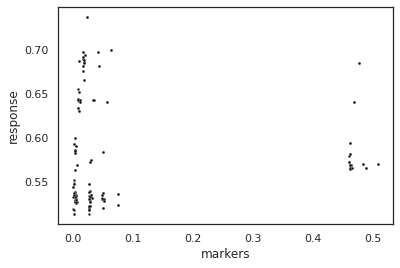

In [262]:
#create df for plotting
save_name = 'Bassez_DC_selection.svg'
plot_df = pd.DataFrame()

for i in class_dict_markers.keys():
    plot_df.loc[i,'markers'] = class_dict_markers[i]
    plot_df.loc[i,'response'] = class_dict[i]
    
sns.scatterplot(data=plot_df, x="markers", y="response",s=6,color='#000000')
plt.savefig(fig_save_path+save_name)
print('saved to:',save_name)

In [263]:
#get DC pair with highest classification accuracy sum
plot_df['sum'] = plot_df['markers']+ plot_df['response']
#convert 0 indexed to 1 indexed
DC_1 = int(plot_df.sort_values(by='sum', ascending=False)['sum'].index[0][0])+1
DC_2 = int(plot_df.sort_values(by='sum', ascending=False)['sum'].index[0][-1])+1
print('Diffusion component pair with the highest classification accuracy + regression coefficient is:',(DC_1,DC_2))

Diffusion component pair with the highest classification accuracy + regression coefficient is: (4, 2)


## correlation of factors with DCs

In [264]:
#correclation of DCs with monocyte_markers
corr_dict = {}
adata_celltype_nonan = adata_celltype[adata_celltype.obs['Bassez_expansion']!= 'nan']
marker_genes = ['S100A8','S100A9','VCAN']

for i in range(15):
    corr_dict_markers = {}
    for j in marker_genes:
        a = np.array(adata_celltype_nonan.obsm['X_diffmap'][:,i])
        b = np.array(adata_celltype_nonan[:,j].X.todense())
        corr_dict_markers[j]  = scipy.stats.spearmanr(a, b, axis=0, 
                                                         nan_policy='propagate', 
                                                      alternative='two-sided')
    corr_dict[i] = corr_dict_markers


In [271]:
#randomize cell order for plotting
adata_celltype = randomize_cells(adata_celltype)

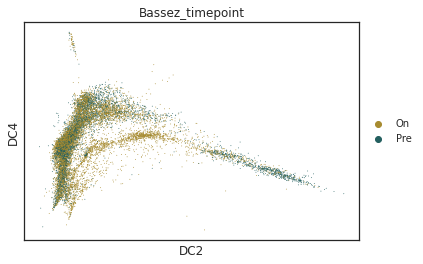

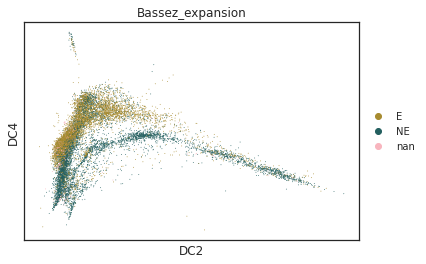

In [266]:
sc.pl.diffmap(adata_celltype,color = ['Bassez_timepoint'], s = 3, components='2,4', palette= batlow_20,cmap='Spectral_r', legend_fontsize = 10, vmin=0 ,save='Bassez_timepoint_TAM.svg')
sc.pl.diffmap(adata_celltype, color = ['Bassez_expansion'], s = 3, components='2,4', palette= batlow_20,cmap='Spectral_r', legend_fontsize = 10, vmin=0 ,save='Bassez_expansion_TAM.svg')

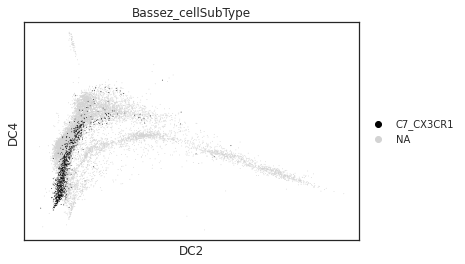

In [267]:
sc.pl.diffmap(adata_celltype, color = ['Bassez_cellSubType'], groups=[  'C7_CX3CR1'],s = 3, components='2,4', palette= ['#000000'],cmap='Spectral_r', 
              save='Bassez_C7.svg',legend_fontsize = 10, vmin=0)

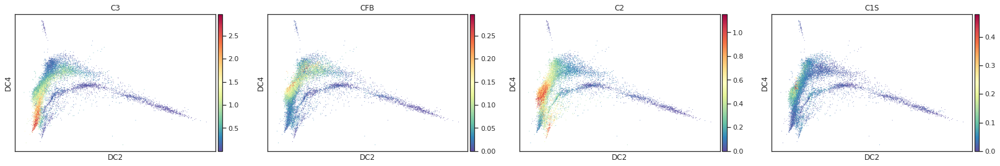

In [268]:
sc.pl.diffmap(adata_celltype,color = ['C3','CFB','C2','C1S'], s = 3, components='2,4', palette= batlow_20,cmap='Spectral_r', 
              legend_fontsize = 10, layer='imputed',save='Bassez_timepoint_TAM_complement.svg')

/data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_C3.svg


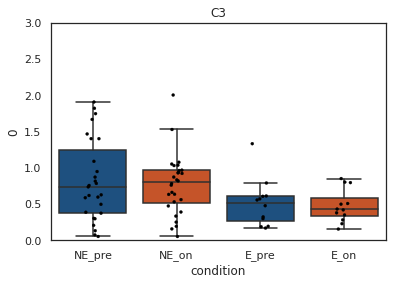

In [269]:
#plot MMP9 
gene_plot ='C3'#'185-X-Mac_IL4-IL13_response-X-norm'#'68-X-all_CYP_metabolism-X-norm'#
#symbol_list = ['o','v','^','<','>','8','s','p','P','*','h','H','+','x','X','D','d',]
save_name = 'Bassez_C3.svg'
adata_celltype_NE = adata_celltype[adata_celltype.obs['Bassez_expansion']=='NE']
adata_celltype_E = adata_celltype[adata_celltype.obs['Bassez_expansion']=='E']


adata_celltype_NE_pre = adata_celltype_NE[adata_celltype_NE.obs['Bassez_timepoint']=='Pre']
adata_celltype_NE_on = adata_celltype_NE[adata_celltype_NE.obs['Bassez_timepoint']=='On']
adata_celltype_E_pre = adata_celltype_E[adata_celltype_E.obs['Bassez_timepoint']=='Pre']
adata_celltype_E_on = adata_celltype_E[adata_celltype_E.obs['Bassez_timepoint']=='On']


df_plot = pd.DataFrame()

df_plot_1= pd.DataFrame(adata_celltype_NE_pre[:,gene_plot].layers['imputed'])
df_plot_1['patient'] = list(adata_celltype_NE_pre.obs['Bassez_patient_id'])
df_plot_1 = df_plot_1.groupby('patient').mean()
df_plot_1['condition'] = ['NE_pre']*len(df_plot_1.index)

df_plot_2 = pd.DataFrame(adata_celltype_NE_on[:,gene_plot].layers['imputed'])
df_plot_2['patient'] =list(adata_celltype_NE_on.obs['Bassez_patient_id'])
df_plot_2 = df_plot_2.groupby('patient').mean()
df_plot_2['condition'] = ['NE_on']*len(df_plot_2.index)

df_plot_3 = pd.DataFrame(adata_celltype_E_pre[:,gene_plot].layers['imputed'])
df_plot_3['patient'] = list(adata_celltype_E_pre.obs['Bassez_patient_id'])
df_plot_3 = df_plot_3.groupby('patient').mean()
df_plot_3['condition'] = ['E_pre']*len(df_plot_3.index)

df_plot_4 = pd.DataFrame(adata_celltype_E_on[:,gene_plot].layers['imputed'])
df_plot_4['patient'] = list(adata_celltype_E_on.obs['Bassez_patient_id'])
df_plot_4 = df_plot_4.groupby('patient').mean()
df_plot_4['condition'] = ['E_on']*len(df_plot_4.index)


df_plot = pd.concat([df_plot_1,df_plot_2,df_plot_3,df_plot_4])
df_plot['patient']=df_plot.index

sns.boxplot(x='condition', y=0, hue=None, data=df_plot, order=None, hue_order=None, orient=None, color=None, palette=blue_red+blue_red, saturation=0.75, 
                width=0.8, dodge=True, fliersize=0, linewidth=None, whis=1.5, ax=None)
sns.stripplot(x='condition', y=0, hue=None, data=df_plot, order=None, hue_order=None, orient=None,s=3, color='#000000', palette=None,
                dodge=True,  linewidth=None, ax=None)

#for j,i in enumerate(list(set(df_plot['patient']))):
   # df_plot_subset = df_plot[df_plot['patient']==i]
    #sns.stripplot(x='condition', y=gene_plot, hue=None, data=df_plot_subset, order=None, hue_order=None, orient=None,s=6, color='#000000', palette=None,marker=symbol_list[j],
      #         dodge=True,  linewidth=None, ax=None)
        
plt.title(gene_plot)

plt.ylim(0,3)
save_name_complete = fig_save_path+save_name
plt.savefig(save_name_complete)
print(save_name_complete)

/data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_CFB.svg


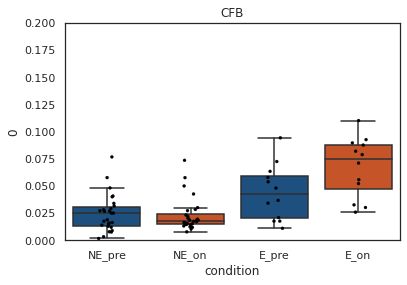

In [270]:
#plot MMP9 
gene_plot ='CFB'#'185-X-Mac_IL4-IL13_response-X-norm'#'68-X-all_CYP_metabolism-X-norm'#
#symbol_list = ['o','v','^','<','>','8','s','p','P','*','h','H','+','x','X','D','d',]
save_name = 'Bassez_CFB.svg'
adata_celltype_NE = adata_celltype[adata_celltype.obs['Bassez_expansion']=='NE']
adata_celltype_E = adata_celltype[adata_celltype.obs['Bassez_expansion']=='E']


adata_celltype_NE_pre = adata_celltype_NE[adata_celltype_NE.obs['Bassez_timepoint']=='Pre']
adata_celltype_NE_on = adata_celltype_NE[adata_celltype_NE.obs['Bassez_timepoint']=='On']
adata_celltype_E_pre = adata_celltype_E[adata_celltype_E.obs['Bassez_timepoint']=='Pre']
adata_celltype_E_on = adata_celltype_E[adata_celltype_E.obs['Bassez_timepoint']=='On']


df_plot = pd.DataFrame()

df_plot_1= pd.DataFrame(adata_celltype_NE_pre[:,gene_plot].layers['imputed'])
df_plot_1['patient'] = list(adata_celltype_NE_pre.obs['Bassez_patient_id'])
df_plot_1 = df_plot_1.groupby('patient').mean()
df_plot_1['condition'] = ['NE_pre']*len(df_plot_1.index)

df_plot_2 = pd.DataFrame(adata_celltype_NE_on[:,gene_plot].layers['imputed'])
df_plot_2['patient'] =list(adata_celltype_NE_on.obs['Bassez_patient_id'])
df_plot_2 = df_plot_2.groupby('patient').mean()
df_plot_2['condition'] = ['NE_on']*len(df_plot_2.index)

df_plot_3 = pd.DataFrame(adata_celltype_E_pre[:,gene_plot].layers['imputed'])
df_plot_3['patient'] = list(adata_celltype_E_pre.obs['Bassez_patient_id'])
df_plot_3 = df_plot_3.groupby('patient').mean()
df_plot_3['condition'] = ['E_pre']*len(df_plot_3.index)

df_plot_4 = pd.DataFrame(adata_celltype_E_on[:,gene_plot].layers['imputed'])
df_plot_4['patient'] = list(adata_celltype_E_on.obs['Bassez_patient_id'])
df_plot_4 = df_plot_4.groupby('patient').mean()
df_plot_4['condition'] = ['E_on']*len(df_plot_4.index)


df_plot = pd.concat([df_plot_1,df_plot_2,df_plot_3,df_plot_4])
df_plot['patient']=df_plot.index

sns.boxplot(x='condition', y=0, hue=None, data=df_plot, order=None, hue_order=None, orient=None, color=None, palette=blue_red+blue_red, saturation=0.75, 
                width=0.8, dodge=True, fliersize=0, linewidth=None, whis=1.5, ax=None)
sns.stripplot(x='condition', y=0, hue=None, data=df_plot, order=None, hue_order=None, orient=None,s=3, color='#000000', palette=None,
                dodge=True,  linewidth=None, ax=None)

#for j,i in enumerate(list(set(df_plot['patient']))):
   # df_plot_subset = df_plot[df_plot['patient']==i]
    #sns.stripplot(x='condition', y=gene_plot, hue=None, data=df_plot_subset, order=None, hue_order=None, orient=None,s=6, color='#000000', palette=None,marker=symbol_list[j],
      #         dodge=True,  linewidth=None, ax=None)
        
plt.title(gene_plot)

plt.ylim(0,0.2)
save_name_complete = fig_save_path+save_name
plt.savefig(save_name_complete)
print(save_name_complete)

### factor cell score correlation with DCs

In [275]:
#plot clinical vars along diff component
df_dc = pd.DataFrame(index=adata_celltype.obs_names)
df_dc['DC2'] = adata_celltype.obsm['X_diffmap'][:,1]
df_dc['DC4'] = adata_celltype.obsm['X_diffmap'][:,3]
for i in factor_name_list_corr :
    df_dc[i] = adata_celltype.obs[i]


df_dc

/scratch/lsftmp/13731371.tmpdir/ipykernel_134032/124080640.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  df_dc[i] = adata_celltype.obs[i]


,DC2,DC4,185-X-Mac_CSF1_response-X-norm,183-X-Mac_LPS_response-X-norm,184-X-Mac_IL4-IL13_response-X-norm,187-X-187-X-norm,186-X-Mac_IFNG_response-X-norm,182-X-M_angiogenic-effectors-X-norm,143-X-all_pyroptosis-X-norm,39-X-all_glycerin-SER-THR_metabolism-X-norm,...,95-X-all_TRP_metabolism-X-norm,42-X-all_NOD-like-receptor_signaling-X-norm,99-X-all_galactose_metabolism-X-norm,43-X-all_xenobiotics_metabolism-X-norm,142-X-142-X-norm,147-X-all_glycerophospholipid_metabolism-X-norm,109-X-all_pyrimidine_synthesis-X-norm,145-X-all_ethanol_metabolism-X-norm,151-X-151-X-norm,134-X-all_mitotic-spindle-component-X-norm
JUQ064_CCTAGCTAGTGGTAAT-1,-0.006359,-0.014124,3.477684e-01,1.414094e-03,2.285195e-03,0.222437,6.133993e-02,0.032741,1.464188e-08,4.148087e-04,...,8.094920e-10,2.249634e-03,1.708736e-09,3.243904e-10,1.692659e-09,3.366139e-03,3.730511e-02,1.348087e-09,0.000007,0.002399
JUQ056_ACGCCAGGTATGCTTG-1,0.001087,-0.010382,2.583704e-01,1.081233e-03,4.481424e-03,0.208156,3.919848e-01,0.052022,6.747395e-09,6.253045e-10,...,1.160505e-09,6.577156e-04,1.368967e-09,4.100478e-04,2.294304e-09,1.645953e-03,5.674910e-09,4.587001e-03,0.017857,0.001319
JUQ104_GTCGTAAAGAGCTTCT-1,-0.003859,-0.003658,2.171004e-01,4.437410e-03,1.300346e-08,0.192075,1.744199e-01,0.210851,1.246304e-09,4.178277e-10,...,1.247112e-09,2.541550e-03,1.102550e-09,2.903051e-10,1.364042e-04,2.117345e-07,2.583109e-03,1.364994e-09,0.007264,0.001626
JUQ036_GGGACCTAGAACTCGG-1,0.003835,0.009204,4.615259e-04,1.829512e-03,5.199981e-02,0.224083,4.149219e-01,0.014751,1.648653e-09,3.296076e-10,...,5.877161e-05,1.633567e-03,1.318925e-03,4.369302e-10,2.931967e-09,7.855329e-04,1.115566e-04,1.322238e-09,0.000004,0.001146
JUQ033_CTCACACCAGCAGTTT-1,-0.005458,-0.002180,2.934482e-01,1.512895e-03,4.198045e-02,0.224564,5.227099e-07,0.059898,3.282344e-08,2.695149e-09,...,1.139333e-09,1.669930e-03,3.054430e-04,6.583136e-04,2.959650e-09,9.662192e-04,9.281668e-03,9.057740e-10,0.000018,0.001504
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
JUQ033_CGGAGCTGTTCTCATT-1,-0.005836,0.001315,2.200444e-01,2.654929e-03,7.258014e-02,0.263829,1.101144e-02,0.100810,2.810609e-09,6.283982e-10,...,8.544894e-10,2.372992e-03,4.488526e-04,1.490929e-10,1.560967e-09,5.196731e-08,1.297232e-02,2.886509e-10,0.000003,0.000781
JUQ111_CCCTCCTTCCAAAGTC-1,0.002412,0.000263,5.835602e-02,1.538501e-03,1.939922e-02,0.169960,1.269636e-01,0.474702,1.565788e-08,8.755861e-10,...,7.379679e-03,1.736239e-03,8.108497e-04,1.967583e-07,1.586227e-09,2.006920e-03,5.654078e-08,6.265210e-03,0.000855,0.002960
JUQ036_ATTATCCCAACAACCT-1,-0.004922,-0.000670,2.753721e-01,1.641921e-03,4.252171e-02,0.226655,1.367174e-02,0.043038,1.082130e-08,6.519139e-10,...,1.545593e-09,1.680009e-03,7.147953e-04,4.249676e-04,2.769336e-09,2.078705e-03,4.002031e-03,4.468369e-07,0.000003,0.000971
JUQ059_TCATTACAGGCATGGT-1,-0.001268,0.013919,3.738029e-07,3.274636e-09,8.866214e-02,0.085102,6.987805e-02,0.314329,9.993670e-03,1.023508e-09,...,1.612522e-09,5.902405e-09,4.692428e-10,8.623475e-10,1.548035e-09,1.543833e-03,1.439726e-09,8.940602e-10,0.000002,0.002504


saved source data to Bassez_Mac_DC_correlation.csv


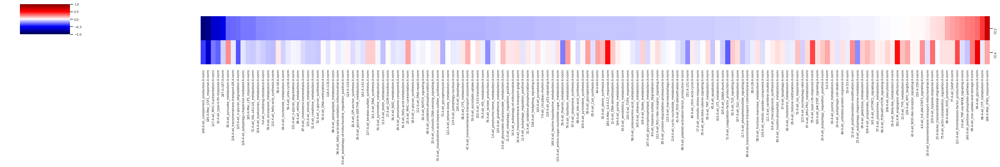

In [277]:
#spearman corr with DCs
save_name=  'Bassez_Mac_DC_correlation.csv'
corr_df = pd.DataFrame()
source = pd.DataFrame()

for i in factor_name_list_corr:
    corr_df.loc['DC2',i] = scipy.stats.spearmanr(df_dc['DC2'],df_dc[i])[0]
    source.loc['DC2',i] = scipy.stats.spearmanr(df_dc['DC2'],df_dc[i])[0]
    source.loc['DC2_p',i] = scipy.stats.spearmanr(df_dc['DC2'],df_dc[i])[1]
    corr_df.loc['DC4',i] = scipy.stats.spearmanr(df_dc['DC4'],df_dc[i])[0]
    source.loc['DC4',i] = scipy.stats.spearmanr(df_dc['DC4'],df_dc[i])[0]
    source.loc['DC4_p',i] = scipy.stats.spearmanr(df_dc['DC4'],df_dc[i])[1]
    
corr_df = corr_df.T.sort_values('DC2').T
sns.set(font_scale=0.6)  
tmp = sns.clustermap(corr_df,
                    figsize=(30,5),vmax=1, center=0,vmin=-1, cmap='seismic',z_score=None,row_cluster=None,
                    col_cluster=None)

#save source data
source.to_csv(DATA_DIR +save_name)
print('saved source data to',save_name)

In [278]:
#gene trends along DCs

DC_of_interest = 1
factors_of_interest = ['148-X-all_complement_production-X-norm','94-X-all_glycolysis-X-norm','68-X-all_CYP_metabolism-X-norm',
                       '2-X-all_TNF-via-NFkB_signaling-X-norm','182-X-M_angiogenic-effectors-X-norm']
adata_trends = adata_celltype
adata_celltype.obs['DC'+str(DC_of_interest+1)] = adata_celltype.obsm['X_diffmap'][:,DC_of_interest]
dict_trends= {}



trends_dict= compute_factor_trends(adata_trends,factors_of_interest, 'DC'+str(DC_of_interest+1))
   

/scratch/lsftmp/13731371.tmpdir/ipykernel_134032/1051180795.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_celltype.obs['DC'+str(DC_of_interest+1)] = adata_celltype.obsm['X_diffmap'][:,DC_of_interest]


['148-X-all_complement_production-X-norm', '94-X-all_glycolysis-X-norm', '68-X-all_CYP_metabolism-X-norm', '2-X-all_TNF-via-NFkB_signaling-X-norm', '182-X-M_angiogenic-effectors-X-norm'] [-1.0094190016e-02 -9.8818911456e-03 -9.6695922749e-03 -9.4572934042e-03
 -9.2449945334e-03 -9.0326956627e-03 -8.8203967919e-03 -8.6080979212e-03
 -8.3957990504e-03 -8.1835001797e-03 -7.9712013089e-03 -7.7589024382e-03
 -7.5466035674e-03 -7.3343046967e-03 -7.1220058260e-03 -6.9097069552e-03
 -6.6974080845e-03 -6.4851092137e-03 -6.2728103430e-03 -6.0605114722e-03
 -5.8482126015e-03 -5.6359137307e-03 -5.4236148600e-03 -5.2113159893e-03
 -4.9990171185e-03 -4.7867182478e-03 -4.5744193770e-03 -4.3621205063e-03
 -4.1498216355e-03 -3.9375227648e-03 -3.7252238940e-03 -3.5129250233e-03
 -3.3006261526e-03 -3.0883272818e-03 -2.8760284111e-03 -2.6637295403e-03
 -2.4514306696e-03 -2.2391317988e-03 -2.0268329281e-03 -1.8145340573e-03
 -1.6022351866e-03 -1.3899363158e-03 -1.1776374451e-03 -9.6533857436e-04
 -7.530397

[(array([ 3.1823250778e-01,  3.1184339832e-01,  3.0545453478e-01,
        2.9906564856e-01,  2.9267647107e-01,  2.8628673372e-01,
        2.7989616792e-01,  2.7350450506e-01,  2.6711147657e-01,
        2.6071681384e-01,  2.5432024828e-01,  2.4792151131e-01,
        2.4152031687e-01,  2.3511601945e-01,  2.2870803577e-01,
        2.2229632319e-01,  2.1588153995e-01,  2.0946495469e-01,
        2.0304857542e-01,  1.9663553777e-01,  1.9023009055e-01,
        1.8383761189e-01,  1.7746486704e-01,  1.7111954478e-01,
        1.6481004124e-01,  1.5854571192e-01,  1.5233648421e-01,
        1.4619242649e-01,  1.4012344016e-01,  1.3413895805e-01,
        1.2824789970e-01,  1.2245872491e-01,  1.1677956104e-01,
        1.1121820031e-01,  1.0578194919e-01,  1.0047763986e-01,
        9.5311732134e-02,  9.0290115521e-02,  8.5417867121e-02,
        8.0699129320e-02,  7.6137097313e-02,  7.1733928836e-02,
        6.7490855737e-02,  6.3408446304e-02,  5.9486627344e-02,
        5.5724713784e-02,  5.212139863

saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_MDC2_trend.svg


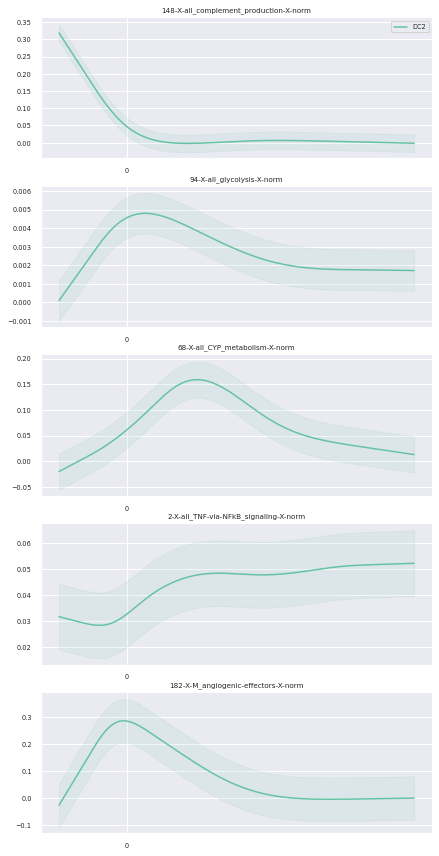

In [279]:
plot_gene_trends(trends_dict)
save_name = 'Bassez_M'+'DC'+str(DC_of_interest+1)+'_'+'trend.svg'
plt.savefig(fig_save_path+save_name)
print('saved to:',fig_save_path+save_name)

saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_MDC2_heatmap_trend.svg


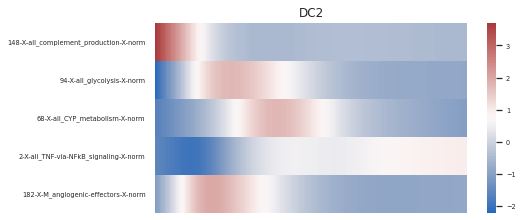

In [280]:
plot_gene_trend_heatmaps(trends_dict,cmap='vlag')
save_name = 'Bassez_M'+'DC'+str(DC_of_interest+1)+'_'+'heatmap_trend.svg'
plt.savefig(fig_save_path+save_name)
print('saved to:',fig_save_path+save_name)

In [281]:
#gene trends along DCs
DC_of_interest = 3
factors_of_interest = ['10-X-all_type-II-ifn-response-X-norm','127-X-all_MHC-II-presentation-X-norm',
                   '184-X-Mac_IL4-IL13_response-X-norm','129-X-all_hypoxia-response-X-norm','182-X-M_angiogenic-effectors-X-norm',
                   ]

adata_trends = adata_celltype
adata_celltype.obs['DC'+str(DC_of_interest+1)] = adata_celltype.obsm['X_diffmap'][:,DC_of_interest]
dict_trends= {}



trends_dict2= compute_factor_trends(adata_trends,factors_of_interest, 'DC'+str(DC_of_interest+1))
   

['10-X-all_type-II-ifn-response-X-norm', '127-X-all_MHC-II-presentation-X-norm', '184-X-Mac_IL4-IL13_response-X-norm', '129-X-all_hypoxia-response-X-norm', '182-X-M_angiogenic-effectors-X-norm'] [-2.8646012768e-02 -2.8388538439e-02 -2.8131064110e-02 -2.7873589781e-02
 -2.7616115452e-02 -2.7358641122e-02 -2.7101166793e-02 -2.6843692464e-02
 -2.6586218135e-02 -2.6328743806e-02 -2.6071269477e-02 -2.5813795147e-02
 -2.5556320818e-02 -2.5298846489e-02 -2.5041372160e-02 -2.4783897831e-02
 -2.4526423502e-02 -2.4268949172e-02 -2.4011474843e-02 -2.3754000514e-02
 -2.3496526185e-02 -2.3239051856e-02 -2.2981577527e-02 -2.2724103198e-02
 -2.2466628868e-02 -2.2209154539e-02 -2.1951680210e-02 -2.1694205881e-02
 -2.1436731552e-02 -2.1179257223e-02 -2.0921782893e-02 -2.0664308564e-02
 -2.0406834235e-02 -2.0149359906e-02 -1.9891885577e-02 -1.9634411248e-02
 -1.9376936918e-02 -1.9119462589e-02 -1.8861988260e-02 -1.8604513931e-02
 -1.8347039602e-02 -1.8089565273e-02 -1.7832090944e-02 -1.7574616614e-02
 -

[(array([0.0057738271, 0.0057817098, 0.0057896581, 0.0057976621,
       0.0058057121, 0.0058137984, 0.0058219112, 0.0058300407,
       0.0058381772, 0.0058463108, 0.0058544319, 0.0058625308,
       0.0058705975, 0.0058786224, 0.0058865957, 0.0058945076,
       0.0059023484, 0.0059101084, 0.0059177777, 0.0059253466,
       0.0059328054, 0.0059401442, 0.0059473533, 0.005954423 ,
       0.0059613436, 0.0059681051, 0.0059746979, 0.0059811123,
       0.0059873383, 0.0059933664, 0.0059991686, 0.0060046743,
       0.0060098065, 0.0060144882, 0.0060186463, 0.0060222327,
       0.0060252086, 0.0060275349, 0.0060291646, 0.0060300455,
       0.006030128 , 0.006029372 , 0.0060277413, 0.0060252041,
       0.0060217343, 0.0060173119, 0.0060119229, 0.0060055597,
       0.0059982258, 0.0059899305, 0.0059806942, 0.0059705472,
       0.005959526 , 0.0059476742, 0.0059350428, 0.0059216879,
       0.0059076695, 0.0058930559, 0.0058779244, 0.005862353 ,
       0.0058464213, 0.0058302101, 0.0058138033, 0.00

saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_MDC4_trend.svg


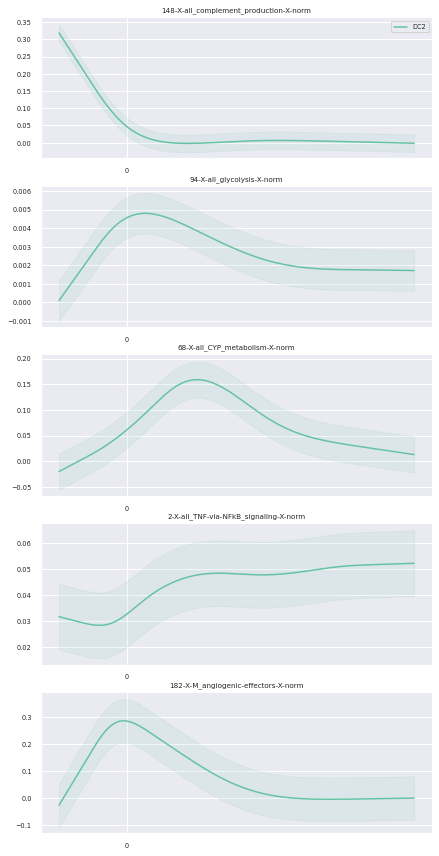

In [282]:
plot_gene_trends(trends_dict)
save_name = 'Bassez_M'+'DC'+str(DC_of_interest+1)+'_'+'trend.svg'
plt.savefig(fig_save_path+save_name)
print('saved to:',fig_save_path+save_name)

saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_MDC4_heatmap_trend.svg


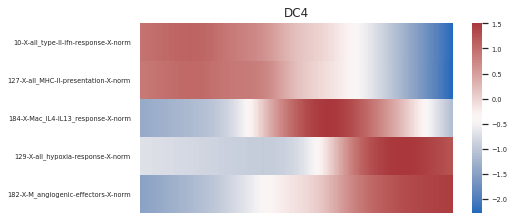

In [283]:
plot_gene_trend_heatmaps(trends_dict2,cmap='vlag')
save_name = 'Bassez_M'+'DC'+str(DC_of_interest+1)+'_'+'heatmap_trend.svg'
plt.savefig(fig_save_path+save_name)
print('saved to:',fig_save_path+save_name)